In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import pickle
import warnings
warnings.filterwarnings('ignore') 

In [2]:
training = pd.read_csv('/Users/enricoconte/Desktop/Tesi/Workspace_Tesi/dati/all_train.csv')
prog_data = pd.read_csv('/Users/enricoconte/Desktop/Tesi/Workspace_Tesi/dati/prognostic_data.csv')

print("shape is:", training.shape)
training.isna().sum()


shape is: (1736, 36)


Unnamed: 0       0
Sex              0
Age             54
CA              93
CK            1032
CREA            74
ALP            474
GGT            436
GLU             98
AST             98
ALT             96
LDH            303
PCR             97
KAL             80
NAT             73
UREA           676
WBC             63
RBC             63
HGB             63
HCT             63
MCV             63
MCH             63
MCHC            63
PLT1            63
NE             362
LY             362
MO             362
EO             362
BA             362
NET            362
LYT            362
MOT            362
EOT            362
BAT            362
Suspect          0
target           0
dtype: int64

In [3]:
print("shape is:", prog_data.shape)
prog_data.isna().sum()
prog_data

shape is: (4995, 27)


,MCV0,NE0,PLT10,RBC0,MPV0,MCH0,MOT0,BAT0,RDW0,NET0,...,HCT0,LYT0,MO0,Severity,Age,Sex,patid,id,Dead,patdate
0,91.1,46.1,200.0,4.620,10.60,31.2,0.7,0.1,12.0,3.1,...,42.1,2.7,10.4,0,49,1,A00808,A00808_2020-02-16,0,2020-02-16
1,91.5,53.2,209.0,4.830,10.40,31.1,0.6,0.0,12.2,3.6,...,44.2,2.4,8.8,0,49,1,A00808,A00808_2020-02-18,0,2020-02-18
2,93.3,NaN,152.0,4.350,9.90,32.9,NaN,NaN,11.6,NaN,...,40.6,NaN,NaN,1,77,1,A00323,A00323_2020-02-23,0,2020-02-23
3,82.4,NaN,231.0,3.905,10.65,25.2,NaN,NaN,22.1,NaN,...,32.2,NaN,NaN,0,73,0,A01096,A01096_2020-02-23,0,2020-02-23
4,84.1,78.0,103.0,3.460,11.00,29.2,0.3,0.0,13.0,4.1,...,29.1,0.8,6.6,0,69,0,A00124,A00124_2020-02-23,0,2020-02-23
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4990,83.9,68.4,52.0,3.290,NaN,27.7,0.5,0.0,15.5,5.1,...,27.6,1.5,7.2,0,76,1,A00765,A00765_2020-05-12,0,2020-05-12
4991,82.1,50.7,180.0,3.460,10.60,26.9,0.3,0.0,15.4,1.9,...,28.4,1.4,6.7,0,86,1,A01437,A01437_2020-05-12,0,2020-05-12
4992,90.9,56.3,103.0,3.730,14.50,28.2,0.7,0.0,16.8,4.0,...,33.9,1.4,10.2,0,81,0,A00316,A00316_2020-05-13,0,2020-05-13
4993,86.8,65.5,112.0,2.870,9.50,29.3,0.4,0.0,12.8,3.8,...,24.9,1.6,6.2,1,42,1,A00304,A00304_2020-05-13,0,2020-05-13


## Pre-processing

- Filtrare i dati di training per quelli del San Raffaele. Ovvero con tag nella forma "A0....."

In [4]:
training = training.rename(columns={'Unnamed: 0':'id'})
training = training.sort_values(by='id')


## Faccio un filtraggio dei dati per formato dell'ID in modo da isolare quelli del San Raffaele
regex = '^[A].*'

train_filtered = training[training['id'].str.contains(regex)]

print("Primo Filtraggio", train_filtered.head(5))





# Filtro per i valori per i quali ho disponibili i range di variabilità analitica e biologica
lista_var = ['id', 'target', 'Sex', 'Age','ALT', 'AST', 'ALP', 'GGT', 'LDH', 'CK', 'K', 'Na', 'CA', 'GLU', 'UREA', 'CREA', 'CRP', 'WBC', 'RBC', 'HBG', 'HCT', 'PLT', 'NE', 'LY', 'MO', 'EO', 'BA']
train_filtered2 = train_filtered.filter(items=lista_var)


print("Secondo Filtraggio", train_filtered2.head(5))

#A fine del secondo filtraggio ho ricmposto il dataset iniziale ma ho filtrato per le variabili di cui ho info, mi rimangono da sistemare i valori NAN


# Il dataset finale avrà i valori NAN rimepiti con metodo di interpolazione lineare
train_final = train_filtered2.interpolate(method = 'linear')
train_final = train_final.sample(frac = 1)
train_final = train_final.interpolate(method = 'linear')


# Estraggo le variabili codificate su livelli binari per utilizzarle dopo
labels = train_final.iloc[:,1]
sex = train_final.iloc[:,2]
age = train_final.iloc[:,3]

idd = train_final.iloc[:,0]

train_final.head(5)



Primo Filtraggio                     id  Sex   Age    CA    CK  CREA    ALP   GGT    GLU   AST  \
264  A00002_2020-03-24  0.0  51.0  2.18   NaN  0.53   67.0  31.0  102.0  25.0   
88   A00003_2020-03-27  1.0  87.0  2.09   NaN  1.26   58.0  83.0  112.0  43.0   
870  A00004_2020-04-19  1.0  33.0  2.39   NaN  1.00   68.0  94.5   90.0  51.0   
214  A00005_2020-04-09  0.0  44.0  2.28  64.0  0.62   75.0  13.0   90.0  23.0   
152  A00006_2020-04-13  0.0  80.0  1.99   NaN  0.58  166.0  52.0  109.0  63.0   

     ...    MO   EO   BA    NET   LYT   MOT  EOT  BAT  Suspect  target  
264  ...   8.6  1.1  0.7   7.30  3.10  1.00  0.1  0.1      1.0       1  
88   ...   6.8  0.0  0.0   3.30  0.50  0.30  0.0  0.0      1.0       1  
870  ...  13.4  1.8  0.4   3.95  0.65  0.55  0.1  0.0      1.0       0  
214  ...   6.9  0.6  0.3   4.30  2.10  0.50  0.0  0.0      0.5       0  
152  ...   3.1  0.1  0.3  19.70  1.80  0.70  0.0  0.1      1.0       0  

[5 rows x 36 columns]
Secondo Filtraggio                 

,id,target,Sex,Age,ALT,AST,ALP,GGT,LDH,CK,...,UREA,CREA,WBC,RBC,HCT,NE,LY,MO,EO,BA
97,A01328_2020-03-04,1,0.0,60.0,32.0,38.0,27.0,26.0,292.0,323.470588,...,107.5,0.820,3.30,4.34,37.10,58.0,39.00,2.00,0.0,1.0
871,A01671_2020-03-11,1,1.0,85.0,14.0,27.0,42.5,21.5,420.0,610.000000,...,83.0,2.250,10.35,2.94,28.60,70.0,14.00,6.00,0.0,1.0
663,A00762_2020-04-03,0,1.0,87.0,19.0,39.0,131.0,14.5,471.5,38.500000,...,141.0,2.605,21.15,4.35,35.15,83.4,8.35,7.65,0.4,0.2
734,A00219_2020-03-20,1,1.0,63.0,57.0,52.5,45.5,119.0,318.0,147.500000,...,26.5,0.890,5.20,4.69,40.20,67.4,23.70,8.10,0.6,0.2
427,A01521_2020-03-18,1,1.0,63.0,23.0,23.0,139.0,51.0,202.0,66.600000,...,20.0,0.730,6.70,5.08,43.30,74.4,12.90,11.90,0.3,0.5


In [229]:

pd.set_option('display.max_columns', None)
train_final

,id,target,Sex,Age,ALT,AST,ALP,GGT,LDH,CK,CA,GLU,UREA,CREA,WBC,RBC,HCT,NE,LY,MO,EO,BA,patid
1,A01671_2020-03-11,1,1.0,85.0,14.0,27.0,42.5,21.5,420.0,610.000000,2.170,144.5,83.0,2.250,10.35,2.940,28.60,70.0,14.00,6.00,0.00,1.00,A00762
2,A00762_2020-04-03,0,1.0,87.0,19.0,39.0,131.0,14.5,471.5,38.500000,1.950,107.5,141.0,2.605,21.15,4.350,35.15,83.4,8.35,7.65,0.40,0.20,A00219
3,A00219_2020-03-20,1,1.0,63.0,57.0,52.5,45.5,119.0,318.0,147.500000,2.080,88.0,26.5,0.890,5.20,4.690,40.20,67.4,23.70,8.10,0.60,0.20,A01521
4,A01521_2020-03-18,1,1.0,63.0,23.0,23.0,139.0,51.0,202.0,66.600000,2.310,164.0,20.0,0.730,6.70,5.080,43.30,74.4,12.90,11.90,0.30,0.50,A00500
5,A00500_2020-04-08,0,0.0,66.0,14.0,20.0,40.0,11.0,248.0,79.000000,2.480,80.0,50.0,1.040,6.80,4.230,36.00,74.8,15.00,8.40,0.90,0.90,A00741
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1384,A00925_2020-04-12,0,1.0,28.0,30.0,32.0,57.0,14.0,205.0,460.000000,2.380,90.0,26.0,1.100,8.20,4.650,44.30,60.7,28.50,8.60,1.60,0.60,A00989
1385,A00989_2020-03-31,1,0.0,81.0,31.0,46.5,72.0,253.0,647.5,42.000000,2.095,106.0,45.5,0.815,7.55,4.285,37.45,88.2,8.75,2.30,0.25,0.50,A00144
1386,A00144_2020-03-27,0,1.0,73.0,28.5,41.5,66.0,16.0,297.0,220.111111,2.255,113.0,32.0,0.850,13.45,4.930,45.50,84.2,9.45,6.00,0.10,0.25,A00205
1387,A00205_2020-02-28,0,0.0,93.0,30.0,53.0,80.0,34.0,230.0,221.000000,2.220,215.0,153.0,1.220,5.00,2.950,29.20,68.7,11.70,18.80,0.40,0.40,NaN


## Modello Generativo con rumore Gaussiano semplice, uso gli stessi parametri di variabilità per sani e malati

In [7]:
test = train_final.iloc[:, 3:]
test = test.join(train_final['target'])
test

,Age,ALT,AST,ALP,GGT,LDH,CK,CA,GLU,UREA,CREA,WBC,RBC,HCT,NE,LY,MO,EO,BA,target
97,60.0,32.0,38.0,27.0,26.0,292.0,323.470588,2.110,89.0,107.5,0.820,3.30,4.340,37.10,58.0,39.00,2.00,0.00,1.00,1
871,85.0,14.0,27.0,42.5,21.5,420.0,610.000000,2.170,144.5,83.0,2.250,10.35,2.940,28.60,70.0,14.00,6.00,0.00,1.00,1
663,87.0,19.0,39.0,131.0,14.5,471.5,38.500000,1.950,107.5,141.0,2.605,21.15,4.350,35.15,83.4,8.35,7.65,0.40,0.20,0
734,63.0,57.0,52.5,45.5,119.0,318.0,147.500000,2.080,88.0,26.5,0.890,5.20,4.690,40.20,67.4,23.70,8.10,0.60,0.20,1
427,63.0,23.0,23.0,139.0,51.0,202.0,66.600000,2.310,164.0,20.0,0.730,6.70,5.080,43.30,74.4,12.90,11.90,0.30,0.50,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1370,28.0,30.0,32.0,57.0,14.0,205.0,460.000000,2.380,90.0,26.0,1.100,8.20,4.650,44.30,60.7,28.50,8.60,1.60,0.60,0
119,81.0,31.0,46.5,72.0,253.0,647.5,42.000000,2.095,106.0,45.5,0.815,7.55,4.285,37.45,88.2,8.75,2.30,0.25,0.50,1
860,73.0,28.5,41.5,66.0,16.0,297.0,220.111111,2.255,113.0,32.0,0.850,13.45,4.930,45.50,84.2,9.45,6.00,0.10,0.25,0
28,93.0,30.0,53.0,80.0,34.0,230.0,221.000000,2.220,215.0,153.0,1.220,5.00,2.950,29.20,68.7,11.70,18.80,0.40,0.40,0


In [8]:
# Considero ogni osservazione e genero una versione perturbata secondo i parametri segnalati dalla Dott.Carobene.

def perturba_dati(w_a, w_b):

        for column in test:
                lista_noise  = []


        #print(test[column])

                if column == "ALT":
                        for i in np.arange(0,len(test)): 


                                sigma_analytical = (test[column].iloc[i] * 0.04) / 10
                                sigma_biological = (test[column].iloc[i] * 0.093) / 10
                                noise = abs(np.random.normal(test[column].iloc[i], (w_a*sigma_analytical + w_b*sigma_biological) ))
                                lista_noise.append(noise)
                        

                if column == "AST":
                        for i in np.arange(0,len(test)):


                                sigma_analytical = (test[column].iloc[i] * 0.04) / 10
                                sigma_biological = (test[column].iloc[i] * 0.095) / 10
                                noise = abs(np.random.normal(test[column].iloc[i], (w_a*sigma_analytical + w_b*sigma_biological) ))
                                lista_noise.append(noise)


                if column == "GGT":
                        for i in np.arange(0,len(test)):
                                
                                sigma_analytical = (test[column].iloc[i] * 0.035) / 10
                                sigma_biological = (test[column].iloc[i] * 0.089) / 10  
                                noise = abs(np.random.normal(test[column].iloc[i], (w_a*sigma_analytical + w_b*sigma_biological) ))
                                lista_noise.append(noise)


                if column == "ALP":
                        for i in np.arange(0,len(test)):

                                sigma_analytical = (test[column].iloc[i] * 0.05) / 10
                                sigma_biological = (test[column].iloc[i] * 0.053) / 10 
                                noise = abs(np.random.normal(test[column].iloc[i], (w_a*sigma_analytical + w_b*sigma_biological) ))
                                lista_noise.append(noise)

                if column == "LDH":
                        for i in np.arange(0,len(test)):

                                sigma_analytical = (test[column].iloc[i] * 0.03) / 10
                                sigma_biological = (test[column].iloc[i] * 0.052) / 10                                                
                                noise = abs(np.random.normal(test[column].iloc[i], (w_a*sigma_analytical + w_b*sigma_biological) ))
                                lista_noise.append(noise)

                if column == "CK":
                        for i in np.arange(0,len(test)):

                                sigma_analytical = (test[column].iloc[i] * 0.05) / 10
                                sigma_biological = (test[column].iloc[i] * 0.145) / 10 
                                noise = abs(np.random.normal(test[column].iloc[i], (w_a*sigma_analytical + w_b*sigma_biological) ))
                                lista_noise.append(noise)

                if column == "NA":
                        for i in np.arange(0,len(test)):

                                sigma_analytical = (test[column].iloc[i] * 0.008) / 10
                                sigma_biological = (test[column].iloc[i] * 0.005) / 10 
                                noise = abs(np.random.normal(test[column].iloc[i], (w_a*sigma_analytical + w_b*sigma_biological) ))
                                lista_noise.append(noise)

                if column == "K":
                        for i in np.arange(0,len(test)):

                                sigma_analytical = (test[column].iloc[i] * 0.012) / 10
                                sigma_biological = (test[column].iloc[i] * 0.039) / 10 
                                noise = abs(np.random.normal(test[column].iloc[i], (w_a*sigma_analytical + w_b*sigma_biological) ))
                                lista_noise.append(noise)

                if column == "CA":
                        for i in np.arange(0,len(test)):

                                sigma_analytical = (test[column].iloc[i] * 0.03) / 10
                                sigma_biological = (test[column].iloc[i] * 0.018) / 10 
                                noise = abs(np.random.normal(test[column].iloc[i], (w_a*sigma_analytical + w_b*sigma_biological) ))
                                lista_noise.append(noise)

                if column == "GLU":
                        for i in np.arange(0,len(test)):
                                sigma_analytical = (test[column].iloc[i] * 0.028) / 10
                                sigma_biological = (test[column].iloc[i] * 0.047) / 10 
                                noise = abs(np.random.normal(test[column].iloc[i], (w_a*sigma_analytical + w_b*sigma_biological) ))
                                lista_noise.append(noise)

                if column == "UREA":
                        for i in np.arange(0,len(test)):

                                sigma_analytical = (test[column].iloc[i] * 0.03) / 10
                                sigma_biological = (test[column].iloc[i] * 0.141) / 10 
                                noise = abs(np.random.normal(test[column].iloc[i], (w_a*sigma_analytical + w_b*sigma_biological) ))
                                lista_noise.append(noise)

                if column == "CREA":
                        for i in np.arange(0,len(test)):

                                sigma_analytical = (test[column].iloc[i] * 0.025) / 10
                                sigma_biological = (test[column].iloc[i] * 0.044) / 10 
                                noise = abs(np.random.normal(test[column].iloc[i], (w_a*sigma_analytical + w_b*sigma_biological) ))
                                lista_noise.append(noise)

                if column == "CRP":
                        for i in np.arange(0,len(test)):

                                sigma_analytical = (test[column].iloc[i] * 0.111) / 10
                                sigma_biological = (test[column].iloc[i] * 0.294) / 10 
                                noise = abs(np.random.normal(test[column].iloc[i], (w_a*sigma_analytical + w_b*sigma_biological) ))
                                lista_noise.append(noise)

                if column == "WBC":
                        for i in np.arange(0,len(test)):

                                sigma_analytical = (test[column].iloc[i] * 0.019) / 10
                                sigma_biological = (test[column].iloc[i] * 0.111) / 10 
                                noise = abs(np.random.normal(test[column].iloc[i], (w_a*sigma_analytical + w_b*sigma_biological) ))
                                lista_noise.append(noise)

                if column == "RBC":
                        for i in np.arange(0,len(test)):

                                sigma_analytical = (test[column].iloc[i] * 0.009) / 10
                                sigma_biological = (test[column].iloc[i] * 0.018) / 10 
                                noise = abs(np.random.normal(test[column].iloc[i], (w_a*sigma_analytical + w_b*sigma_biological) ))
                                lista_noise.append(noise)

                if column == "HBG":
                        for i in np.arange(0,len(test)):

                                sigma_analytical = (test[column].iloc[i] * 0.007) / 10
                                sigma_biological = (test[column].iloc[i] * 0.02) / 10 
                                noise = abs(np.random.normal(test[column].iloc[i], (w_a*sigma_analytical + w_b*sigma_biological) ))
                                lista_noise.append(noise)


                if column == "HCT":
                        for i in np.arange(0,len(test)):
                                sigma_analytical = (test[column].iloc[i] * 0.018) / 10
                                sigma_biological = (test[column].iloc[i] * 0.024) / 10 
                                noise = abs(np.random.normal(test[column].iloc[i], (w_a*sigma_analytical + w_b*sigma_biological) ))
                                lista_noise.append(noise)


                if column == "PLT":
                        for i in np.arange(0,len(test)):

                                sigma_analytical = (test[column].iloc[i] * 0.018) / 10
                                sigma_biological = (test[column].iloc[i] * 0.072) / 10 
                                noise = abs(np.random.normal(test[column].iloc[i], (w_a*sigma_analytical + w_b*sigma_biological) ))
                                lista_noise.append(noise)

                if column == "NE":
                        for i in np.arange(0,len(test)):

                                sigma_analytical = (test[column].iloc[i] * 0.03) / 10
                                sigma_biological = (test[column].iloc[i] * 0.146) / 10 
                                noise = abs(np.random.normal(test[column].iloc[i], (w_a*sigma_analytical + w_b*sigma_biological) ))
                                lista_noise.append(noise)

                if column == "LY":
                        for i in np.arange(0,len(test)):

                                sigma_analytical = (test[column].iloc[i] * 0.036) / 10
                                sigma_biological = (test[column].iloc[i] * 0.11) / 10 
                                noise = abs(np.random.normal(test[column].iloc[i], (w_a*sigma_analytical + w_b*sigma_biological) ))
                                lista_noise.append(noise)

                if column == "MO":
                        for i in np.arange(0,len(test)):

                                sigma_analytical = (test[column].iloc[i] * 0.063) / 10
                                sigma_biological = (test[column].iloc[i] * 0.134) / 10 
                                noise = abs(np.random.normal(test[column].iloc[i], (w_a*sigma_analytical + w_b*sigma_biological) ))
                                lista_noise.append(noise)

                if column == "EO":
                        for i in np.arange(0,len(test)):

                                sigma_analytical = (test[column].iloc[i] * 0.079) / 10
                                sigma_biological = (test[column].iloc[i] * 0.156) / 10 
                                noise = abs(np.random.normal(test[column].iloc[i], (w_a*sigma_analytical + w_b*sigma_biological) ))
                                lista_noise.append(noise)

                if column == "BA":

                        for i in np.arange(0,len(test)):
                                sigma_analytical = (test[column].iloc[i] * 0.031) / 10
                                sigma_biological = (test[column].iloc[i] * 0.128) / 10 
                                noise = abs(np.random.normal(test[column].iloc[i], (w_a*sigma_analytical + w_b*sigma_biological) )) 
                                lista_noise.append(noise)

                if column == "Age":

                        for i in np.arange(0,len(test)):

                                noise = abs(np.random.normal(test[column].iloc[i], 0 ))
                                lista_noise.append(noise)

                        

                noised_df = pd.DataFrame(lista_noise, columns=[f'{column}'])
                noised_df.to_csv(f'/Users/enricoconte/Desktop/Tesi/Workspace_Tesi/dati/noised_data/df_{column}.csv')

In [9]:
import os

# Listo tutti i files nella directory per controllare che ci siano tutti.
basepath = '/Users/enricoconte/Desktop/Tesi/Workspace_Tesi/dati/noised_data/'
for entry in os.listdir(basepath):
    if os.path.isfile(os.path.join(basepath, entry)):
        print(entry)

# perturbo i dati con pesi 1 e 1 (ovvero con  sigma = somma di variabilità analitica e biologica)

perturba_dati(w_a = 1, w_b = 1)


# Importo i le singole covariate e ricostriusco il dataset
df_Age = pd.read_csv('dati/noised_data/df_Age.csv')
df_ALP = pd.read_csv('dati/noised_data/df_ALP.csv')
df_ALT = pd.read_csv('dati/noised_data/df_ALT.csv')
df_AST = pd.read_csv('dati/noised_data/df_AST.csv')
df_BA = pd.read_csv('dati/noised_data/df_BA.csv')
df_CA = pd.read_csv('dati/noised_data/df_CA.csv')
df_CK = pd.read_csv('dati/noised_data/df_CK.csv')
df_CREA = pd.read_csv('dati/noised_data/df_CREA.csv')
df_EO = pd.read_csv('dati/noised_data/df_EO.csv')
df_GGT = pd.read_csv('dati/noised_data/df_GGT.csv')
df_GLU = pd.read_csv('dati/noised_data/df_GLU.csv')
df_HCT = pd.read_csv('dati/noised_data/df_HCT.csv')
df_LDH = pd.read_csv('dati/noised_data/df_LDH.csv')
df_LY = pd.read_csv('dati/noised_data/df_LY.csv')
df_MO = pd.read_csv('dati/noised_data/df_MO.csv')
df_NE = pd.read_csv('dati/noised_data/df_NE.csv')
df_RBC = pd.read_csv('dati/noised_data/df_RBC.csv')
df_UREA = pd.read_csv('dati/noised_data/df_UREA.csv')
df_WBC = pd.read_csv('dati/noised_data/df_WBC.csv')

labels = pd.DataFrame(labels, columns=['target']).reset_index()
sex = pd.DataFrame(sex).reset_index()
idd = pd.DataFrame(idd).reset_index()

result = pd.concat([idd, labels.iloc[:,1], sex.iloc[:,1], df_Age.iloc[:,1], df_ALP.iloc[:,1], df_ALT.iloc[:,1], df_AST.iloc[:,1], df_BA.iloc[:,1], df_CA.iloc[:,1], df_CK.iloc[:,1], df_CREA.iloc[:,1], df_EO.iloc[:,1], df_GGT.iloc[:,1], df_GLU.iloc[:,1], df_HCT.iloc[:,1], df_LDH.iloc[:,1], df_LY.iloc[:,1], df_MO.iloc[:,1], df_NE.iloc[:,1], df_RBC.iloc[:,1], df_UREA.iloc[:,1], df_WBC.iloc[:,1]],  axis=1)


result.to_csv('dati/noised_data/dati_perturbati.csv')


df_CK.csv
dati_perturbati.csv
df_LDH.csv
df_UREA.csv
df_EO.csv
df_CREA.csv
df_ALP.csv
df_GLU.csv
df_RBC.csv
df_ALT.csv
df_WBC.csv
df_HCT.csv
df_MO.csv
df_BA.csv
df_target.csv
df_Age.csv
df_CA.csv
df_GGT.csv
df_LY.csv
df_AST.csv
df_NE.csv


In [10]:
# processed
result

,index,id,target,Sex,Age,ALP,ALT,AST,BA,CA,...,GGT,GLU,HCT,LDH,LY,MO,NE,RBC,UREA,WBC
0,97,A01328_2020-03-04,1,0.0,60.0,26.650696,32.183646,37.505790,1.011503,2.111019,...,25.961333,89.230586,36.922125,294.478504,40.446237,2.035730,59.498426,4.341320,106.847455,3.263194
1,871,A01671_2020-03-11,1,1.0,85.0,42.479682,14.102675,27.269339,1.035048,2.176400,...,21.275710,146.044954,28.497063,415.165571,13.863795,6.052129,69.257339,2.946273,82.436602,10.588415
2,663,A00762_2020-04-03,0,1.0,87.0,132.023076,19.245572,38.638869,0.200074,1.943006,...,14.395688,107.400369,34.980857,477.744405,8.139275,7.545889,82.547141,4.336927,140.034188,21.262309
3,734,A00219_2020-03-20,1,1.0,63.0,45.734080,57.187378,53.012634,0.198878,2.079843,...,120.294418,87.960944,40.288854,315.471845,23.635749,8.046581,68.187021,4.693319,27.116475,5.174600
4,427,A01521_2020-03-18,1,1.0,63.0,139.599553,23.042431,23.329080,0.506194,2.325526,...,51.433816,162.690107,43.268989,200.929398,12.623398,12.152875,74.704781,5.060403,20.880043,6.718129
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1384,1370,A00925_2020-04-12,0,1.0,28.0,56.651559,30.239124,31.445079,0.583985,2.392081,...,14.044850,90.187281,44.293059,203.897425,28.658156,8.445913,62.924633,4.675979,26.416742,8.218902
1385,119,A00989_2020-03-31,1,0.0,81.0,73.089976,30.005369,47.179580,0.506123,2.079921,...,249.802713,107.361781,37.557989,646.844645,8.674251,2.281308,87.801212,4.266083,45.268891,7.612742
1386,860,A00144_2020-03-27,0,1.0,73.0,67.372358,28.496221,42.357249,0.246348,2.260841,...,15.706757,113.199088,45.856378,292.543477,9.412783,6.062349,85.675015,4.967971,32.185424,13.576305
1387,28,A00205_2020-02-28,0,0.0,93.0,80.728341,29.916194,52.341476,0.397551,2.222109,...,33.930937,212.865001,29.353939,231.035823,11.793629,18.645366,68.738130,2.957919,153.252674,5.026114


In [11]:
train_final


,id,target,Sex,Age,ALT,AST,ALP,GGT,LDH,CK,...,UREA,CREA,WBC,RBC,HCT,NE,LY,MO,EO,BA
97,A01328_2020-03-04,1,0.0,60.0,32.0,38.0,27.0,26.0,292.0,323.470588,...,107.5,0.820,3.30,4.340,37.10,58.0,39.00,2.00,0.00,1.00
871,A01671_2020-03-11,1,1.0,85.0,14.0,27.0,42.5,21.5,420.0,610.000000,...,83.0,2.250,10.35,2.940,28.60,70.0,14.00,6.00,0.00,1.00
663,A00762_2020-04-03,0,1.0,87.0,19.0,39.0,131.0,14.5,471.5,38.500000,...,141.0,2.605,21.15,4.350,35.15,83.4,8.35,7.65,0.40,0.20
734,A00219_2020-03-20,1,1.0,63.0,57.0,52.5,45.5,119.0,318.0,147.500000,...,26.5,0.890,5.20,4.690,40.20,67.4,23.70,8.10,0.60,0.20
427,A01521_2020-03-18,1,1.0,63.0,23.0,23.0,139.0,51.0,202.0,66.600000,...,20.0,0.730,6.70,5.080,43.30,74.4,12.90,11.90,0.30,0.50
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1370,A00925_2020-04-12,0,1.0,28.0,30.0,32.0,57.0,14.0,205.0,460.000000,...,26.0,1.100,8.20,4.650,44.30,60.7,28.50,8.60,1.60,0.60
119,A00989_2020-03-31,1,0.0,81.0,31.0,46.5,72.0,253.0,647.5,42.000000,...,45.5,0.815,7.55,4.285,37.45,88.2,8.75,2.30,0.25,0.50
860,A00144_2020-03-27,0,1.0,73.0,28.5,41.5,66.0,16.0,297.0,220.111111,...,32.0,0.850,13.45,4.930,45.50,84.2,9.45,6.00,0.10,0.25
28,A00205_2020-02-28,0,0.0,93.0,30.0,53.0,80.0,34.0,230.0,221.000000,...,153.0,1.220,5.00,2.950,29.20,68.7,11.70,18.80,0.40,0.40


In [12]:
train_final.to_csv('dati/dati_originali.csv')

## Analisi Descrittiva

In [588]:
def violin(dati, colonna):
    fig, ax = plt.subplots(figsize=(10, 4))

    sns.kdeplot(dati.loc[dati["target"] == 0][colonna], color='blue', ax=ax)

    x = ax.lines[-1].get_xdata()
    y = ax.lines[-1].get_ydata()

    for p in ax.patches:  
        p.set_height(-p.get_height())
    for l in ax.lines:  
        l.set_ydata(-l.get_ydata())

    ax.fill_between(x, 0, -y, color='blue', alpha=0.3)

    sns.kdeplot(dati.loc[dati["target"] == 1][colonna], shade = True, color = "violet")

    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)

    pos_ticks = np.array([t for t in ax.get_yticks() if t > 0])
    ticks = np.concatenate([-pos_ticks[::-1], [0], pos_ticks])

    ax.set_yticks(ticks)
    ax.set_yticklabels([f'{abs(t):.2f}' for t in ticks])
    ax.spines['bottom'].set_position('zero')
    plt.legend([],[], frameon=False)

    plt.xlabel(r"Value", horizontalalignment = "right", x=1.0, size = 15)
    plt.yticks(size = 14)
    plt.legend([],[], frameon=False)
    plt.ylabel("Density of probability", fontsize = 15)
    plt.title("{}".format(colonna), fontsize = 20)

In [589]:
def violin2(dati, colonna):
    fig, ax = plt.subplots(figsize=(10, 4))

    sns.kdeplot(dati.loc[dati["Target"] == 0][colonna], color='blue', ax=ax)

    x = ax.lines[-1].get_xdata()
    y = ax.lines[-1].get_ydata()

    for p in ax.patches:  
        p.set_height(-p.get_height())
    for l in ax.lines:  
        l.set_ydata(-l.get_ydata())

    ax.fill_between(x, 0, -y, color='blue', alpha=0.3)

    sns.kdeplot(dati.loc[dati["Target"] == 1][colonna], shade = True, color = "violet")

    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)

    pos_ticks = np.array([t for t in ax.get_yticks() if t > 0])
    ticks = np.concatenate([-pos_ticks[::-1], [0], pos_ticks])

    ax.set_yticks(ticks)
    ax.set_yticklabels([f'{abs(t):.2f}' for t in ticks])
    ax.spines['bottom'].set_position('zero')
    plt.legend([],[], frameon=False)

    plt.xlabel(r"Value", horizontalalignment = "right", x=1.0, size = 15)
    plt.yticks(size = 14)
    plt.legend([],[], frameon=False)
    plt.ylabel("Density of probability", fontsize = 15)
    plt.title("{}".format(colonna), fontsize = 20)

In [534]:
df_original.iloc[:,4:-1]

,Age,ALT,AST,ALP,GGT,LDH,CK,CA,GLU,UREA,CREA,WBC,RBC,HCT,NE,LY,MO,EO,BA
0,63.0,99.0,66.0,278.0,235.000000,221.0,74.600000,2.17,118.0,22.000000,0.520000,9.900000,4.130000,34.300000,79.40,11.600,6.800,1.60,0.6
1,40.0,21.0,17.0,36.0,21.000000,179.0,75.600000,2.27,75.0,17.000000,0.790000,10.500000,4.560000,42.100000,56.00,35.700,6.100,1.60,0.6
2,35.0,106.0,50.0,78.0,54.000000,193.0,145.200000,2.49,77.0,26.666667,0.990000,10.100000,5.040000,43.300000,68.95,19.750,7.550,3.35,0.4
3,32.0,26.0,23.0,54.0,25.000000,199.0,113.000000,2.32,84.0,27.000000,1.180000,9.100000,5.500000,48.800000,52.40,30.200,15.300,1.10,1.0
4,73.0,36.0,44.0,69.0,28.000000,216.0,126.000000,2.10,112.0,30.000000,1.070000,14.000000,4.610000,42.000000,78.75,16.025,4.825,0.30,0.1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1383,83.0,16.5,25.0,45.0,7.000000,141.5,288.000000,2.00,197.0,156.000000,2.003333,8.133333,2.296667,24.700000,89.50,4.500,1.000,0.00,0.0
1384,73.0,37.0,34.0,49.0,78.000000,243.0,39.000000,2.17,107.0,17.666667,0.820000,7.100000,5.480000,48.500000,74.30,14.900,10.100,0.30,0.4
1385,58.0,98.0,68.0,109.0,212.000000,721.0,88.500000,1.96,111.5,38.500000,0.986667,13.666667,4.920000,43.733333,91.15,5.150,2.300,0.90,0.5
1386,60.0,21.0,23.0,58.0,11.000000,300.0,54.777778,2.45,103.0,28.000000,0.730000,5.300000,4.580000,41.300000,62.90,27.200,7.700,1.30,0.9


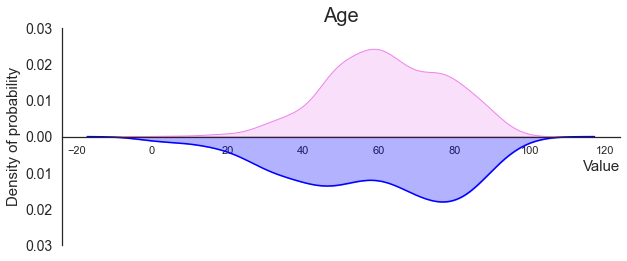

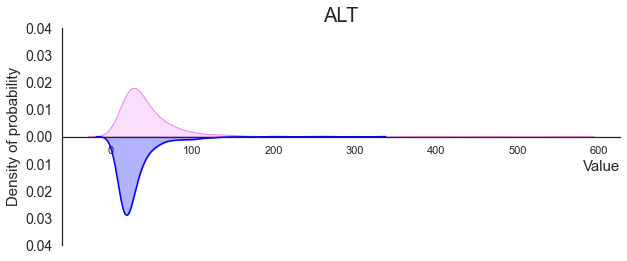

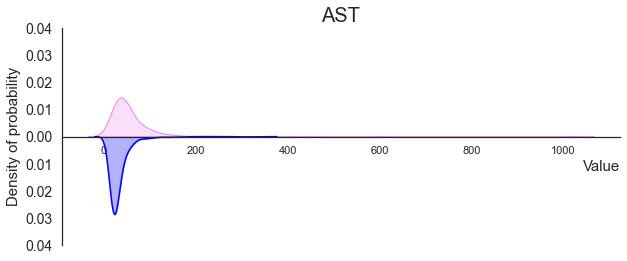

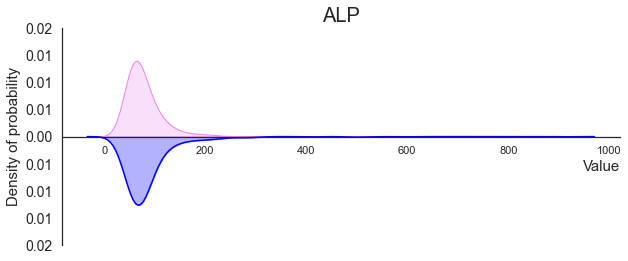

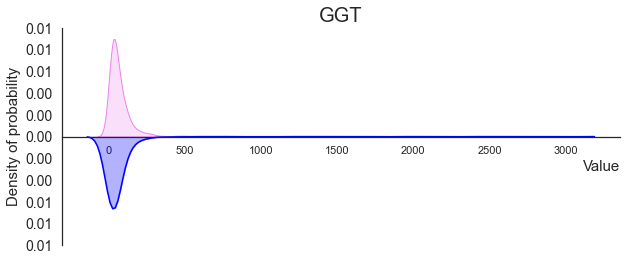

...

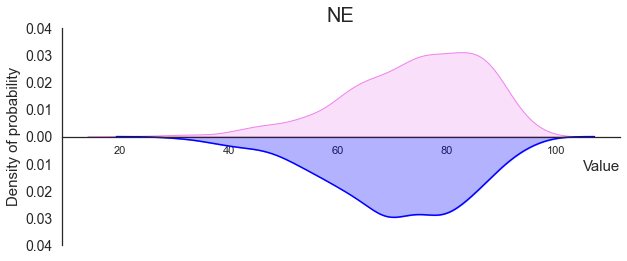

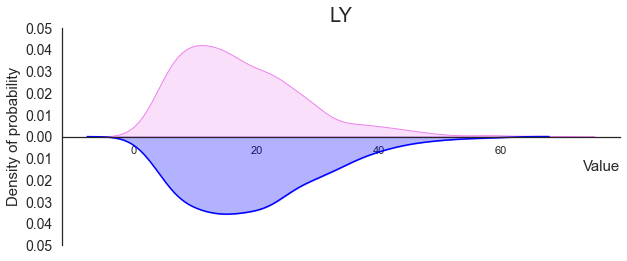

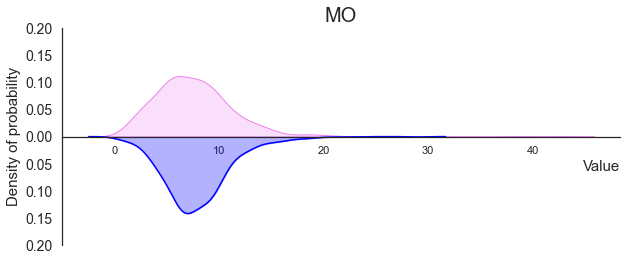

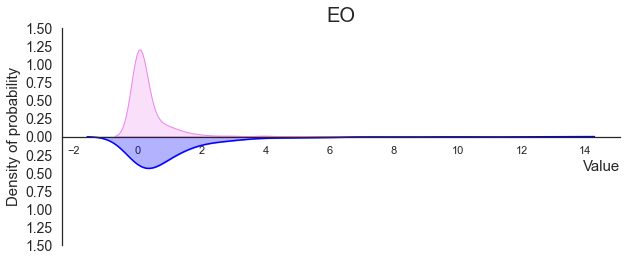

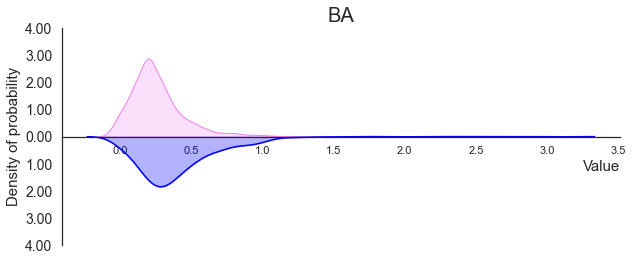

In [590]:
# ANALISI DESCRITTIVA DATASET TRAINING ORIGINALE
df_original = pd.read_csv('/Users/enricoconte/Desktop/Tesi/Workspace_Tesi/dati/dati_originali.csv')

cont_var = df_original.iloc[:,4:-1]


for variabile in cont_var: 
    violin(df_original, variabile)
    plt.savefig('/Users/enricoconte/Desktop/Tesi/Workspace_Tesi/grafici/df_originale/{variabile}_originale.png'.format(variabile = variabile))
    
    


In [762]:
new_df.iloc[:,4:-1]

,Age,ALT,AST,ALP,GGT,LDH,CK,CA,GLU,UREA,CREA,WBC,RBC,HCT,NE,LY,MO,EO,BA
12,58.0,29.0,27.0,66.00,26.000000,275.000000,101.5,2.040,105.0,21.0,0.81,7.700000,5.090000,40.500000,77.800000,14.800000,7.200000,0.100000,0.100000
16,42.0,25.0,22.0,52.00,8.000000,176.000000,252.5,2.310,77.0,25.0,0.64,6.300000,4.050000,34.900000,69.100000,23.800000,5.200000,1.400000,0.500000
20,51.0,30.0,40.0,59.00,31.000000,370.000000,202.2,2.150,104.0,24.0,1.00,8.300000,4.900000,40.900000,82.700000,9.500000,7.700000,0.000000,0.100000
59,45.0,47.0,34.0,71.00,37.000000,244.000000,63.0,2.340,102.0,67.0,1.17,8.700000,4.790000,41.400000,80.650000,10.100000,8.950000,0.000000,0.300000
72,76.0,46.0,66.0,62.50,41.000000,262.666667,256.5,2.240,100.0,23.0,0.73,9.800000,4.380000,38.850000,75.400000,13.900000,10.400000,0.100000,0.200000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1361,65.0,34.5,30.5,71.00,26.000000,337.000000,94.5,2.185,111.5,46.0,1.18,10.333333,4.893333,44.566667,70.466667,17.833333,11.166667,0.266667,0.266667
1363,64.0,65.0,45.0,70.00,55.000000,280.000000,54.0,2.300,88.0,55.0,1.40,7.700000,4.670000,43.000000,70.700000,21.300000,7.300000,0.400000,0.300000
1365,58.0,30.0,36.0,98.00,40.500000,420.000000,92.6,2.200,114.0,44.0,1.06,7.650000,4.745000,41.000000,82.200000,11.600000,5.850000,0.150000,0.200000
1366,77.0,15.5,29.5,102.75,141.250000,298.000000,86.0,2.170,90.0,33.0,0.82,5.500000,4.625000,40.100000,65.800000,23.600000,10.200000,0.200000,0.200000


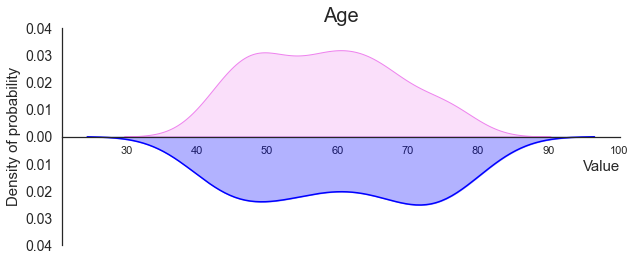

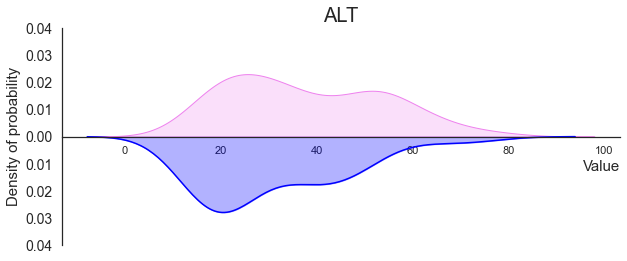

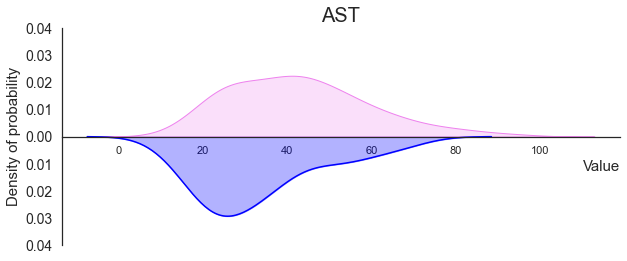

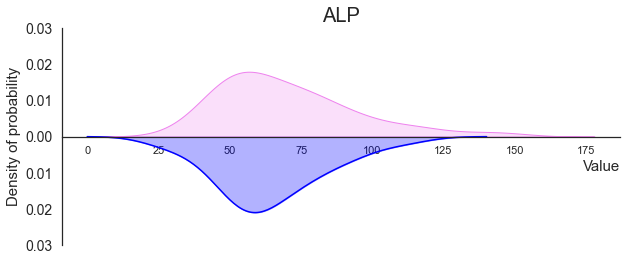

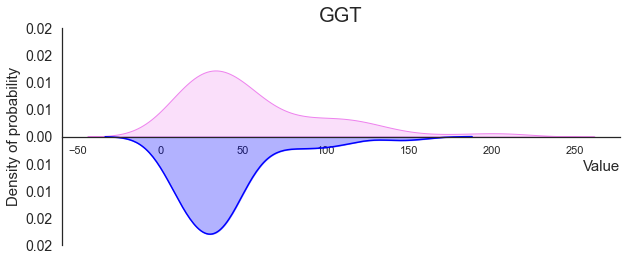

...

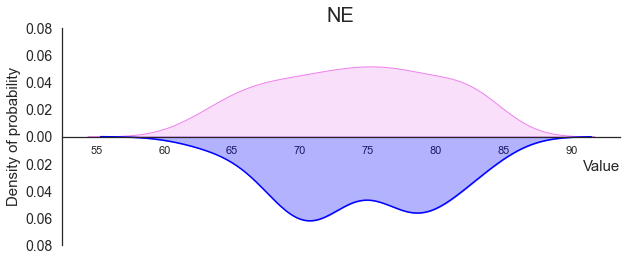

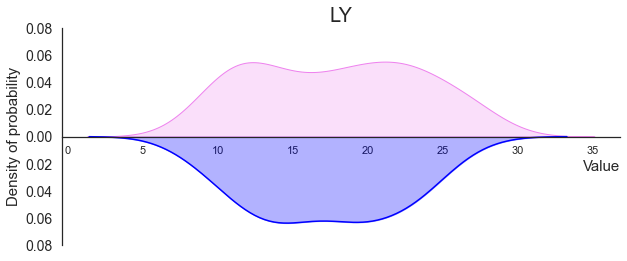

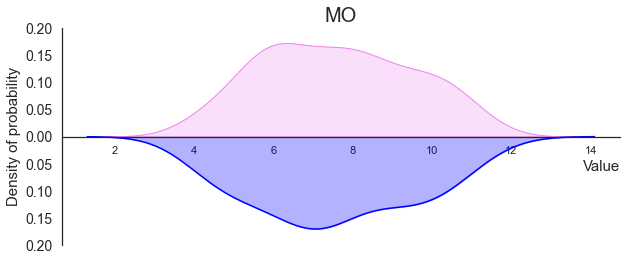

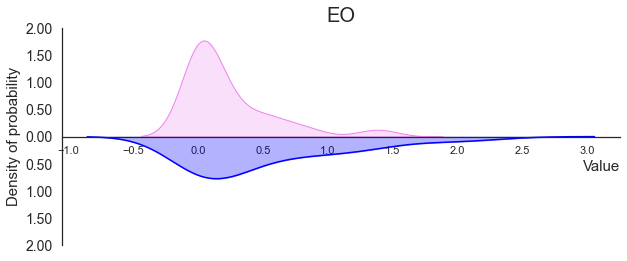

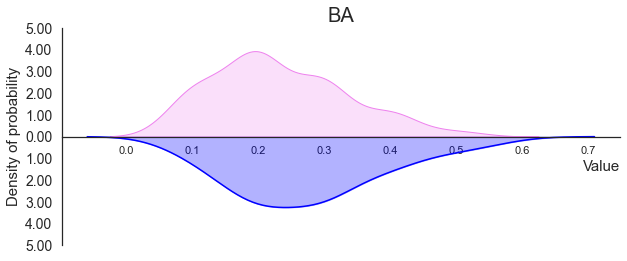

In [763]:
# ANALISI DESCRITTIVA DATASET TRAINING ORIGINALE
df_original = pd.read_csv('/Users/enricoconte/Desktop/Tesi/Workspace_Tesi/dati/dati_originali.csv')

cont_var = new_df.iloc[:,4:-1]


for variabile in cont_var: 
    violin(new_df, variabile)
    #plt.savefig('/Users/enricoconte/Desktop/Tesi/Workspace_Tesi/grafici/df_originale/{variabile}_originale.png'.format(variabile = variabile))

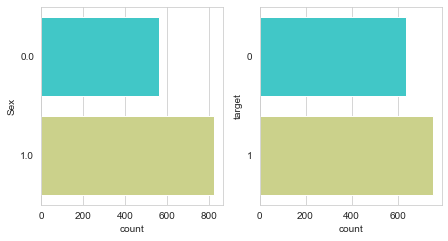

In [505]:
cat_var = ['Sex', 'target']

fig = plt.figure(figsize = (15,8))


for i,colonna in enumerate(cat_var):
    plt.subplot(2,4,i+1)
    sns.countplot(y = colonna, data = train_final, palette = "rainbow")

## ANALISI DESCRITTIVA DATASET PERTURBATO GAUSSIAN

In [13]:
df_gaussian = pd.read_csv('/Users/enricoconte/Desktop/Tesi/Workspace_Tesi/dati/noised_data/dati_perturbati.csv')
df_gaussian.iloc[:,2:]

,id,target,Sex,Age,ALP,ALT,AST,BA,CA,CK,...,GGT,GLU,HCT,LDH,LY,MO,NE,RBC,UREA,WBC
0,A01328_2020-03-04,1,0.0,60.0,26.650696,32.183646,37.505790,1.011503,2.111019,340.744665,...,25.961333,89.230586,36.922125,294.478504,40.446237,2.035730,59.498426,4.341320,106.847455,3.263194
1,A01671_2020-03-11,1,1.0,85.0,42.479682,14.102675,27.269339,1.035048,2.176400,604.679278,...,21.275710,146.044954,28.497063,415.165571,13.863795,6.052129,69.257339,2.946273,82.436602,10.588415
2,A00762_2020-04-03,0,1.0,87.0,132.023076,19.245572,38.638869,0.200074,1.943006,38.578812,...,14.395688,107.400369,34.980857,477.744405,8.139275,7.545889,82.547141,4.336927,140.034188,21.262309
3,A00219_2020-03-20,1,1.0,63.0,45.734080,57.187378,53.012634,0.198878,2.079843,150.792115,...,120.294418,87.960944,40.288854,315.471845,23.635749,8.046581,68.187021,4.693319,27.116475,5.174600
4,A01521_2020-03-18,1,1.0,63.0,139.599553,23.042431,23.329080,0.506194,2.325526,66.051715,...,51.433816,162.690107,43.268989,200.929398,12.623398,12.152875,74.704781,5.060403,20.880043,6.718129
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1384,A00925_2020-04-12,0,1.0,28.0,56.651559,30.239124,31.445079,0.583985,2.392081,482.609529,...,14.044850,90.187281,44.293059,203.897425,28.658156,8.445913,62.924633,4.675979,26.416742,8.218902
1385,A00989_2020-03-31,1,0.0,81.0,73.089976,30.005369,47.179580,0.506123,2.079921,42.489600,...,249.802713,107.361781,37.557989,646.844645,8.674251,2.281308,87.801212,4.266083,45.268891,7.612742
1386,A00144_2020-03-27,0,1.0,73.0,67.372358,28.496221,42.357249,0.246348,2.260841,222.879169,...,15.706757,113.199088,45.856378,292.543477,9.412783,6.062349,85.675015,4.967971,32.185424,13.576305
1387,A00205_2020-02-28,0,0.0,93.0,80.728341,29.916194,52.341476,0.397551,2.222109,226.095089,...,33.930937,212.865001,29.353939,231.035823,11.793629,18.645366,68.738130,2.957919,153.252674,5.026114


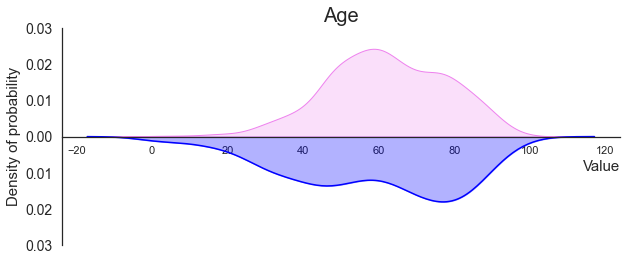

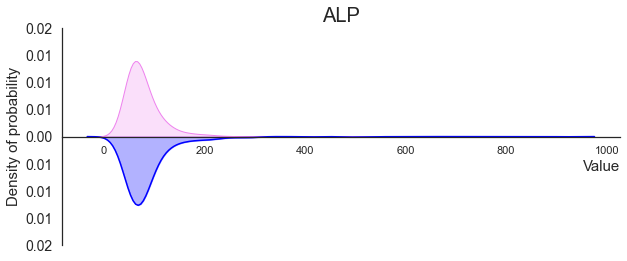

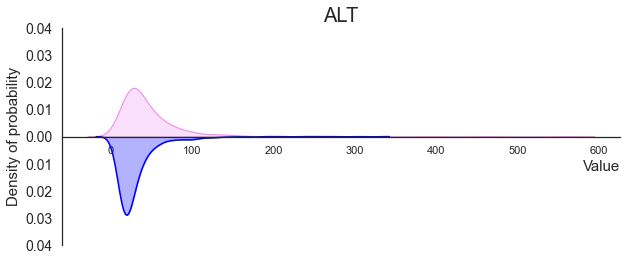

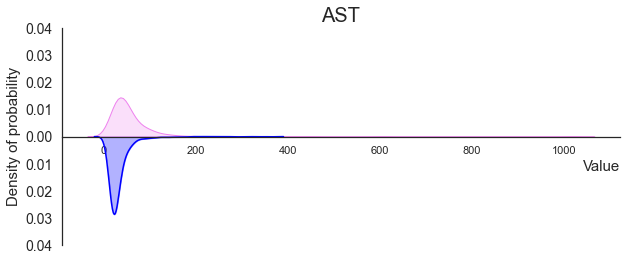

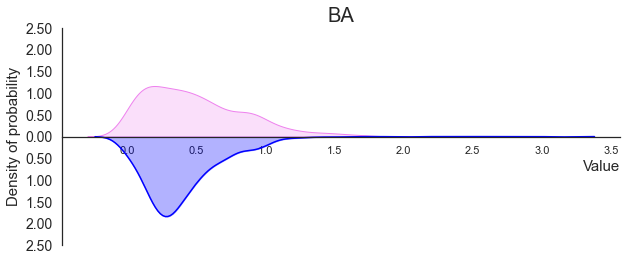

...

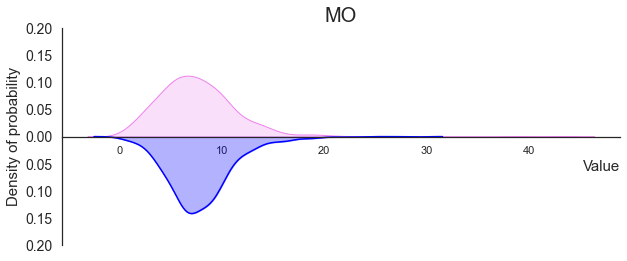

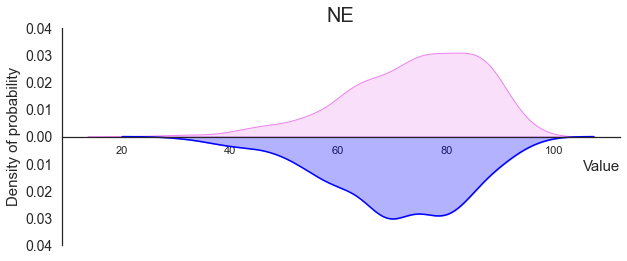

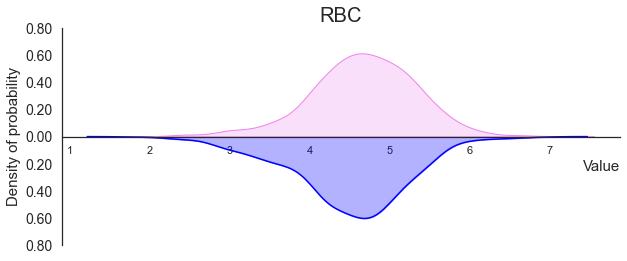

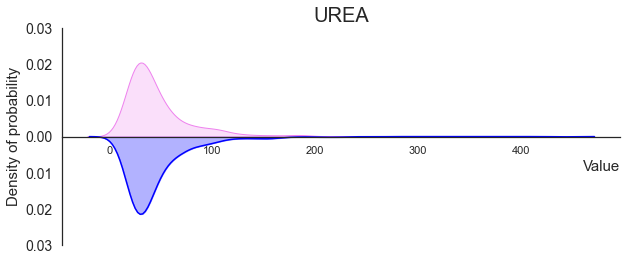

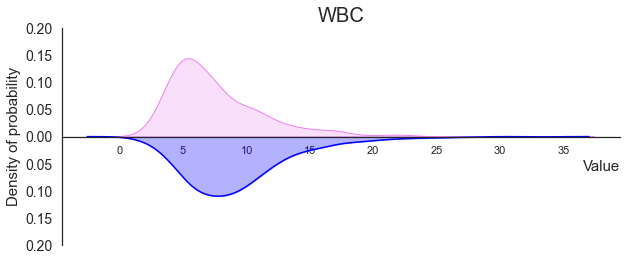

In [591]:
cont_var = df_gaussian.iloc[:,2:]

for variabile in cont_var: 
    violin(result, variabile)
    plt.savefig('/Users/enricoconte/Desktop/Tesi/Workspace_Tesi/grafici/df_gaussian/{variabile}_gaussian.png'.format(variabile = variabile))


## ANALISI DESCRITTIVA DATASET PERTURBATO DIFFERENZIATO

In [14]:
df_differenziato = pd.read_csv('/Users/enricoconte/Desktop/Tesi/Workspace_Tesi/dati/noised_data_differenziati/dati_perturbati_differenziati.csv')
del(df_differenziato['index'])
df_differenziato

,target,Age,ALP,ALT,AST,BA,CA,CK,CREA,EO,GGT,GLU,HCT,LDH,LY,MO,NE,RBC,UREA,WBC
0,0,88.0,84.133551,22.943131,30.575199,0.691245,2.302709,349.338475,1.268615,2.865033,93.210294,168.888444,40.219587,369.043838,16.480843,8.317407,70.976386,4.693441,28.889157,9.284292
1,0,63.0,278.633885,99.454285,66.086569,0.600557,2.171506,73.624754,0.520223,1.615408,235.970267,117.044879,34.297980,221.397033,11.679552,6.810885,79.419060,4.136165,22.049192,9.763530
2,0,40.0,35.993702,20.554872,17.303892,0.591588,2.275256,75.886921,0.786458,1.601580,21.397447,74.431451,42.061219,179.475514,35.767124,6.083133,55.188145,4.564172,17.732341,10.419972
3,0,35.0,77.283779,107.535213,49.132475,0.398016,2.492057,140.563059,0.987443,3.553730,53.911793,77.294595,43.413744,192.578844,19.815582,7.693076,70.921231,5.030213,27.490781,10.078369
4,1,32.0,54.352496,26.134865,24.278406,0.962508,2.321147,110.447793,1.430377,1.455817,25.196520,83.236975,49.057693,200.475361,29.648075,15.471371,52.403872,5.320300,25.723114,8.956049
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1384,0,83.0,45.223138,16.815322,25.174027,0.000000,2.011641,279.544595,2.002186,0.000000,7.058673,197.582529,24.612879,141.852836,4.495278,0.996455,89.695036,2.302688,155.322013,8.276282
1385,1,73.0,48.149239,37.727625,34.490830,0.501862,2.180773,39.561577,0.806106,1.559896,77.644196,107.177030,48.620138,242.938431,14.922977,10.723424,74.211978,5.613812,17.843052,6.743257
1386,1,58.0,108.063673,97.249423,69.282368,0.242288,1.958388,88.394715,0.803550,1.998988,211.458148,111.772678,43.670023,719.685991,5.772733,2.090790,91.403988,4.732781,39.389665,13.466533
1387,0,60.0,58.361542,20.845445,22.521661,0.904212,2.438116,53.879438,0.732151,1.337868,10.976114,103.262802,41.454828,299.528220,27.806237,7.832403,59.941230,4.579408,27.915969,5.403363


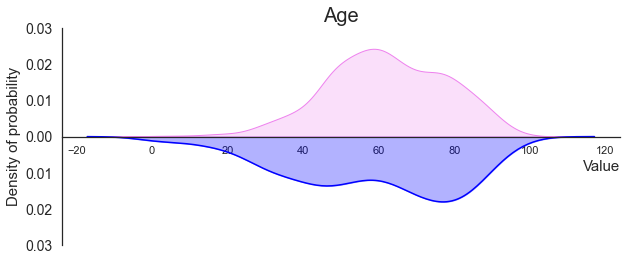

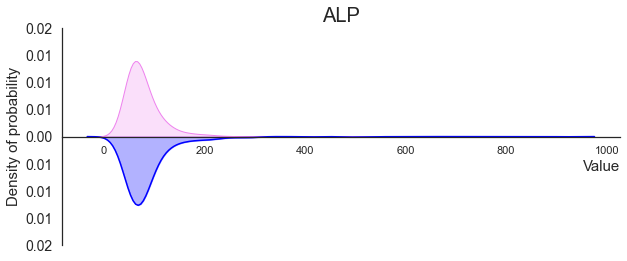

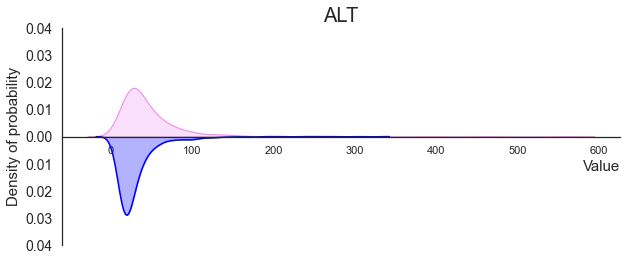

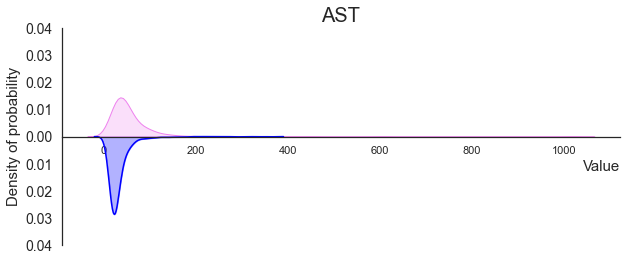

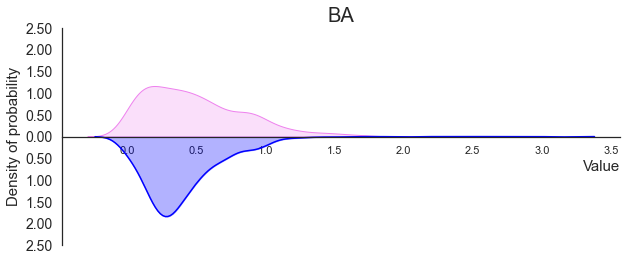

...

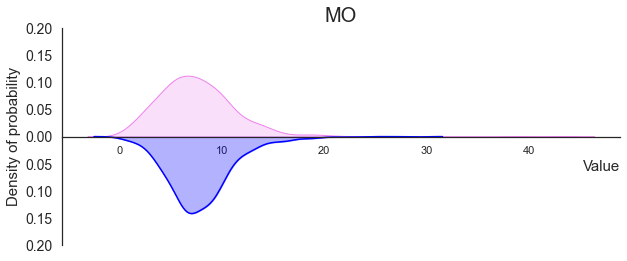

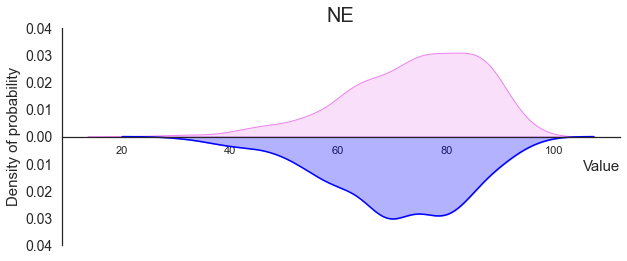

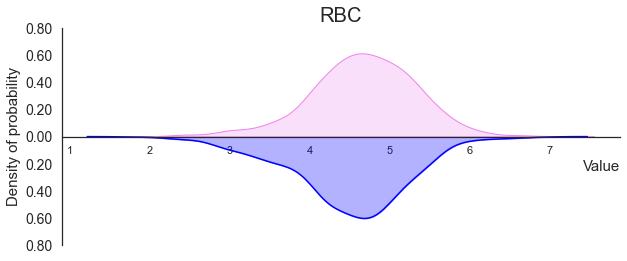

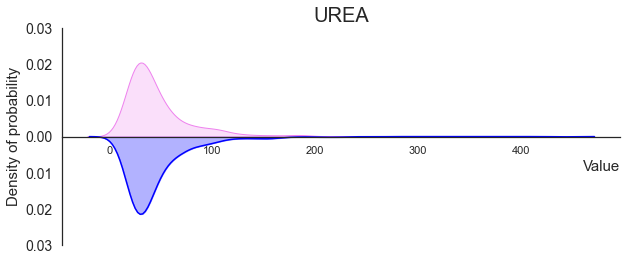

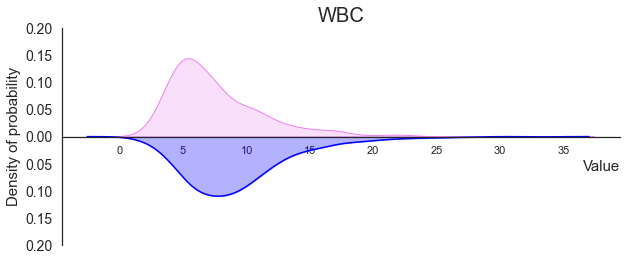

In [592]:
cont_var = df_differenziato.iloc[:, 1:20]

for variabile in cont_var: 
    violin(df_differenziato, variabile)
    plt.savefig('/Users/enricoconte/Desktop/Tesi/Workspace_Tesi/grafici/df_differenziato/{variabile}_differenziato.png'.format(variabile = variabile))


## ANALISI DESCRITTIVA DATASET GENERATO CON RETE BAYESIANA

In [15]:
df_bayesian_net = pd.read_csv('//Users/enricoconte/Desktop/Tesi/Workspace_Tesi/bnet_R_abs.csv')
del(df_bayesian_net['Unnamed: 0'])
df_bayesian_net

,ALT,AST,ALP,GGT,LDH,CK,CA,GLU,UREA,CREA,WBC,RBC,HCT,NE,LY,MO,EO,BA,Target
0,134.617520,147.493930,145.861929,101.584582,656.183660,35.759848,2.019546,122.217169,3.342775,0.324491,3.314928,4.980836,43.680359,78.283775,15.564151,5.671413,0.206867,0.187390,1.0
1,110.489218,69.667538,204.200955,208.774721,388.138456,129.832580,2.134754,179.321499,55.271216,1.752945,14.157032,4.127832,34.803326,71.302575,20.844214,8.337037,0.982265,0.379720,0.0
2,73.700792,98.658206,138.171169,218.275436,356.784810,817.222695,2.085024,72.518397,1.916399,0.129341,10.858321,5.332124,43.802728,69.545542,21.545492,6.992890,1.476164,0.411028,1.0
3,34.309694,32.456017,177.349209,263.852283,222.725745,243.476768,2.182944,20.329324,30.885320,0.442776,10.723270,2.633356,24.707047,70.718094,19.355711,7.058852,3.013769,0.052998,0.0
4,126.653410,186.757290,8.917358,15.265157,246.522979,146.537496,2.235406,195.351914,21.659250,1.307328,2.276131,4.746327,38.222470,67.311820,21.328123,11.054660,0.033322,0.233478,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1385,31.203683,48.983706,35.926178,133.207829,193.936868,415.204207,1.924006,154.344193,18.078718,0.772171,9.919963,4.019402,32.051491,88.256738,5.355532,6.112499,0.001271,0.287061,1.0
1386,49.591566,37.669834,106.700972,172.221946,70.628193,607.432585,2.266812,124.593095,87.022244,3.653212,6.508513,4.681238,39.734411,47.919857,36.612616,11.881640,3.467808,0.427845,0.0
1387,15.770447,45.304578,91.946464,137.209329,586.127721,152.016969,2.500765,116.245619,2.280771,0.435062,8.558378,5.028806,43.033969,53.913192,37.335851,8.867306,0.641800,0.470748,0.0
1388,30.577072,4.299811,47.905323,72.726606,377.773530,218.921643,2.245250,54.595293,49.680202,0.239470,8.919741,4.347453,41.773954,74.258777,17.378541,7.421474,0.409711,0.388414,1.0


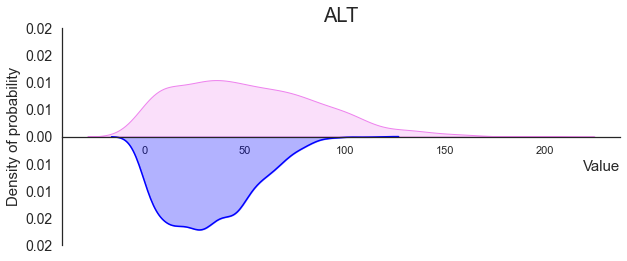

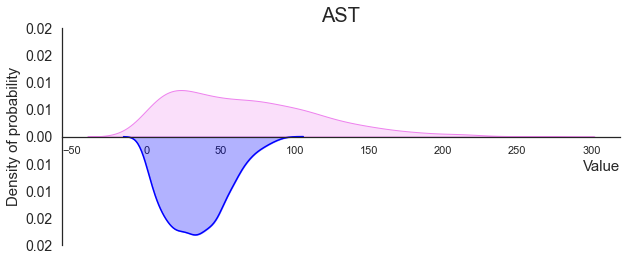

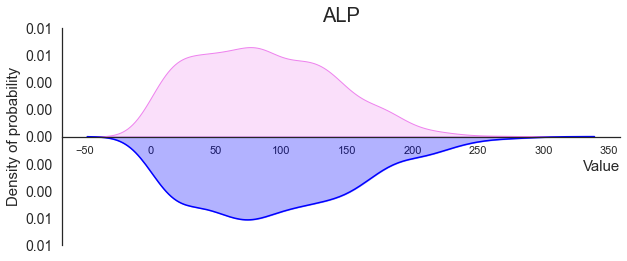

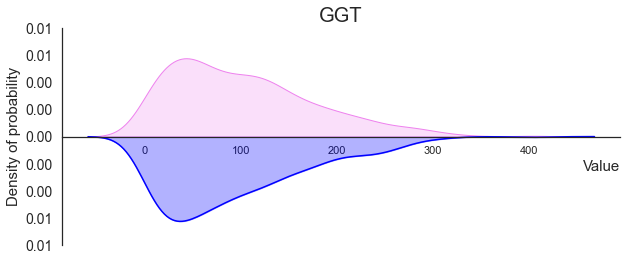

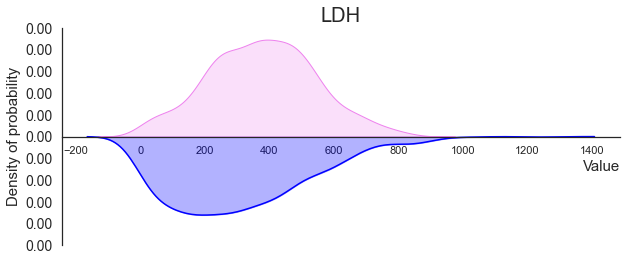

...

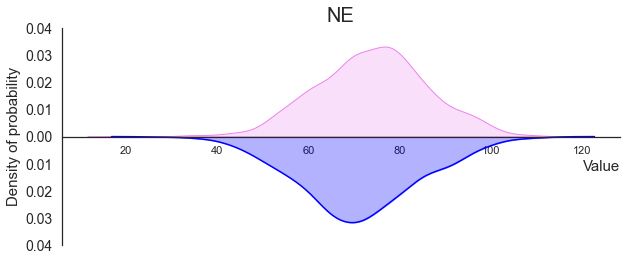

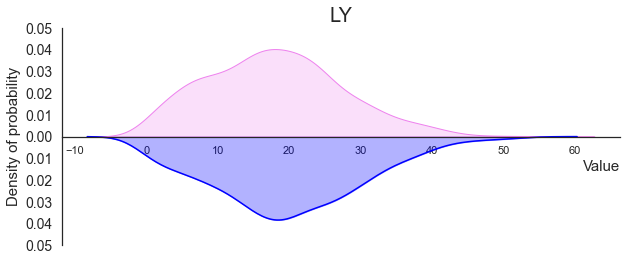

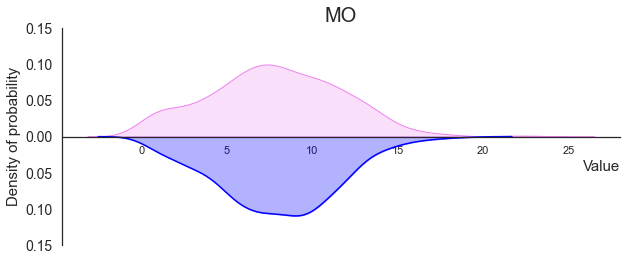

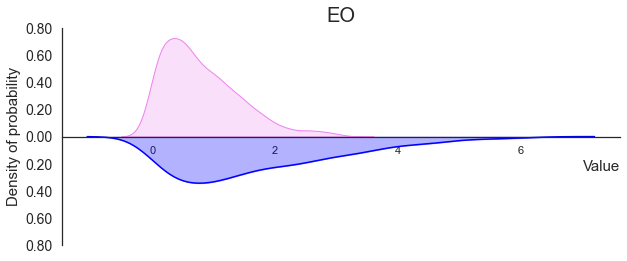

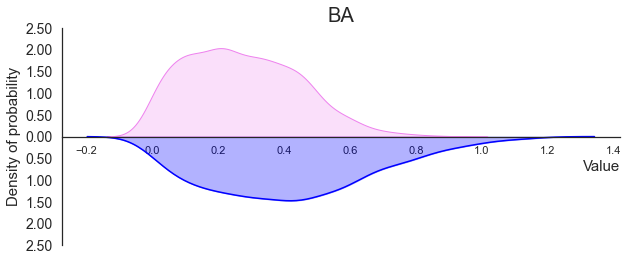

In [593]:
cont_var = df_bayesian_net.iloc[:,:-1]

for variabile in cont_var: 
    violin2(df_bayesian_net, variabile)
    plt.savefig('/Users/enricoconte/Desktop/Tesi/Workspace_Tesi/grafici/df_bnet/{variabile}_bnet.png'.format(variabile = variabile))

# Modello in cui sti stimano le variabilità diverse per pazienti sani e malati

 Si parla di:

- prendere le misurazioni in attimi diversi per lo stesso paziente

- scartare le misurazioni che non rispettano l'intervallo di confidenza dell'asymmetrical RCV

- Calcoalre la varianza dei valori che mi rimangono

- Sottraggo alla var il valore di variaiblità analitica calcoalto nel seguente modo: *valore percentuale* * x / 10 --> Ottengo il valore di variabilità BIOLOGICA

- Rendo il valore percentuale facendo var.bio/x * 100

- Aggrego i valori percentuali delle due variabilità e ottengo un numero unico

- Applico questo tasso di variabilità diversa in funzione del fatto di essere malati o meno, quindi aggiungo una IF clause allo script già scritto specificando le nuove condizioni in caso di malattia

In [16]:
train_final = train_final.reset_index()
train_final = train_final[1:]

del(train_final['index'])
train_final

,id,target,Sex,Age,ALT,AST,ALP,GGT,LDH,CK,...,UREA,CREA,WBC,RBC,HCT,NE,LY,MO,EO,BA
1,A01671_2020-03-11,1,1.0,85.0,14.0,27.0,42.5,21.5,420.0,610.000000,...,83.0,2.250,10.35,2.940,28.60,70.0,14.00,6.00,0.00,1.00
2,A00762_2020-04-03,0,1.0,87.0,19.0,39.0,131.0,14.5,471.5,38.500000,...,141.0,2.605,21.15,4.350,35.15,83.4,8.35,7.65,0.40,0.20
3,A00219_2020-03-20,1,1.0,63.0,57.0,52.5,45.5,119.0,318.0,147.500000,...,26.5,0.890,5.20,4.690,40.20,67.4,23.70,8.10,0.60,0.20
4,A01521_2020-03-18,1,1.0,63.0,23.0,23.0,139.0,51.0,202.0,66.600000,...,20.0,0.730,6.70,5.080,43.30,74.4,12.90,11.90,0.30,0.50
5,A00500_2020-04-08,0,0.0,66.0,14.0,20.0,40.0,11.0,248.0,79.000000,...,50.0,1.040,6.80,4.230,36.00,74.8,15.00,8.40,0.90,0.90
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1384,A00925_2020-04-12,0,1.0,28.0,30.0,32.0,57.0,14.0,205.0,460.000000,...,26.0,1.100,8.20,4.650,44.30,60.7,28.50,8.60,1.60,0.60
1385,A00989_2020-03-31,1,0.0,81.0,31.0,46.5,72.0,253.0,647.5,42.000000,...,45.5,0.815,7.55,4.285,37.45,88.2,8.75,2.30,0.25,0.50
1386,A00144_2020-03-27,0,1.0,73.0,28.5,41.5,66.0,16.0,297.0,220.111111,...,32.0,0.850,13.45,4.930,45.50,84.2,9.45,6.00,0.10,0.25
1387,A00205_2020-02-28,0,0.0,93.0,30.0,53.0,80.0,34.0,230.0,221.000000,...,153.0,1.220,5.00,2.950,29.20,68.7,11.70,18.80,0.40,0.40


In [17]:
# Creo un campo patid comune ai dataset prog_data e train_final per controllare il punto 2

import re 

regex2 = '\w{6}'
id_list = []

for i in np.arange(1, len(train_final)):

    id = re.findall(regex2, train_final['id'][i])
    id_list.append(id)

id_list = pd.DataFrame(id_list,columns = ['patid'])
train_final = train_final.join(id_list)

In [18]:
train_final.to_csv('train_final.csv')


In [19]:
# Importo i dati prognostici completi di tutte le variabili che mi interessano

prog2 = pd.read_csv('/Users/enricoconte/Desktop/Tesi/Workspace_Tesi/dati/dataset_prognostico_full.csv')
del(prog2['Unnamed: 0'])

In [20]:
## Devo Isolare tutte le feautures che finiscono per 0, raggrupparle per paziente e calcolarne la deviazione standard (e dopo tutti gli altri passaggi). Prima però, devo filtrare anche gli id per quelli che sono segnati come malati (target = 1 nel dataset train_final)

# regex per "ending with"
#.*0

lista_var2 = ['patid', 'ALT0', 'AST0', 'ALP0', 'GGT0', 'LDH0', 'CK0', 'CA', 'GLU0', 'UREA0', 'CREA0', 'WBC0', 'RBC0', 'HCT0', 'NE0', 'LY0', 'MO0', 'EO0', 'BA0']
prog2_filtered = prog2.filter(items=lista_var2)
prog2_filtered

# Ora incollo la variabile "target" per poter isolare i valori dei malati e stimarne la variabilità biologica e analitica

prog2_filtered2 = pd.merge(prog2_filtered, train_final[['patid', 'target']], on='patid', how = 'inner')
prog2_filtered2

,patid,ALT0,AST0,ALP0,GGT0,LDH0,CK0,GLU0,UREA0,CREA0,WBC0,RBC0,HCT0,NE0,LY0,MO0,EO0,BA0,target
0,A00071,13.0,NaN,188.0,NaN,NaN,NaN,102.0,NaN,0.20,9.6,4.50,35.6,NaN,NaN,NaN,NaN,NaN,0
1,A00808,23.0,16.0,NaN,21.0,153.0,NaN,137.0,NaN,1.06,6.8,4.62,42.1,46.1,40.2,10.4,2.4,0.9,1
2,A00808,23.0,22.0,72.0,25.0,220.0,180.0,93.0,26.0,0.96,6.7,4.83,44.2,53.2,35.1,8.8,2.2,0.7,1
3,A00808,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1
4,A01506,18.0,25.0,52.0,20.0,232.0,NaN,95.0,NaN,0.73,7.7,4.63,40.3,NaN,NaN,NaN,NaN,NaN,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
11451,A01406,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1
11452,A01406,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,12.9,3.11,28.4,77.0,12.0,9.6,1.1,0.3,1
11453,A00492,9.0,20.0,NaN,NaN,159.0,NaN,72.0,NaN,0.57,8.1,5.23,44.4,NaN,NaN,NaN,NaN,NaN,1
11454,A00492,NaN,NaN,85.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1


Sottraggo alla dev. standard il valore di variaiblità analitica calcoalto nel seguente modo: valore percentuale * x / 10 --> Ottengo il valore di variabilità BIOLOGICA

Rendo il valore percentuale facendo var.bio/x * 100

Aggrego i valori percentuali delle due variabilità e ottengo un numero unico



In [21]:
# Ottengo un dataset con 8000 malati e 3515 sani
print(prog2_filtered2['target'].sum())

prog2_malati = prog2_filtered2.loc[prog2_filtered2['target'] == 1]

# Raggruppo per id e calcola la deviazione standard, contestualmente droppo i valori nulli

df_prog2_std = prog2_malati.groupby('patid').std().dropna()

df_prog2_std['dummy'] = 1
df_prog2_std

6382


,ALT0,AST0,ALP0,GGT0,LDH0,CK0,GLU0,UREA0,CREA0,WBC0,RBC0,HCT0,NE0,LY0,MO0,EO0,BA0,target,dummy
patid,,,,,,,,,,,,,,,,,,,
A00011,26.014383,8.221715,3.437581,8.447316,30.624157,71.318534,15.455398,14.028542,0.096374,2.157106,0.197535,1.873439,10.090525,7.571818,3.566596,0.388080,0.205004,0.0,1
A00019,14.908052,17.559423,22.368132,13.796135,141.641566,33.650161,562.452665,26.162951,0.360093,1.504438,0.497293,4.539824,3.323402,3.181981,0.000000,0.000000,0.141421,0.0,1
A00024,66.449429,38.404968,16.700442,56.383508,117.190179,330.673962,96.072108,33.272765,0.196316,3.490865,0.664879,6.553514,17.408661,15.110192,1.996933,1.577353,0.426811,0.0,1
A00051,17.849600,24.715667,17.396770,62.243917,133.356324,246.660882,18.043928,14.986951,0.164907,2.693993,0.520327,4.740698,9.369998,7.011943,2.533860,2.330998,0.206993,0.0,1
A00060,137.598896,201.209584,5.501377,43.280971,343.052838,112.751053,26.565015,30.391683,0.300988,4.608687,0.386140,3.363778,15.053290,11.214346,3.742624,1.762556,0.218608,0.0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
A01575,24.137569,52.982413,71.122430,121.383689,83.487690,32.526912,21.460817,8.041559,0.098798,1.844925,0.270046,2.551960,16.500417,10.838069,4.661545,1.323820,0.304138,0.0,1
A01611,6.978240,6.054289,10.720816,15.762201,71.430859,15.623409,18.577540,11.284775,0.100227,5.221702,0.677092,4.832546,6.044157,5.705370,1.918401,0.786757,0.135280,0.0,1
A01628,12.689891,23.523498,28.762183,104.716493,144.286508,459.123421,34.648232,40.794554,0.295395,7.813063,0.552796,4.148529,7.969366,6.244351,3.031743,1.792231,0.195264,0.0,1


In [18]:
df_prog2_std.to_csv('std_prognostic_data.csv')

### Calcolo da fare: std -( valore.perc * x)/10 ovvero std - var.analitica = var.biologica

In [22]:
# Calcolo i valori x medi

df_prog2_medie = prog2_malati.groupby('patid').mean().dropna()
df_prog2_medie

,ALT0,AST0,ALP0,GGT0,LDH0,CK0,GLU0,UREA0,CREA0,WBC0,RBC0,HCT0,NE0,LY0,MO0,EO0,BA0,target
patid,,,,,,,,,,,,,,,,,,
A00009,30.500000,49.500000,43.000000,23.000000,403.500000,373.000000,101.000000,31.750000,1.025000,3.740000,4.486000,40.230000,64.190000,24.970000,9.220000,1.150000,0.470000,1
A00011,49.291667,34.375000,46.562500,27.750000,261.958333,65.666667,81.625000,43.400000,1.011667,6.608333,4.880417,40.325000,65.062500,22.416667,11.833333,0.416667,0.270833,1
A00012,67.600000,51.400000,59.000000,89.333333,314.333333,212.000000,125.500000,71.500000,1.312500,7.077778,3.913333,37.011111,75.355556,10.444444,12.411111,1.177778,0.611111,1
A00015,112.500000,76.578947,190.500000,167.000000,316.833333,71.000000,143.133333,51.166667,1.461429,6.690476,3.123095,29.733333,55.659524,27.511905,12.742857,3.685714,0.400000,1
A00019,36.750000,36.500000,50.666667,46.333333,436.666667,62.333333,494.500000,96.500000,0.800000,9.166667,4.830000,43.700000,90.950000,5.550000,2.700000,0.000000,0.800000,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
A01650,24.000000,24.000000,113.000000,31.000000,212.250000,96.000000,133.000000,54.000000,0.770000,6.660000,4.010000,37.060000,55.675000,29.575000,10.625000,3.550000,0.575000,1
A01657,13.500000,17.000000,95.000000,16.000000,193.666667,20.000000,103.888889,51.500000,1.484667,7.394118,4.815294,33.264706,61.958333,21.791667,13.616667,2.133333,0.500000,1
A01658,29.500000,39.500000,70.500000,43.500000,465.000000,87.500000,141.666667,63.500000,1.015000,16.220000,4.618000,43.380000,84.620000,9.320000,5.080000,0.720000,0.260000,1


In [23]:

df_prog2_std = df_prog2_std.reset_index()
df_prog2_medie = df_prog2_medie.reset_index()

prog2_medie_filtrati = pd.merge(df_prog2_std[['patid','dummy']],df_prog2_medie, on = 'patid', how = 'inner')
prog2_medie_filtrati.to_csv('medie_prognostic_data.csv')
prog2_medie_filtrati

,patid,dummy,ALT0,AST0,ALP0,GGT0,LDH0,CK0,GLU0,UREA0,CREA0,WBC0,RBC0,HCT0,NE0,LY0,MO0,EO0,BA0,target
0,A00011,1,49.291667,34.375000,46.562500,27.750000,261.958333,65.666667,81.625000,43.400000,1.011667,6.608333,4.880417,40.325000,65.062500,22.416667,11.833333,0.416667,0.270833,1
1,A00019,1,36.750000,36.500000,50.666667,46.333333,436.666667,62.333333,494.500000,96.500000,0.800000,9.166667,4.830000,43.700000,90.950000,5.550000,2.700000,0.000000,0.800000,1
2,A00024,1,72.120000,51.692308,67.714286,68.500000,367.263158,425.038462,128.625000,62.076923,0.830172,6.714706,4.288382,38.854412,63.057813,29.662500,5.150000,1.620313,0.509375,1
3,A00051,1,44.681818,51.431818,110.380952,136.100000,424.000000,285.095238,141.833333,52.000000,0.637692,8.100000,4.244038,38.030769,73.038462,16.742308,7.226923,2.665385,0.326923,1
4,A00060,1,198.571429,166.285714,64.583333,90.833333,538.500000,213.000000,137.800000,92.176471,1.644000,11.700000,4.372619,37.800000,74.545000,13.455000,10.025000,1.635000,0.340000,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
114,A01575,1,74.200000,92.050000,275.000000,475.000000,290.777778,108.000000,94.166667,35.000000,1.018889,6.483333,4.148333,38.283333,71.283333,17.816667,9.033333,1.500000,0.366667,1
115,A01611,1,26.187500,35.823529,59.461538,30.916667,412.647059,38.909091,119.625000,39.500000,0.487632,14.950000,4.277778,38.005556,86.508333,8.475000,4.355556,0.438889,0.222222,1
116,A01628,1,47.666667,67.954545,121.526316,213.894737,690.473684,555.736842,117.500000,122.250000,1.197222,13.498333,3.482778,32.170000,75.031034,11.366092,10.132184,3.056897,0.379310,1
117,A01644,1,116.970588,80.323529,85.500000,174.400000,420.636364,158.000000,105.208333,85.150000,2.025882,12.247059,4.292941,38.052941,58.270588,30.908824,7.011765,2.938235,0.870588,1


In [24]:
prog2_medie_filtrati = pd.read_csv('/Users/enricoconte/Desktop/Tesi/Workspace_Tesi/medie_prognostic_data.csv')

#del(prog2_medie_filtrati['Unnamed: 0'])
#del(prog2_medie_filtrati['target'])
prog2_medie_filtrati = prog2_medie_filtrati.set_index('patid')
prog2_medie_filtrati

,Unnamed: 0,dummy,ALT0,AST0,ALP0,GGT0,LDH0,CK0,GLU0,UREA0,CREA0,WBC0,RBC0,HCT0,NE0,LY0,MO0,EO0,BA0,target
patid,,,,,,,,,,,,,,,,,,,,
A00011,0,1,49.291667,34.375000,46.562500,27.750000,261.958333,65.666667,81.625000,43.400000,1.011667,6.608333,4.880417,40.325000,65.062500,22.416667,11.833333,0.416667,0.270833,1
A00019,1,1,36.750000,36.500000,50.666667,46.333333,436.666667,62.333333,494.500000,96.500000,0.800000,9.166667,4.830000,43.700000,90.950000,5.550000,2.700000,0.000000,0.800000,1
A00024,2,1,72.120000,51.692308,67.714286,68.500000,367.263158,425.038462,128.625000,62.076923,0.830172,6.714706,4.288382,38.854412,63.057812,29.662500,5.150000,1.620313,0.509375,1
A00051,3,1,44.681818,51.431818,110.380952,136.100000,424.000000,285.095238,141.833333,52.000000,0.637692,8.100000,4.244038,38.030769,73.038462,16.742308,7.226923,2.665385,0.326923,1
A00060,4,1,198.571429,166.285714,64.583333,90.833333,538.500000,213.000000,137.800000,92.176471,1.644000,11.700000,4.372619,37.800000,74.545000,13.455000,10.025000,1.635000,0.340000,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
A01575,114,1,74.200000,92.050000,275.000000,475.000000,290.777778,108.000000,94.166667,35.000000,1.018889,6.483333,4.148333,38.283333,71.283333,17.816667,9.033333,1.500000,0.366667,1
A01611,115,1,26.187500,35.823529,59.461538,30.916667,412.647059,38.909091,119.625000,39.500000,0.487632,14.950000,4.277778,38.005556,86.508333,8.475000,4.355556,0.438889,0.222222,1
A01628,116,1,47.666667,67.954545,121.526316,213.894737,690.473684,555.736842,117.500000,122.250000,1.197222,13.498333,3.482778,32.170000,75.031034,11.366092,10.132184,3.056897,0.379310,1


In [25]:
df_prog2_std = pd.read_csv('/Users/enricoconte/Desktop/Tesi/Workspace_Tesi/std_prognostic_data.csv')
#del(df_prog2_std['Unnamed: 0'])
#del(df_prog2_std['level_0'])
#del(df_prog2_std['index'])
del(df_prog2_std['target'])
del(df_prog2_std['dummy'])
df_prog2_std = df_prog2_std.set_index('patid')
df_prog2_std

,ALT0,AST0,ALP0,GGT0,LDH0,CK0,GLU0,UREA0,CREA0,WBC0,RBC0,HCT0,NE0,LY0,MO0,EO0,BA0
patid,,,,,,,,,,,,,,,,,
A00007,7.280110,13.583078,7.778175,1.414214,27.838822,311.996795,7.918333,5.852350,0.094181,1.931839,0.205953,1.301922,21.637468,16.758431,4.101219,0.777817,0.000000
A00011,26.014383,8.221715,3.437581,8.447316,30.624157,71.318534,15.455398,14.028542,0.096374,2.157106,0.197535,1.873439,10.090525,7.571818,3.566596,0.388080,0.205004
A00024,66.449429,38.404968,16.700442,56.383508,117.190179,330.673962,96.072108,33.272765,0.196316,3.490865,0.664879,6.553514,17.408661,15.110192,1.996933,1.577353,0.426811
A00039,17.329622,14.467386,18.018509,13.719815,66.739087,41.395249,43.592026,32.859803,0.213434,1.363374,0.523464,4.592644,9.003883,6.756397,2.748688,0.676687,0.171686
A00051,17.849600,24.715667,17.396770,62.243917,133.356324,246.660882,18.043928,14.986951,0.164907,2.693993,0.520327,4.740698,9.369998,7.011943,2.533860,2.330998,0.206993
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
A01635,4.159327,10.733126,5.686241,1.527525,174.978808,74.246212,157.980379,41.368265,0.425206,1.257643,0.208614,2.232487,4.241226,3.758058,2.599038,0.219089,0.089443
A01642,57.400846,33.129346,65.053824,39.962482,53.969127,3.535534,7.937254,6.701990,0.093256,2.643441,0.439738,3.923363,16.660218,14.073830,1.679073,2.601888,0.320713
A01644,45.189694,72.594968,34.895081,157.668323,199.503019,74.953319,36.512425,42.652374,1.593870,3.132165,0.583160,5.108249,14.447665,10.802376,2.127758,2.745083,0.375441


In [26]:
# Il calcolo da fare è std - (valore di rif. * media) /10, quindi intato calcolo  (valori riferimetno * df_medie) / 10

medie_test = prog2_medie_filtrati.copy()

medie_test['ALT0'] = (0.04 * medie_test['ALT0']) / 10
medie_test['AST0'] = (0.04 * medie_test['AST0']) /10
medie_test['ALP0'] = (0.05 * medie_test['ALP0']) / 10
medie_test['GGT0'] = (0.035 * medie_test['GGT0']) / 10
medie_test['LDH0'] = (0.03 * medie_test['LDH0']) / 10
medie_test['CK0'] = (0.05 * medie_test['CK0']) / 10
medie_test['GLU0'] = (0.028 * medie_test['GLU0']) / 10
medie_test['UREA0'] = (0.03 * medie_test['UREA0']) / 10
medie_test['CREA0'] = (0.025 * medie_test['CREA0']) / 10
medie_test['WBC0'] = (0.019 * medie_test['WBC0']) / 10
medie_test['RBC0'] = (0.009 * medie_test['RBC0']) / 10
medie_test['HCT0'] = (0.018 * medie_test['HCT0']) / 10
medie_test['NE0'] = (0.03 * medie_test['NE0']) / 10
medie_test['LY0'] = (0.036 * medie_test['LY0']) / 10
medie_test['MO0'] = (0.063 * medie_test['MO0']) / 10
medie_test['EO0'] = (0.079 * medie_test['EO0']) / 10
medie_test['BA0'] = (0.031 * medie_test['BA0']) / 10
var_analitiche = medie_test
del(var_analitiche['dummy'])
#del(var_analitiche['target'])
var_analitiche.to_csv('var_analitiche_malati.csv')
var_analitiche


,Unnamed: 0,ALT0,AST0,ALP0,GGT0,LDH0,CK0,GLU0,UREA0,CREA0,WBC0,RBC0,HCT0,NE0,LY0,MO0,EO0,BA0,target
patid,,,,,,,,,,,,,,,,,,,
A00011,0,0.197167,0.137500,0.232813,0.097125,0.785875,0.328333,0.228550,0.130200,0.002529,0.012556,0.004392,0.072585,0.195188,0.080700,0.074550,0.003292,0.000840,1
A00019,1,0.147000,0.146000,0.253333,0.162167,1.310000,0.311667,1.384600,0.289500,0.002000,0.017417,0.004347,0.078660,0.272850,0.019980,0.017010,0.000000,0.002480,1
A00024,2,0.288480,0.206769,0.338571,0.239750,1.101789,2.125192,0.360150,0.186231,0.002075,0.012758,0.003860,0.069938,0.189173,0.106785,0.032445,0.012800,0.001579,1
A00051,3,0.178727,0.205727,0.551905,0.476350,1.272000,1.425476,0.397133,0.156000,0.001594,0.015390,0.003820,0.068455,0.219115,0.060272,0.045530,0.021057,0.001013,1
A00060,4,0.794286,0.665143,0.322917,0.317917,1.615500,1.065000,0.385840,0.276529,0.004110,0.022230,0.003935,0.068040,0.223635,0.048438,0.063158,0.012916,0.001054,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
A01575,114,0.296800,0.368200,1.375000,1.662500,0.872333,0.540000,0.263667,0.105000,0.002547,0.012318,0.003733,0.068910,0.213850,0.064140,0.056910,0.011850,0.001137,1
A01611,115,0.104750,0.143294,0.297308,0.108208,1.237941,0.194545,0.334950,0.118500,0.001219,0.028405,0.003850,0.068410,0.259525,0.030510,0.027440,0.003467,0.000689,1
A01628,116,0.190667,0.271818,0.607632,0.748632,2.071421,2.778684,0.329000,0.366750,0.002993,0.025647,0.003135,0.057906,0.225093,0.040918,0.063833,0.024149,0.001176,1


Sottraggo alla dev. standard il valore di variaiblità analitica calcoalto nel seguente modo: valore percentuale * x / 10 --> Ottengo il valore di variabilità BIOLOGICA

Rendo il valore percentuale facendo var.bio/x * 100

Aggrego i valori percentuali delle due variabilità e ottengo un numero unico

In [28]:
var_biologiche = (df_prog2_std - var_analitiche)

var_biologiche['ALT0'] = (var_biologiche['ALT0'] / prog2_medie_filtrati['ALT0']) * 100
var_biologiche['AST0'] = (var_biologiche['AST0'] / prog2_medie_filtrati['AST0']) * 100
var_biologiche['ALP0'] = (var_biologiche['ALP0'] / prog2_medie_filtrati['AST0']) * 100
var_biologiche['GGT0'] = (var_biologiche['GGT0'] / prog2_medie_filtrati['GGT0']) * 100
var_biologiche['LDH0'] = (var_biologiche['LDH0'] / prog2_medie_filtrati['LDH0']) * 100
var_biologiche['CK0'] = (var_biologiche['CK0'] / prog2_medie_filtrati['CK0']) * 100
var_biologiche['GLU0'] = (var_biologiche['GLU0'] / prog2_medie_filtrati['GLU0']) * 100
var_biologiche['UREA0'] = (var_biologiche['UREA0'] / prog2_medie_filtrati['UREA0']) * 100
var_biologiche['CREA0'] = (var_biologiche['CREA0'] / prog2_medie_filtrati['CREA0']) * 100
var_biologiche['WBC0'] = (var_biologiche['WBC0'] / prog2_medie_filtrati['WBC0']) * 100
var_biologiche['RBC0'] = (var_biologiche['RBC0'] / prog2_medie_filtrati['RBC0']) * 100
var_biologiche['HCT0'] = (var_biologiche['HCT0'] / prog2_medie_filtrati['HCT0']) * 100
var_biologiche['NE0'] = (var_biologiche['NE0'] / prog2_medie_filtrati['NE0']) * 100
var_biologiche['LY0'] = (var_biologiche['LY0'] / prog2_medie_filtrati['LY0']) * 100
var_biologiche['MO0'] = (var_biologiche['MO0'] / prog2_medie_filtrati['MO0']) * 100
var_biologiche['EO0'] = (var_biologiche['EO0'] / prog2_medie_filtrati['EO0']) * 100
var_biologiche['BA0'] = (var_biologiche['BA0'] / prog2_medie_filtrati['BA0']) * 100

var_biologiche.to_csv('var_biologiche_malati.csv')
var_analitiche_final = var_analitiche * 100
var_analitiche_final.to_csv('var_analitiche_final_malati.csv')
var_biologiche.mean(axis = 0)

ALP0          45.170194
ALT0          51.187256
AST0          52.372867
BA0           56.479554
CK0           62.846371
CREA0         22.586704
EO0           98.609415
GGT0          36.127891
GLU0          26.741883
HCT0           9.742837
LDH0          24.131051
LY0           43.172734
MO0           33.023348
NE0           14.116659
RBC0          10.416967
UREA0         34.863713
Unnamed: 0          NaN
WBC0          33.388633
target              NaN
dtype: float64

In [454]:
var_biologiche.mean(axis = 0)/10

ALP0          4.517019
ALT0          5.118726
AST0          5.237287
BA0           5.647955
CK0           6.284637
CREA0         2.258670
EO0           9.860941
GGT0          3.612789
GLU0          2.674188
HCT0          0.974284
LDH0          2.413105
LY0           4.317273
MO0           3.302335
NE0           1.411666
RBC0          1.041697
UREA0         3.486371
Unnamed: 0         NaN
WBC0          3.338863
target             NaN
dtype: float64

In [30]:
variabilita_totale_malati = var_analitiche_final + var_biologiche

variabilita_totale_malati.to_csv('var_totale_malati.csv')
variabilita_totale_malati.mean(axis = 0)

ALP0           99.177078
ALT0           82.149962
AST0           79.729123
BA0            56.619937
CK0           174.121980
CREA0          22.957529
EO0           100.269521
GGT0           79.546926
GLU0           63.698366
HCT0           16.341000
LDH0          134.548518
LY0            49.375923
MO0            38.019662
NE0            35.821610
RBC0           10.791692
UREA0          58.284621
Unnamed: 0           NaN
WBC0           35.290414
target               NaN
dtype: float64

In [59]:
# Esistono versioni diverse tra valori assoluti e percentuali (tengo buoni i valori assoluti con T alla fine).

#print('my features', result.columns)

prognostic features Index(['MCV0', 'NE0', 'PLT10', 'RBC0', 'MPV0', 'MCH0', 'MOT0', 'BAT0', 'RDW0',
       'NET0', 'EO0', 'HGB0', 'LY0', 'EOT0', 'WBC0', 'BA0', 'MCHC0', 'HCT0',
       'LYT0', 'MO0', 'Severity', 'Age', 'Sex', 'patid', 'id', 'Dead',
       'patdate'],
      dtype='object')
my features Index(['index', 'id', 'target', 'Sex', 'Age', 'ALP', 'ALT', 'AST', 'BA', 'CA',
       'CK', 'CREA', 'EO', 'GGT', 'GLU', 'HCT', 'LDH', 'LY', 'MO', 'NE', 'RBC',
       'UREA', 'WBC'],
      dtype='object')


## PERTURBAZIONE DIFFERENZIATA PER MALATI/SANI

In [28]:
test

,Age,ALT,AST,ALP,GGT,LDH,CK,CA,GLU,UREA,CREA,WBC,RBC,HCT,NE,LY,MO,EO,BA,target
1144,88.0,23.0,30.5,84.0,91.000000,370.0,352.500000,2.30,168.0,28.500000,1.280000,9.300000,4.680000,40.150000,71.40,16.40,8.50,3.00,0.7,0
906,63.0,99.0,66.0,278.0,235.000000,221.0,74.600000,2.17,118.0,22.000000,0.520000,9.900000,4.130000,34.300000,79.40,11.60,6.80,1.60,0.6,0
763,40.0,21.0,17.0,36.0,21.000000,179.0,75.600000,2.27,75.0,17.000000,0.790000,10.500000,4.560000,42.100000,56.00,35.70,6.10,1.60,0.6,0
797,35.0,106.0,50.0,78.0,54.000000,193.0,145.200000,2.49,77.0,26.666667,0.990000,10.100000,5.040000,43.300000,68.95,19.75,7.55,3.35,0.4,0
713,32.0,26.0,23.0,54.0,25.000000,199.0,113.000000,2.32,84.0,27.000000,1.180000,9.100000,5.500000,48.800000,52.40,30.20,15.30,1.10,1.0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
259,83.0,16.5,25.0,45.0,7.000000,141.5,288.000000,2.00,197.0,156.000000,2.003333,8.133333,2.296667,24.700000,89.50,4.50,1.00,0.00,0.0,0
53,73.0,37.0,34.0,49.0,78.000000,243.0,39.000000,2.17,107.0,17.666667,0.820000,7.100000,5.480000,48.500000,74.30,14.90,10.10,0.30,0.4,1
524,58.0,98.0,68.0,109.0,212.000000,721.0,88.500000,1.96,111.5,38.500000,0.986667,13.666667,4.920000,43.733333,91.15,5.15,2.30,0.90,0.5,1
1318,60.0,21.0,23.0,58.0,11.000000,300.0,54.777778,2.45,103.0,28.000000,0.730000,5.300000,4.580000,41.300000,62.90,27.20,7.70,1.30,0.9,0


In [34]:
def perturba_dati(w_a, w_b):

        for column in test:
                lista_noise  = []


        #print(test[column])

                if column == "ALT":
                        for i in np.arange(0,len(test)): 
                            if test['target'].iloc[i] == 1:


                                sigma_analytical = var_analitiche_final.mean(axis= 0)['ALT0'] / 100
                                sigma_biological = var_biologiche.mean(axis = 0)['ALT0'] / 100 
                                noise = abs(np.random.normal(test[column].iloc[i], (w_a*sigma_analytical + w_b*sigma_biological) ))
                                lista_noise.append(noise)
                            
                            if test['target'].iloc[i] == 0:
                                sigma_analytical = (test[column].iloc[i] * 0.04) / 10
                                sigma_biological = (test[column].iloc[i] * 0.093) / 10
                                noise = abs(np.random.normal(test[column].iloc[i], (w_a*sigma_analytical + w_b*sigma_biological) ))
                                lista_noise.append(noise)

                        

                if column == "AST":
                        for i in np.arange(0,len(test)): 
                            if test['target'].iloc[i] == 1:


                                sigma_analytical = var_analitiche_final.mean(axis= 0)['AST0'] / 100
                                sigma_biological = var_biologiche.mean(axis = 0)['AST0'] / 100 
                                noise = abs(np.random.normal(test[column].iloc[i], (w_a*sigma_analytical + w_b*sigma_biological) ))
                                lista_noise.append(noise)
                            
                            if test['target'].iloc[i] == 0:
                                sigma_analytical = (test[column].iloc[i] * 0.04) / 10
                                sigma_biological = (test[column].iloc[i] * 0.095) / 10
                                noise = abs(np.random.normal(test[column].iloc[i], (w_a*sigma_analytical + w_b*sigma_biological) ))
                                lista_noise.append(noise)



                if column == "GGT":
                        for i in np.arange(0,len(test)): 
                            if test['target'].iloc[i] == 1:


                                sigma_analytical = var_analitiche_final.mean(axis= 0)['GGT0'] / 100
                                sigma_biological = var_biologiche.mean(axis = 0)['GGT0'] / 100 
                                noise = abs(np.random.normal(test[column].iloc[i], (w_a*sigma_analytical + w_b*sigma_biological) ))
                                lista_noise.append(noise)
                            
                            if test['target'].iloc[i] == 0:
                                sigma_analytical = (test[column].iloc[i] * 0.035) / 10
                                sigma_biological = (test[column].iloc[i] * 0.089)  / 10
                                noise = abs(np.random.normal(test[column].iloc[i], (w_a*sigma_analytical + w_b*sigma_biological) ))
                                lista_noise.append(noise)



                if column == "ALP":
                        for i in np.arange(0,len(test)): 
                            if test['target'].iloc[i] == 1:


                                sigma_analytical = var_analitiche_final.mean(axis= 0)['ALP0'] / 100
                                sigma_biological = var_biologiche.mean(axis = 0)['ALP0'] / 100 
                                noise = abs(np.random.normal(test[column].iloc[i], (w_a*sigma_analytical + w_b*sigma_biological) ))
                                lista_noise.append(noise)
                            
                            if test['target'].iloc[i] == 0:
                                sigma_analytical = (test[column].iloc[i] * 0.05)  / 10
                                sigma_biological = (test[column].iloc[i] * 0.053) / 10
                                noise = abs(np.random.normal(test[column].iloc[i], (w_a*sigma_analytical + w_b*sigma_biological) ))
                                lista_noise.append(noise)


                if column == "LDH":
                        for i in np.arange(0,len(test)): 
                            if test['target'].iloc[i] == 1:


                                sigma_analytical = var_analitiche_final.mean(axis= 0)['LDH0'] / 100
                                sigma_biological = var_biologiche.mean(axis = 0)['LDH0'] / 100 
                                noise = abs(np.random.normal(test[column].iloc[i], (w_a*sigma_analytical + w_b*sigma_biological) ))
                                lista_noise.append(noise)
                            
                            if test['target'].iloc[i] == 0:
                                sigma_analytical = (test[column].iloc[i] *  0.03) / 10
                                sigma_biological = (test[column].iloc[i] *  0.052) / 10
                                noise = abs(np.random.normal(test[column].iloc[i], (w_a*sigma_analytical + w_b*sigma_biological) ))
                                lista_noise.append(noise)

                if column == "CK":
                        for i in np.arange(0,len(test)): 
                            if test['target'].iloc[i] == 1:


                                sigma_analytical = var_analitiche_final.mean(axis= 0)['CK0'] / 100
                                sigma_biological = var_biologiche.mean(axis = 0)['CK0'] / 100 
                                noise = abs(np.random.normal(test[column].iloc[i], (w_a*sigma_analytical + w_b*sigma_biological) ))
                                lista_noise.append(noise)
                            
                            if test['target'].iloc[i] == 0:
                                sigma_analytical = (test[column].iloc[i] *  0.05) / 10
                                sigma_biological = (test[column].iloc[i] *  0.145) / 10
                                noise = abs(np.random.normal(test[column].iloc[i], (w_a*sigma_analytical + w_b*sigma_biological) ))
                                lista_noise.append(noise)

                if column == "NA":
                        for i in np.arange(0,len(test)): 
                            if test['target'].iloc[i] == 1:


                                sigma_analytical = var_analitiche_final.mean(axis= 0)['NA0'] / 100
                                sigma_biological = var_biologiche.mean(axis = 0)['NA0'] / 100 
                                noise = abs(np.random.normal(test[column].iloc[i], (w_a*sigma_analytical + w_b*sigma_biological) ))
                                lista_noise.append(noise)
                            
                            if test['target'].iloc[i] == 0:
                                sigma_analytical = (test[column].iloc[i] *  0.008) / 10
                                sigma_biological = (test[column].iloc[i] *  0.005) / 10
                                noise = abs(np.random.normal(test[column].iloc[i], (w_a*sigma_analytical + w_b*sigma_biological) ))
                                lista_noise.append(noise)

                if column == "K":
                        for i in np.arange(0,len(test)):

                                sigma_analytical = (test[column].iloc[i] * 0.012) / 10
                                sigma_biological = (test[column].iloc[i] * 0.039) / 10 
                                noise = abs(np.random.normal(test[column].iloc[i], (w_a*sigma_analytical + w_b*sigma_biological) ))
                                lista_noise.append(noise)

                if column == "CA":
                        for i in np.arange(0,len(test)):

                                sigma_analytical = (test[column].iloc[i] * 0.03) / 10
                                sigma_biological = (test[column].iloc[i] * 0.018) / 10 
                                noise = abs(np.random.normal(test[column].iloc[i], (w_a*sigma_analytical + w_b*sigma_biological) ))
                                lista_noise.append(noise)


                if column == "GLU":
                        for i in np.arange(0,len(test)): 
                            if test['target'].iloc[i] == 1:


                                sigma_analytical = var_analitiche_final.mean(axis= 0)['GLU0'] / 100
                                sigma_biological = var_biologiche.mean(axis = 0)['GLU0'] / 100 
                                noise = abs(np.random.normal(test[column].iloc[i], (w_a*sigma_analytical + w_b*sigma_biological) ))
                                lista_noise.append(noise)
                            
                            if test['target'].iloc[i] == 0:
                                sigma_analytical = (test[column].iloc[i] * 0.028) / 10
                                sigma_biological = (test[column].iloc[i] * 0.047) / 10
                                noise = abs(np.random.normal(test[column].iloc[i], (w_a*sigma_analytical + w_b*sigma_biological) ))
                                lista_noise.append(noise)

                if column == "UREA":
                        for i in np.arange(0,len(test)): 
                            if test['target'].iloc[i] == 1:


                                sigma_analytical = var_analitiche_final.mean(axis= 0)['UREA0'] / 100
                                sigma_biological = var_biologiche.mean(axis = 0)['UREA0'] / 100 
                                noise = abs(np.random.normal(test[column].iloc[i], (w_a*sigma_analytical + w_b*sigma_biological) ))
                                lista_noise.append(noise)
                            
                            if test['target'].iloc[i] == 0:
                                sigma_analytical = (test[column].iloc[i] * 0.03) / 10
                                sigma_biological = (test[column].iloc[i] * 0.141) / 10
                                noise = abs(np.random.normal(test[column].iloc[i], (w_a*sigma_analytical + w_b*sigma_biological) ))
                                lista_noise.append(noise)

                if column == "CREA":
                        for i in np.arange(0,len(test)): 
                            if test['target'].iloc[i] == 1:


                                sigma_analytical = var_analitiche_final.mean(axis= 0)['CREA0'] / 100
                                sigma_biological = var_biologiche.mean(axis = 0)['CREA0'] / 100 
                                noise = abs(np.random.normal(test[column].iloc[i], (w_a*sigma_analytical + w_b*sigma_biological) ))
                                lista_noise.append(noise)
                            
                            if test['target'].iloc[i] == 0:
                                sigma_analytical = (test[column].iloc[i] * 0.025) / 10
                                sigma_biological = (test[column].iloc[i] * 0.044) / 10
                                noise = abs(np.random.normal(test[column].iloc[i], (w_a*sigma_analytical + w_b*sigma_biological) ))
                                lista_noise.append(noise)

                if column == "CRP":
                        for i in np.arange(0,len(test)):

                                sigma_analytical = (test[column].iloc[i] * 0.111) / 10
                                sigma_biological = (test[column].iloc[i] * 0.294) / 10 
                                noise = abs(np.random.normal(test[column].iloc[i], (w_a*sigma_analytical + w_b*sigma_biological) ))
                                lista_noise.append(noise)

                if column == "WBC":
                        for i in np.arange(0,len(test)): 
                            if test['target'].iloc[i] == 1:


                                sigma_analytical = var_analitiche_final.mean(axis= 0)['WBC0'] / 100
                                sigma_biological = var_biologiche.mean(axis = 0)['WBC0'] / 100 
                                noise = abs(np.random.normal(test[column].iloc[i], (w_a*sigma_analytical + w_b*sigma_biological) ))
                                lista_noise.append(noise)
                            
                            if test['target'].iloc[i] == 0:
                                sigma_analytical = (test[column].iloc[i] * 0.019) / 10
                                sigma_biological = (test[column].iloc[i] * 0.111) / 10
                                noise = abs(np.random.normal(test[column].iloc[i], (w_a*sigma_analytical + w_b*sigma_biological) ))
                                lista_noise.append(noise)

                if column == "RBC":
                        for i in np.arange(0,len(test)): 
                            if test['target'].iloc[i] == 1:


                                sigma_analytical = var_analitiche_final.mean(axis= 0)['RBC0'] / 100
                                sigma_biological = var_biologiche.mean(axis = 0)['RBC0'] / 100 
                                noise = abs(np.random.normal(test[column].iloc[i], (w_a*sigma_analytical + w_b*sigma_biological) ))
                                lista_noise.append(noise)
                            
                            if test['target'].iloc[i] == 0:
                                sigma_analytical = (test[column].iloc[i] * 0.009) / 10
                                sigma_biological = (test[column].iloc[i] * 0.018) / 10
                                noise = abs(np.random.normal(test[column].iloc[i], (w_a*sigma_analytical + w_b*sigma_biological) ))
                                lista_noise.append(noise)

                if column == "HBG":
                        for i in np.arange(0,len(test)):

                                sigma_analytical = (test[column].iloc[i] * 0.007) / 10
                                sigma_biological = (test[column].iloc[i] * 0.02) / 10 
                                noise = abs(np.random.normal(test[column].iloc[i], (w_a*sigma_analytical + w_b*sigma_biological) ))
                                lista_noise.append(noise)


                if column == "HCT":
                        for i in np.arange(0,len(test)): 
                            if test['target'].iloc[i] == 1:


                                sigma_analytical = var_analitiche_final.mean(axis= 0)['HCT0'] / 100
                                sigma_biological = var_biologiche.mean(axis = 0)['HCT0'] / 100 
                                noise = abs(np.random.normal(test[column].iloc[i], (w_a*sigma_analytical + w_b*sigma_biological) ))
                                lista_noise.append(noise)
                            
                            if test['target'].iloc[i] == 0:
                                sigma_analytical = (test[column].iloc[i] * 0.018) / 10
                                sigma_biological = (test[column].iloc[i] * 0.024) / 10
                                noise = abs(np.random.normal(test[column].iloc[i], (w_a*sigma_analytical + w_b*sigma_biological) ))
                                lista_noise.append(noise)


                if column == "PLT":
                        for i in np.arange(0,len(test)):

                                sigma_analytical = (test[column].iloc[i] * 0.018) / 10
                                sigma_biological = (test[column].iloc[i] * 0.072) / 10 
                                noise = abs(np.random.normal(test[column].iloc[i], (w_a*sigma_analytical + w_b*sigma_biological) ))
                                lista_noise.append(noise)

                if column == "NE":
                        for i in np.arange(0,len(test)): 
                            if test['target'].iloc[i] == 1:


                                sigma_analytical = var_analitiche_final.mean(axis= 0)['NE0'] / 100
                                sigma_biological = var_biologiche.mean(axis = 0)['NE0'] / 100 
                                noise = abs(np.random.normal(test[column].iloc[i], (w_a*sigma_analytical + w_b*sigma_biological) ))
                                lista_noise.append(noise)
                            
                            if test['target'].iloc[i] == 0:
                                sigma_analytical = (test[column].iloc[i] * 0.03) / 10
                                sigma_biological = (test[column].iloc[i] * 0.146) / 10
                                noise = abs(np.random.normal(test[column].iloc[i], (w_a*sigma_analytical + w_b*sigma_biological) ))
                                lista_noise.append(noise)

                if column == "LY":
                        for i in np.arange(0,len(test)): 
                            if test['target'].iloc[i] == 1:


                                sigma_analytical = var_analitiche_final.mean(axis= 0)['LY0'] / 100
                                sigma_biological = var_biologiche.mean(axis = 0)['LY0'] / 100 
                                noise = abs(np.random.normal(test[column].iloc[i], (w_a*sigma_analytical + w_b*sigma_biological) ))
                                lista_noise.append(noise)
                            
                            if test['target'].iloc[i] == 0:
                                sigma_analytical = (test[column].iloc[i] *  0.036) / 10
                                sigma_biological = (test[column].iloc[i] *  0.11)  / 10
                                noise = abs(np.random.normal(test[column].iloc[i], (w_a*sigma_analytical + w_b*sigma_biological) ))
                                lista_noise.append(noise)

                if column == "MO":
                        for i in np.arange(0,len(test)): 
                            if test['target'].iloc[i] == 1:


                                sigma_analytical = var_analitiche_final.mean(axis= 0)['MO0'] / 100
                                sigma_biological = var_biologiche.mean(axis = 0)['MO0'] / 100 
                                noise = abs(np.random.normal(test[column].iloc[i], (w_a*sigma_analytical + w_b*sigma_biological) ))
                                lista_noise.append(noise)
                            
                            if test['target'].iloc[i] == 0:
                                sigma_analytical = (test[column].iloc[i] * 0.063) / 10
                                sigma_biological = (test[column].iloc[i] * 0.134) / 10
                                noise = abs(np.random.normal(test[column].iloc[i], (w_a*sigma_analytical + w_b*sigma_biological) ))
                                lista_noise.append(noise)

                if column == "EO":
                        for i in np.arange(0,len(test)): 
                            if test['target'].iloc[i] == 1:


                                sigma_analytical = var_analitiche_final.mean(axis= 0)['EO0'] / 100
                                sigma_biological = var_biologiche.mean(axis = 0)['EO0'] / 100 
                                noise = abs(np.random.normal(test[column].iloc[i], (w_a*sigma_analytical + w_b*sigma_biological) ))
                                lista_noise.append(noise)
                            
                            if test['target'].iloc[i] == 0:
                                sigma_analytical = (test[column].iloc[i] * 0.079) / 10
                                sigma_biological = (test[column].iloc[i] * 0.156) / 10
                                noise = abs(np.random.normal(test[column].iloc[i], (w_a*sigma_analytical + w_b*sigma_biological) ))
                                lista_noise.append(noise)

                if column == "BA":
                        for i in np.arange(0,len(test)): 
                            if test['target'].iloc[i] == 1:


                                sigma_analytical = var_analitiche_final.mean(axis= 0)['BA0'] / 100
                                sigma_biological = var_biologiche.mean(axis = 0)['BA0'] / 100 
                                noise = abs(np.random.normal(test[column].iloc[i], (w_a*sigma_analytical + w_b*sigma_biological) ))
                                lista_noise.append(noise)
                            
                            if test['target'].iloc[i] == 0:
                                sigma_analytical = (test[column].iloc[i] * 0.031) / 10
                                sigma_biological = (test[column].iloc[i] * 0.128) / 10
                                noise = abs(np.random.normal(test[column].iloc[i], (w_a*sigma_analytical + w_b*sigma_biological) ))
                                lista_noise.append(noise)

                if column == "Age":

                        for i in np.arange(0,len(test)):

                                noise = abs(np.random.normal(test[column].iloc[i], 0 ))
                                lista_noise.append(noise)

                        

                noised_df = pd.DataFrame(lista_noise, columns=[f'{column}'])
                noised_df.to_csv(f'/Users/enricoconte/Desktop/Tesi/Workspace_Tesi/dati/noised_data_differenziati/df_{column}.csv')

In [35]:
import os

# Listo tutti i files nella directory per controllare che ci siano tutti.
basepath = '/Users/enricoconte/Desktop/Tesi/Workspace_Tesi/dati/noised_data_differenziati/'
for entry in os.listdir(basepath):
    if os.path.isfile(os.path.join(basepath, entry)):
        print(entry)

# perturbo i dati con pesi 1 e 1 (ovvero con  sigma = somma di variabilità analitica e biologica)

perturba_dati(w_a = 1, w_b = 1)


# Importo i le singole covariate e ricostriusco il dataset
df_Age = pd.read_csv('dati/noised_data_differenziati/df_Age.csv')
df_ALP = pd.read_csv('dati/noised_data_differenziati/df_ALP.csv')
df_ALT = pd.read_csv('dati/noised_data_differenziati/df_ALT.csv')
df_AST = pd.read_csv('dati/noised_data_differenziati/df_AST.csv')
df_BA = pd.read_csv('dati/noised_data_differenziati/df_BA.csv')
df_CA = pd.read_csv('dati/noised_data_differenziati/df_CA.csv')
df_CK = pd.read_csv('dati/noised_data_differenziati/df_CK.csv')
df_CREA = pd.read_csv('dati/noised_data_differenziati/df_CREA.csv')
df_EO = pd.read_csv('dati/noised_data_differenziati/df_EO.csv')
df_GGT = pd.read_csv('dati/noised_data_differenziati/df_GGT.csv')
df_GLU = pd.read_csv('dati/noised_data_differenziati/df_GLU.csv')
df_HCT = pd.read_csv('dati/noised_data_differenziati/df_HCT.csv')
df_LDH = pd.read_csv('dati/noised_data_differenziati/df_LDH.csv')
df_LY = pd.read_csv('dati/noised_data_differenziati/df_LY.csv')
df_MO = pd.read_csv('dati/noised_data_differenziati/df_MO.csv')
df_NE = pd.read_csv('dati/noised_data_differenziati/df_NE.csv')
df_RBC = pd.read_csv('dati/noised_data_differenziati/df_RBC.csv')
df_UREA = pd.read_csv('dati/noised_data_differenziati/df_UREA.csv')
df_WBC = pd.read_csv('dati/noised_data_differenziati/df_WBC.csv')

labels = pd.DataFrame(labels, columns=['target']).reset_index()
sex = pd.DataFrame(sex).reset_index()
idd = pd.DataFrame(idd).reset_index()

result = pd.concat([idd, labels.iloc[:,1], sex.iloc[:,1], df_Age.iloc[:,1], df_ALP.iloc[:,1], df_ALT.iloc[:,1], df_AST.iloc[:,1], df_BA.iloc[:,1], df_CA.iloc[:,1], df_CK.iloc[:,1], df_CREA.iloc[:,1], df_EO.iloc[:,1], df_GGT.iloc[:,1], df_GLU.iloc[:,1], df_HCT.iloc[:,1], df_LDH.iloc[:,1], df_LY.iloc[:,1], df_MO.iloc[:,1], df_NE.iloc[:,1], df_RBC.iloc[:,1], df_UREA.iloc[:,1], df_WBC.iloc[:,1]],  axis=1)


result.to_csv('dati/noised_data_differenziati/dati_perturbati_differenziati.csv')


df_CK.csv
df_LDH.csv
df_UREA.csv
df_EO.csv
dati_perturbati_differenziati.csv
df_CREA.csv
df_ALP.csv
df_GLU.csv
df_RBC.csv
df_ALT.csv
df_WBC.csv
df_HCT.csv
df_MO.csv
df_BA.csv
df_target.csv
df_Age.csv
df_CA.csv
df_GGT.csv
df_LY.csv
df_AST.csv
df_NE.csv


In [33]:
test

,Age,ALT,AST,ALP,GGT,LDH,CK,CA,GLU,UREA,CREA,WBC,RBC,HCT,NE,LY,MO,EO,BA,target
1144,88.0,23.0,30.5,84.0,91.000000,370.0,352.500000,2.30,168.0,28.500000,1.280000,9.300000,4.680000,40.150000,71.40,16.40,8.50,3.00,0.7,0
906,63.0,99.0,66.0,278.0,235.000000,221.0,74.600000,2.17,118.0,22.000000,0.520000,9.900000,4.130000,34.300000,79.40,11.60,6.80,1.60,0.6,0
763,40.0,21.0,17.0,36.0,21.000000,179.0,75.600000,2.27,75.0,17.000000,0.790000,10.500000,4.560000,42.100000,56.00,35.70,6.10,1.60,0.6,0
797,35.0,106.0,50.0,78.0,54.000000,193.0,145.200000,2.49,77.0,26.666667,0.990000,10.100000,5.040000,43.300000,68.95,19.75,7.55,3.35,0.4,0
713,32.0,26.0,23.0,54.0,25.000000,199.0,113.000000,2.32,84.0,27.000000,1.180000,9.100000,5.500000,48.800000,52.40,30.20,15.30,1.10,1.0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
259,83.0,16.5,25.0,45.0,7.000000,141.5,288.000000,2.00,197.0,156.000000,2.003333,8.133333,2.296667,24.700000,89.50,4.50,1.00,0.00,0.0,0
53,73.0,37.0,34.0,49.0,78.000000,243.0,39.000000,2.17,107.0,17.666667,0.820000,7.100000,5.480000,48.500000,74.30,14.90,10.10,0.30,0.4,1
524,58.0,98.0,68.0,109.0,212.000000,721.0,88.500000,1.96,111.5,38.500000,0.986667,13.666667,4.920000,43.733333,91.15,5.15,2.30,0.90,0.5,1
1318,60.0,21.0,23.0,58.0,11.000000,300.0,54.777778,2.45,103.0,28.000000,0.730000,5.300000,4.580000,41.300000,62.90,27.20,7.70,1.30,0.9,0


In [39]:
noised_gaussian = pd.read_csv('/Users/enricoconte/Desktop/Tesi/Workspace_Tesi/dati/noised_data/dati_perturbati.csv')
del(noised_gaussian['Unnamed: 0'])
del(noised_gaussian['Sex'])
del(noised_gaussian['id'])

#del(noised_gaussian['level_0'])
noised_gaussian = noised_gaussian.set_index('index')
noised_gaussian.to_csv('dati/noised_data/dati_perturbati.csv')
noised_gaussian

,target,Age,ALP,ALT,AST,BA,CA,CK,CREA,EO,GGT,GLU,HCT,LDH,LY,MO,NE,RBC,UREA,WBC
index,,,,,,,,,,,,,,,,,,,,
97,1,60.0,26.650696,32.183646,37.505790,1.011503,2.111019,340.744665,0.828355,0.000000,25.961333,89.230586,36.922125,294.478504,40.446237,2.035730,59.498426,4.341320,106.847455,3.263194
871,1,85.0,42.479682,14.102675,27.269339,1.035048,2.176400,604.679278,2.221537,0.000000,21.275710,146.044954,28.497063,415.165571,13.863795,6.052129,69.257339,2.946273,82.436602,10.588415
663,0,87.0,132.023076,19.245572,38.638869,0.200074,1.943006,38.578812,2.568941,0.390707,14.395688,107.400369,34.980857,477.744405,8.139275,7.545889,82.547141,4.336927,140.034188,21.262309
734,1,63.0,45.734080,57.187378,53.012634,0.198878,2.079843,150.792115,0.884760,0.619728,120.294418,87.960944,40.288854,315.471845,23.635749,8.046581,68.187021,4.693319,27.116475,5.174600
427,1,63.0,139.599553,23.042431,23.329080,0.506194,2.325526,66.051715,0.726326,0.307124,51.433816,162.690107,43.268989,200.929398,12.623398,12.152875,74.704781,5.060403,20.880043,6.718129
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1370,0,28.0,56.651559,30.239124,31.445079,0.583985,2.392081,482.609529,1.081397,1.561249,14.044850,90.187281,44.293059,203.897425,28.658156,8.445913,62.924633,4.675979,26.416742,8.218902
119,1,81.0,73.089976,30.005369,47.179580,0.506123,2.079921,42.489600,0.816653,0.248280,249.802713,107.361781,37.557989,646.844645,8.674251,2.281308,87.801212,4.266083,45.268891,7.612742
860,0,73.0,67.372358,28.496221,42.357249,0.246348,2.260841,222.879169,0.856423,0.096212,15.706757,113.199088,45.856378,292.543477,9.412783,6.062349,85.675015,4.967971,32.185424,13.576305


In [43]:
noised_differenziati = pd.read_csv('/Users/enricoconte/Desktop/Tesi/Workspace_Tesi/dati/noised_data_differenziati/dati_perturbati_differenziati.csv')
#del(noised_differenziati['Unnamed: 0'])
#del(noised_differenziati['level_0'])
#del(noised_differenziati['index.1'])
#del(noised_differenziati['id'])

noised_differenziati = noised_differenziati.set_index('index')
noised_differenziati.to_csv('dati/noised_data_differenziati/dati_perturbati_differenziati.csv')
noised_differenziati

,target,Age,ALP,ALT,AST,BA,CA,CK,CREA,EO,GGT,GLU,HCT,LDH,LY,MO,NE,RBC,UREA,WBC
index,,,,,,,,,,,,,,,,,,,,
97,1,60.0,27.792847,32.850215,36.741143,1.384897,2.122914,324.678586,0.994522,0.548958,25.428301,89.128833,37.061873,293.535178,39.662103,2.209697,58.308059,4.256243,107.893407,3.058299
871,1,85.0,42.789310,14.988278,26.556058,0.054487,2.174701,609.733645,2.147598,1.031741,21.068386,144.102790,28.457827,421.960518,12.932844,6.149476,69.802948,3.061804,82.355605,9.977946
663,0,87.0,132.730462,19.114816,38.864997,0.200696,1.952517,39.229227,2.584154,0.394981,14.226728,106.732546,35.120442,476.108862,8.364775,7.758133,82.828422,4.357264,143.836720,20.601944
734,1,63.0,44.817711,56.686074,52.640354,0.303400,2.080209,144.863617,1.168223,0.484338,119.861773,88.046718,40.168152,315.790326,23.967063,8.044595,67.310447,4.734840,26.621304,5.170619
427,1,63.0,138.535340,23.745872,22.962433,1.619115,2.301094,66.351467,0.658275,0.732474,49.688191,164.916195,43.179378,199.580852,13.012074,11.260297,74.676934,5.214161,19.367317,6.578211
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1370,0,28.0,56.787664,30.250837,32.674977,0.613403,2.369435,462.159521,1.099244,1.601142,13.911237,90.838093,44.082536,205.366100,28.131424,8.567837,59.828261,4.636217,25.803954,8.292169
119,1,81.0,71.035733,29.635289,47.705821,0.534715,2.093832,43.674794,1.050702,0.662864,252.815173,107.272673,37.187427,647.218006,9.397904,2.759780,88.823555,4.183790,44.897257,7.893893
860,0,73.0,66.909821,28.353708,41.603277,0.247384,2.257483,219.107149,0.858445,0.098986,15.928067,113.852058,45.435128,297.603288,9.422322,5.875844,84.510852,4.937680,32.403846,13.805242


# Sezione Modelli Machine Learning

In [96]:
from sklearn.linear_model import LogisticRegression
import numpy as np
import matplotlib.pyplot as plt
from sklearn import svm, datasets
from sklearn.metrics import auc
from sklearn.metrics import plot_roc_curve
from sklearn.model_selection import StratifiedKFold
from sklearn.tree import DecisionTreeClassifier
from sklearn.svm import SVC
from sklearn.ensemble import RandomForestClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.model_selection import train_test_split
from sklearn.ensemble import BaggingClassifier
from sklearn.datasets import make_classification
from sklearn.ensemble import RandomForestClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.ensemble import ExtraTreesClassifier

from sklearn.metrics import accuracy_score
from sklearn.metrics import roc_auc_score
from sklearn.metrics import classification_report
from sklearn.metrics import plot_confusion_matrix
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt

## Train/Test Split DATI NON PERTURBATI

In [62]:
train_final.iloc[:, 4:22]

,ALT,AST,ALP,GGT,LDH,CK,CA,GLU,UREA,CREA,WBC,RBC,HCT,NE,LY,MO,EO,BA
1,99.0,66.0,278.0,235.000000,221.0,74.600000,2.17,118.0,22.000000,0.520000,9.900000,4.130000,34.300000,79.40,11.600,6.800,1.60,0.6
2,21.0,17.0,36.0,21.000000,179.0,75.600000,2.27,75.0,17.000000,0.790000,10.500000,4.560000,42.100000,56.00,35.700,6.100,1.60,0.6
3,106.0,50.0,78.0,54.000000,193.0,145.200000,2.49,77.0,26.666667,0.990000,10.100000,5.040000,43.300000,68.95,19.750,7.550,3.35,0.4
4,26.0,23.0,54.0,25.000000,199.0,113.000000,2.32,84.0,27.000000,1.180000,9.100000,5.500000,48.800000,52.40,30.200,15.300,1.10,1.0
5,36.0,44.0,69.0,28.000000,216.0,126.000000,2.10,112.0,30.000000,1.070000,14.000000,4.610000,42.000000,78.75,16.025,4.825,0.30,0.1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1384,16.5,25.0,45.0,7.000000,141.5,288.000000,2.00,197.0,156.000000,2.003333,8.133333,2.296667,24.700000,89.50,4.500,1.000,0.00,0.0
1385,37.0,34.0,49.0,78.000000,243.0,39.000000,2.17,107.0,17.666667,0.820000,7.100000,5.480000,48.500000,74.30,14.900,10.100,0.30,0.4
1386,98.0,68.0,109.0,212.000000,721.0,88.500000,1.96,111.5,38.500000,0.986667,13.666667,4.920000,43.733333,91.15,5.150,2.300,0.90,0.5
1387,21.0,23.0,58.0,11.000000,300.0,54.777778,2.45,103.0,28.000000,0.730000,5.300000,4.580000,41.300000,62.90,27.200,7.700,1.30,0.9


In [97]:
X_train, X_test, y_train, y_test = train_test_split(train_final.iloc[:, 4:22], train_final['target'], test_size = 0.20, random_state = 99, shuffle = True, stratify = train_final['target'])   # dove "x" è una lista di vettori e "y" è una lista di labels
# Classification and ROC analysis

# Run classifier with cross-validation and plot ROC curves
cv = StratifiedKFold(n_splits=5)

## Random Forest Classifier

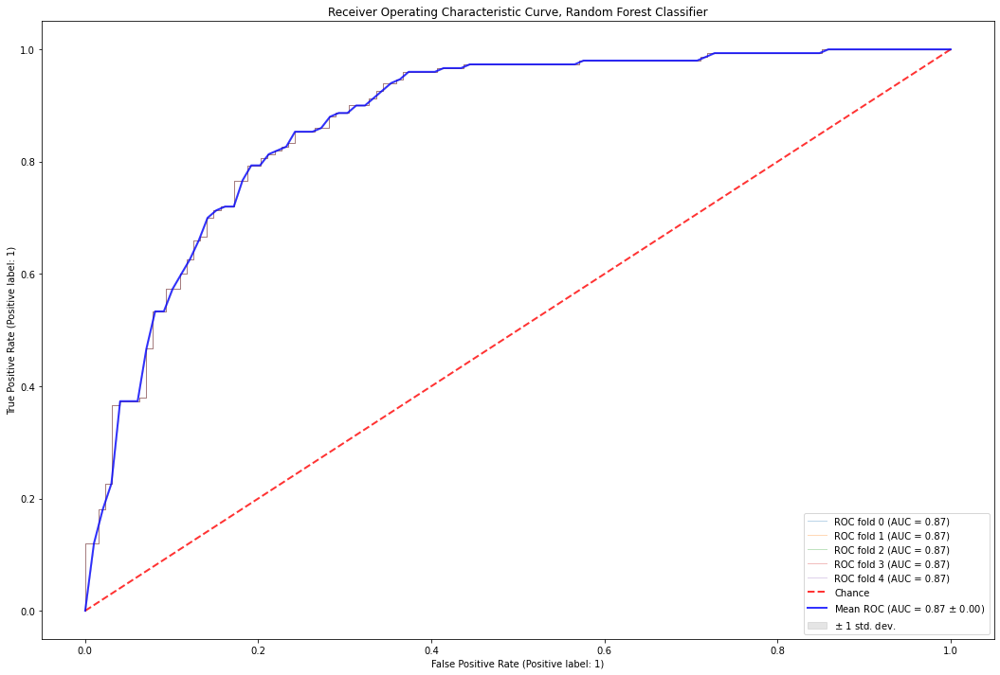

In [98]:
# CLASSIFICAZIONE PER RANDOM FOREST

# Run classifier with cross-validation and plot ROC curves
classifier_random_forest = RandomForestClassifier(max_depth=10, random_state=99)

tprs = []
aucs = []
mean_fpr = np.linspace(0, 1, 100)

fig, ax = plt.subplots()
box = ax.get_position()
ax.set_position([box.x0, box.y0, box.width * 3 , box.height * 3])
for i, (train, test) in enumerate(cv.split(X_train, y_train)):
    clf_random_forest = classifier_random_forest.fit(X_train, y_train)  
    y_pred = clf_random_forest.predict(X_test)
    viz = plot_roc_curve(clf_random_forest, X_test, y_test,
                         name='ROC fold {}'.format(i),
                         alpha=0.3, lw=1, ax=ax)
    interp_tpr = np.interp(mean_fpr, viz.fpr, viz.tpr)
    interp_tpr[0] = 0.0
    tprs.append(interp_tpr)
    aucs.append(viz.roc_auc)

ax.plot([0, 1], [0, 1], linestyle='--', lw=2, color='r',
        label='Chance', alpha=.8)

mean_tpr = np.mean(tprs, axis=0)
mean_tpr[-1] = 1.0
mean_auc = auc(mean_fpr, mean_tpr)
std_auc = np.std(aucs)
ax.plot(mean_fpr, mean_tpr, color='b',
        label=r'Mean ROC (AUC = %0.2f $\pm$ %0.2f)' % (mean_auc, std_auc),
        lw=2, alpha=.8)

std_tpr = np.std(tprs, axis=0)
tprs_upper = np.minimum(mean_tpr + std_tpr, 1)
tprs_lower = np.maximum(mean_tpr - std_tpr, 0)
ax.fill_between(mean_fpr, tprs_lower, tprs_upper, color='grey', alpha=.2,
                label=r'$\pm$ 1 std. dev.')

ax.set(xlim=[-0.05, 1.05], ylim=[-0.05, 1.05],
       title="Receiver Operating Characteristic Curve, Random Forest Classifier")
ax.legend(loc="lower right")
plt.show()
#plt.savefig('/Users/enricoconte/Desktop/Tesi/Workspace_Tesi/grafici/df_originale/Roc_RandomForest.png')

# save the model to disk
filename = 'model_random_forest.sav'
pickle.dump(clf_random_forest, open(filename, 'wb'))


0.802158273381295
[[ 97  31]
 [ 24 126]]


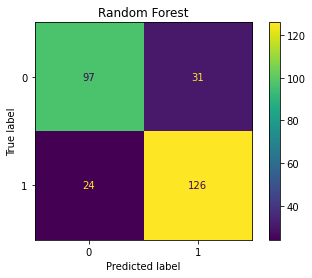

In [99]:
## Valutazione della classificzione RANDOM FOREST
#Accuracy

# Classification Report
report_random_forest = classification_report(y_test, y_pred, output_dict = True)
print(accuracy_score(y_pred, y_test))

# Alternativa più completa
disp = plot_confusion_matrix(clf_random_forest, X_test, y_test, normalize=None) # attenzione all'argomento "normalize".
disp.ax_.set_title ("Random Forest" ) 
print(disp.confusion_matrix )
plt.savefig('/Users/enricoconte/Desktop/Tesi/Workspace_Tesi/grafici/df_originale/conf_matrix_RandomForest.png')
plt.show()

## ExtraTree Classifier

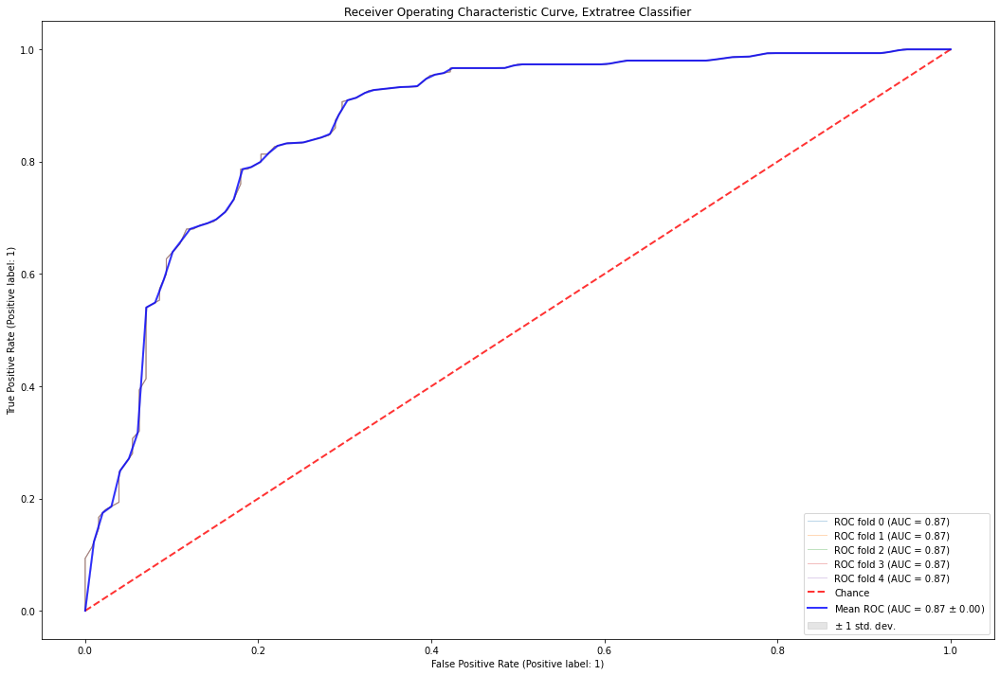

In [100]:
# CLASSIFICAZIONE PER EXTRATREE CLASSIFIER

# Run classifier with cross-validation and plot ROC curves
classifier_extratree = ExtraTreesClassifier(n_estimators=100, random_state=99)

tprs = []
aucs = []
mean_fpr = np.linspace(0, 1, 100)

fig, ax = plt.subplots()
box = ax.get_position()
ax.set_position([box.x0, box.y0, box.width * 3 , box.height * 3])
for i, (train, test) in enumerate(cv.split(X_train, y_train)):
    clf_extratree = classifier_extratree.fit(X_train, y_train)  
    y_pred = clf_extratree.predict(X_test)
    viz = plot_roc_curve(clf_extratree, X_test, y_test,
                         name='ROC fold {}'.format(i),
                         alpha=0.3, lw=1, ax=ax)
    interp_tpr = np.interp(mean_fpr, viz.fpr, viz.tpr)
    interp_tpr[0] = 0.0
    tprs.append(interp_tpr)
    aucs.append(viz.roc_auc)

ax.plot([0, 1], [0, 1], linestyle='--', lw=2, color='r',
        label='Chance', alpha=.8)

mean_tpr = np.mean(tprs, axis=0)
mean_tpr[-1] = 1.0
mean_auc = auc(mean_fpr, mean_tpr)
std_auc = np.std(aucs)
ax.plot(mean_fpr, mean_tpr, color='b',
        label=r'Mean ROC (AUC = %0.2f $\pm$ %0.2f)' % (mean_auc, std_auc),
        lw=2, alpha=.8)

std_tpr = np.std(tprs, axis=0)
tprs_upper = np.minimum(mean_tpr + std_tpr, 1)
tprs_lower = np.maximum(mean_tpr - std_tpr, 0)
ax.fill_between(mean_fpr, tprs_lower, tprs_upper, color='grey', alpha=.2,
                label=r'$\pm$ 1 std. dev.')

ax.set(xlim=[-0.05, 1.05], ylim=[-0.05, 1.05],
       title="Receiver Operating Characteristic Curve, Extratree Classifier")
ax.legend(loc="lower right")
plt.show()

# save the model to disk
filename = 'model_extratree_regression.sav'
pickle.dump(clf_extratree, open(filename, 'wb'))

0.802158273381295
[[ 98  30]
 [ 25 125]]


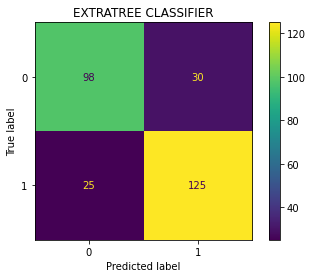

In [101]:
#Accuracy

# Classification Report
report_extratree = classification_report(y_test, y_pred, output_dict = True)
print(accuracy_score(y_pred, y_test))

# Alternativa più completa
disp = plot_confusion_matrix(clf_extratree, X_test, y_test, normalize=None) # attenzione all'argomento "normalize".
disp.ax_.set_title ("EXTRATREE CLASSIFIER" ) 
print(disp.confusion_matrix)
plt.savefig('/Users/enricoconte/Desktop/Tesi/Workspace_Tesi/grafici/df_originale/conf_matrix_EXTRATREE.png')
plt.show ()

## GradientBoosting Classifier

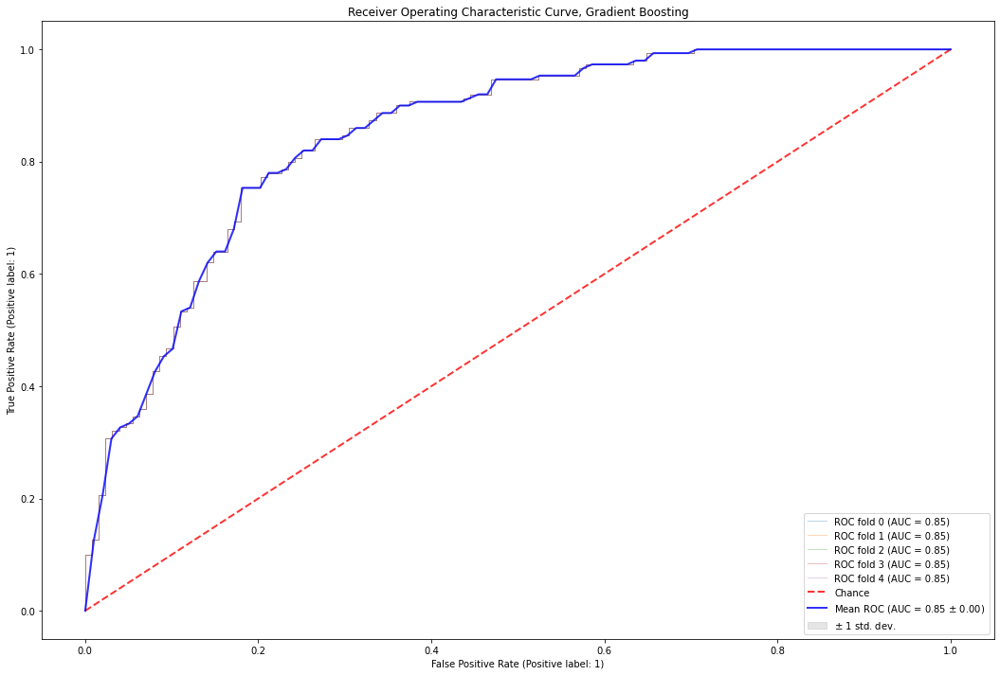

In [102]:
# CLASSIFICAZIONE PER LOGISTIC REGRESSION CROSS-VALIDATA

# Run classifier with cross-validation and plot ROC curves
classifier_gradboost= GradientBoostingClassifier(n_estimators=100, learning_rate=0.1,  max_depth=10, random_state=99)

tprs = []
aucs = []
mean_fpr = np.linspace(0, 1, 100)

fig, ax = plt.subplots()
box = ax.get_position()
ax.set_position([box.x0, box.y0, box.width * 3 , box.height * 3])
for i, (train, test) in enumerate(cv.split(X_train, y_train)):
    clf_gradboost = classifier_gradboost.fit(X_train, y_train)  
    y_pred = clf_gradboost.predict(X_test)
    viz = plot_roc_curve(clf_gradboost, X_test, y_test,
                         name='ROC fold {}'.format(i),
                         alpha=0.3, lw=1, ax=ax)
    interp_tpr = np.interp(mean_fpr, viz.fpr, viz.tpr)
    interp_tpr[0] = 0.0
    tprs.append(interp_tpr)
    aucs.append(viz.roc_auc)

ax.plot([0, 1], [0, 1], linestyle='--', lw=2, color='r',
        label='Chance', alpha=.8)

mean_tpr = np.mean(tprs, axis=0)
mean_tpr[-1] = 1.0
mean_auc = auc(mean_fpr, mean_tpr)
std_auc = np.std(aucs)
ax.plot(mean_fpr, mean_tpr, color='b',
        label=r'Mean ROC (AUC = %0.2f $\pm$ %0.2f)' % (mean_auc, std_auc),
        lw=2, alpha=.8)

std_tpr = np.std(tprs, axis=0)
tprs_upper = np.minimum(mean_tpr + std_tpr, 1)
tprs_lower = np.maximum(mean_tpr - std_tpr, 0)
ax.fill_between(mean_fpr, tprs_lower, tprs_upper, color='grey', alpha=.2,
                label=r'$\pm$ 1 std. dev.')

ax.set(xlim=[-0.05, 1.05], ylim=[-0.05, 1.05],
       title="Receiver Operating Characteristic Curve, Gradient Boosting")
ax.legend(loc="lower right")
plt.show()

# save the model to disk
filename = 'model_gradient_boosting.sav'
pickle.dump(clf_gradboost, open(filename, 'wb'))

0.7805755395683454
[[ 96  32]
 [ 29 121]]


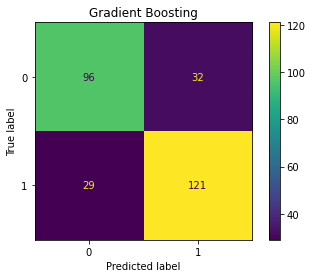

In [103]:
## Valutazione della classificzione GRADIENT BOOSTING
#Accuracy

# Classification Report
report_gradient_boosting = classification_report(y_test, y_pred, output_dict = True)
print(accuracy_score(y_pred, y_test))

# Alternativa più completa
disp = plot_confusion_matrix(clf_gradboost, X_test, y_test, normalize=None) # attenzione all'argomento "normalize".
disp.ax_.set_title ("Gradient Boosting" ) 
print(disp.confusion_matrix )
plt.savefig('/Users/enricoconte/Desktop/Tesi/Workspace_Tesi/grafici/df_originale/conf_matrix_GRADBOOST.png')
plt.show ()

## KNN Classifier

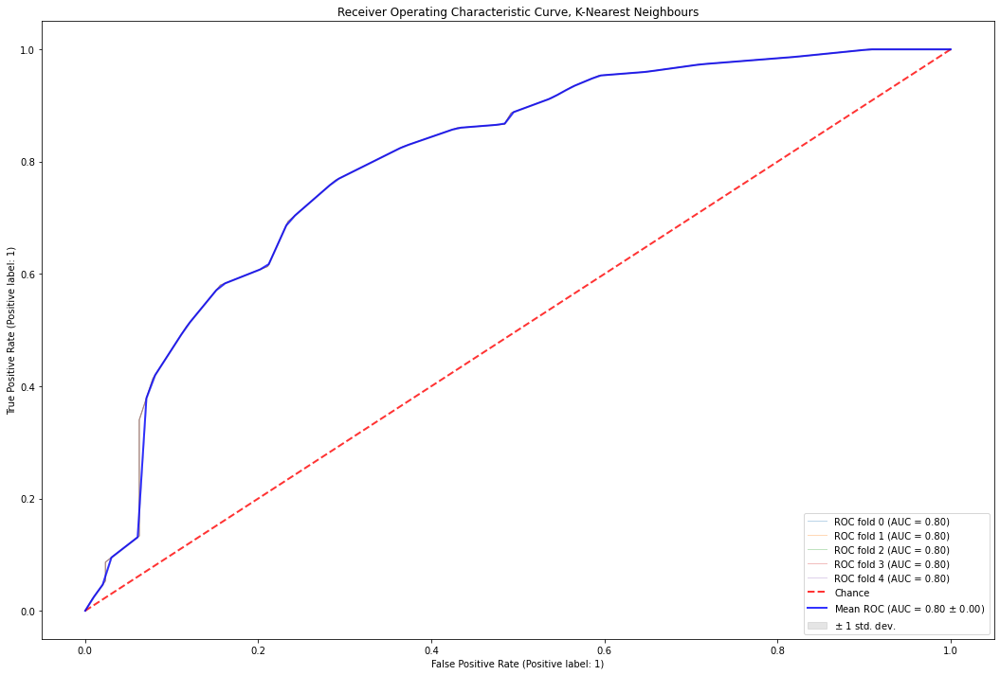

In [104]:
# CLASSIFICAZIONE PER K-NEAREST NEIGHBOUR CLASSIFIER

# Run classifier with cross-validation and plot ROC curves
n_neighbors = 30

classifier_knn = KNeighborsClassifier(n_neighbors, weights='uniform')
tprs = []
aucs = []
mean_fpr = np.linspace(0, 1, 100)

fig, ax = plt.subplots()
box = ax.get_position()
ax.set_position([box.x0, box.y0, box.width * 3 , box.height * 3])
for i, (train, test) in enumerate(cv.split(X_train, y_train)):
    clf_knn = classifier_knn.fit(X_train, y_train)  
    y_pred = clf_knn.predict(X_test)
    viz = plot_roc_curve(clf_knn, X_test, y_test,
                         name='ROC fold {}'.format(i),
                         alpha=0.3, lw=1, ax=ax)
    interp_tpr = np.interp(mean_fpr, viz.fpr, viz.tpr)
    interp_tpr[0] = 0.0
    tprs.append(interp_tpr)
    aucs.append(viz.roc_auc)

ax.plot([0, 1], [0, 1], linestyle='--', lw=2, color='r',
        label='Chance', alpha=.8)

mean_tpr = np.mean(tprs, axis=0)
mean_tpr[-1] = 1.0
mean_auc = auc(mean_fpr, mean_tpr)
std_auc = np.std(aucs)
ax.plot(mean_fpr, mean_tpr, color='b',
        label=r'Mean ROC (AUC = %0.2f $\pm$ %0.2f)' % (mean_auc, std_auc),
        lw=2, alpha=.8)

std_tpr = np.std(tprs, axis=0)
tprs_upper = np.minimum(mean_tpr + std_tpr, 1)
tprs_lower = np.maximum(mean_tpr - std_tpr, 0)
ax.fill_between(mean_fpr, tprs_lower, tprs_upper, color='grey', alpha=.2,
                label=r'$\pm$ 1 std. dev.')

ax.set(xlim=[-0.05, 1.05], ylim=[-0.05, 1.05],
       title="Receiver Operating Characteristic Curve, K-Nearest Neighbours")
ax.legend(loc="lower right")
plt.show()

# save the model to disk
filename = 'model_KNN.sav'
pickle.dump(clf_knn, open(filename, 'wb'))

0.737410071942446
[[ 81  47]
 [ 26 124]]


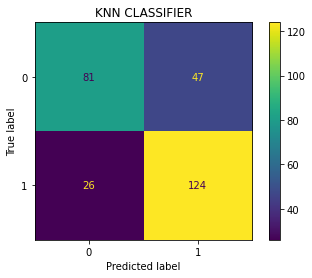

In [105]:
## Valutazione della classificzione SUPPORT VECTOR MACHINE
#Accuracy

# Classification Report
report_knn = classification_report(y_test, y_pred, output_dict = True)
print(accuracy_score(y_pred, y_test))

# Alternativa più completa
disp = plot_confusion_matrix(clf_knn, X_test, y_test, normalize=None) # attenzione all'argomento "normalize".
disp.ax_.set_title ("KNN CLASSIFIER" ) 
print(disp.confusion_matrix )
plt.savefig('/Users/enricoconte/Desktop/Tesi/Workspace_Tesi/grafici/df_originale/conf_matrix_KNN.png')
plt.show ()

## Logistic Regression CV(2)

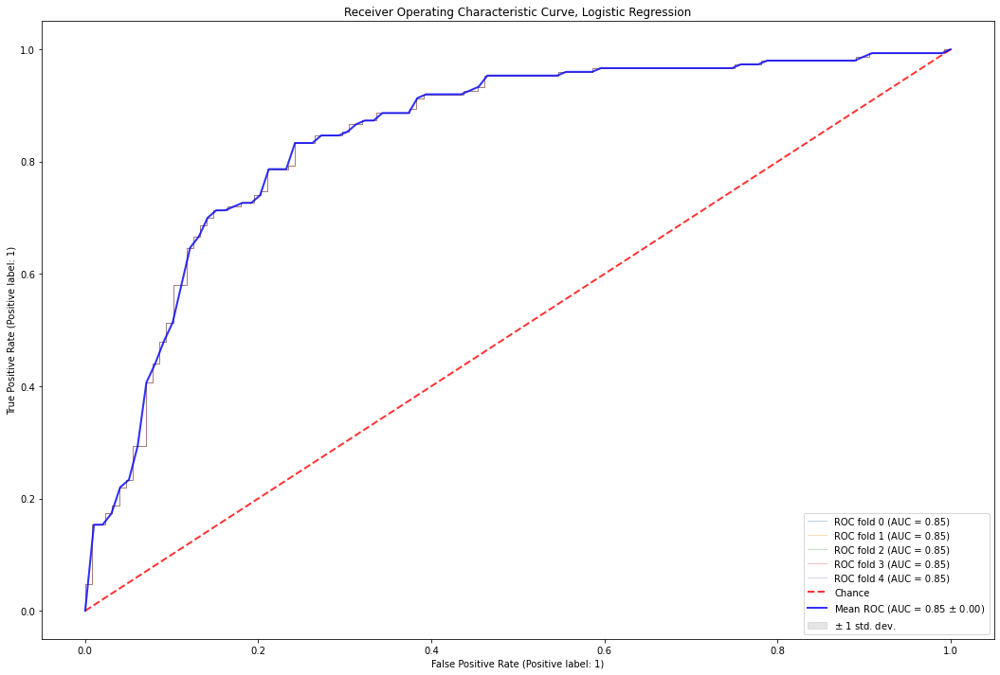

In [106]:
# CLASSIFICAZIONE PER LOGISTIC REGRESSION CROSS-VALIDATA

# Run classifier with cross-validation and plot ROC curves
classifier_log = LogisticRegression(penalty='l2', random_state=998)

tprs = []
aucs = []
mean_fpr = np.linspace(0, 1, 100)

fig, ax = plt.subplots()
box = ax.get_position()
ax.set_position([box.x0, box.y0, box.width * 3 , box.height * 3])
for i, (train, test) in enumerate(cv.split(X_train, y_train)):
    clf_log = classifier_log.fit(X_train, y_train)  
    y_pred = clf_log.predict(X_test)
    viz = plot_roc_curve(clf_log, X_test, y_test,
                         name='ROC fold {}'.format(i),
                         alpha=0.3, lw=1, ax=ax)
    interp_tpr = np.interp(mean_fpr, viz.fpr, viz.tpr)
    interp_tpr[0] = 0.0
    tprs.append(interp_tpr)
    aucs.append(viz.roc_auc)

ax.plot([0, 1], [0, 1], linestyle='--', lw=2, color='r',
        label='Chance', alpha=.8)

mean_tpr = np.mean(tprs, axis=0)
mean_tpr[-1] = 1.0
mean_auc = auc(mean_fpr, mean_tpr)
std_auc = np.std(aucs)
ax.plot(mean_fpr, mean_tpr, color='b',
        label=r'Mean ROC (AUC = %0.2f $\pm$ %0.2f)' % (mean_auc, std_auc),
        lw=2, alpha=.8)

std_tpr = np.std(tprs, axis=0)
tprs_upper = np.minimum(mean_tpr + std_tpr, 1)
tprs_lower = np.maximum(mean_tpr - std_tpr, 0)
ax.fill_between(mean_fpr, tprs_lower, tprs_upper, color='grey', alpha=.2,
                label=r'$\pm$ 1 std. dev.')

ax.set(xlim=[-0.05, 1.05], ylim=[-0.05, 1.05],
       title="Receiver Operating Characteristic Curve, Logistic Regression")
ax.legend(loc="lower right")
plt.show()

# save the model to disk
filename = 'model_logistic_regression.sav'
pickle.dump(clf_log, open(filename, 'wb'))

0.7805755395683454
[[ 97  31]
 [ 30 120]]


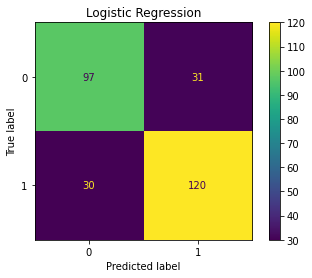

In [107]:
## Valutazione della classificzione SUPPORT VECTOR MACHINE
#Accuracy

# Classification Report
report_logistic = classification_report(y_test, y_pred, output_dict = True)
print(accuracy_score(y_pred, y_test))

# Alternativa più completa
disp = plot_confusion_matrix(clf_log, X_test, y_test, normalize=None) # attenzione all'argomento "normalize".
disp.ax_.set_title ("Logistic Regression" ) 
print(disp.confusion_matrix )
plt.savefig('/Users/enricoconte/Desktop/Tesi/Workspace_Tesi/grafici/df_originale/conf_matrix_LogRegression.png')
plt.show ()

## Support Vector Machine

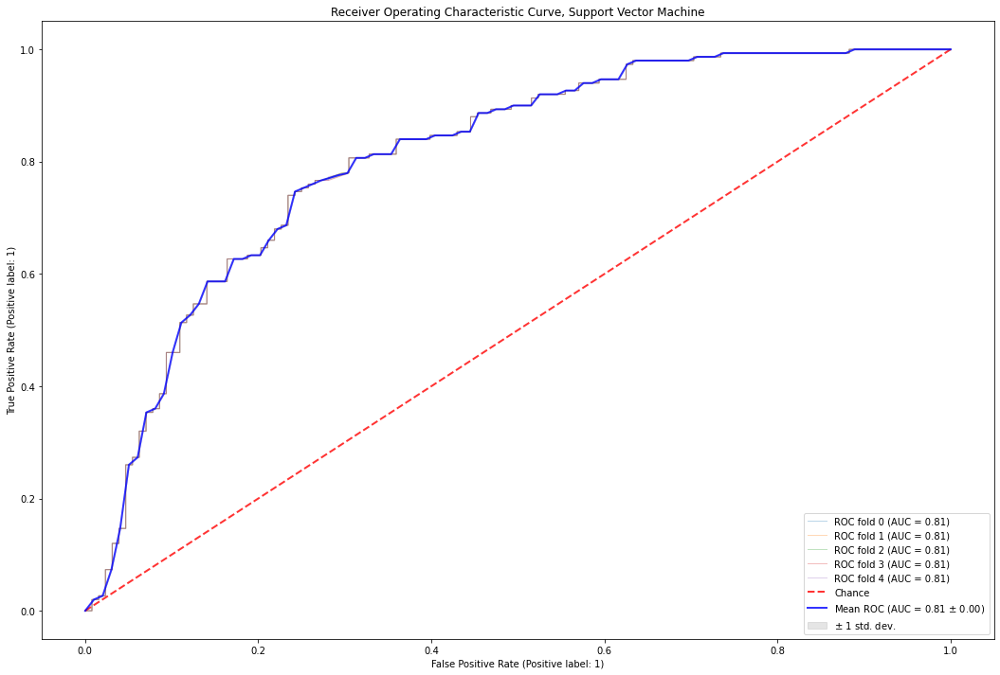

In [108]:
classifier_svc = svm.SVC(kernel='linear', probability=True,
                     random_state=42)

tprs = []
aucs = []
mean_fpr = np.linspace(0, 1, 100)

fig, ax = plt.subplots()
box = ax.get_position()
ax.set_position([box.x0, box.y0, box.width * 3 , box.height * 3])
for i, (train, test) in enumerate(cv.split(X_train, y_train)):
    clf_svc = SVC(C=2,probability=True).fit(X_train, y_train) 
    y_pred = clf_svc.predict(X_test)
    viz = plot_roc_curve(clf_svc, X_test, y_test,
                         name='ROC fold {}'.format(i),
                         alpha=0.3, lw=1, ax=ax)
    interp_tpr = np.interp(mean_fpr, viz.fpr, viz.tpr)
    interp_tpr[0] = 0.0
    tprs.append(interp_tpr)
    aucs.append(viz.roc_auc)

ax.plot([0, 1], [0, 1], linestyle='--', lw=2, color='r',
        label='Chance', alpha=.8)

mean_tpr = np.mean(tprs, axis=0)
mean_tpr[-1] = 1.0
mean_auc = auc(mean_fpr, mean_tpr)
std_auc = np.std(aucs)
ax.plot(mean_fpr, mean_tpr, color='b',
        label=r'Mean ROC (AUC = %0.2f $\pm$ %0.2f)' % (mean_auc, std_auc),
        lw=2, alpha=.8)

std_tpr = np.std(tprs, axis=0)
tprs_upper = np.minimum(mean_tpr + std_tpr, 1)
tprs_lower = np.maximum(mean_tpr - std_tpr, 0)
ax.fill_between(mean_fpr, tprs_lower, tprs_upper, color='grey', alpha=.2,
                label=r'$\pm$ 1 std. dev.')

ax.set(xlim=[-0.05, 1.05], ylim=[-0.05, 1.05],
       title="Receiver Operating Characteristic Curve, Support Vector Machine")
ax.legend(loc="lower right")
plt.show()

# save the model to disk
filename = 'model_SVC.sav'
pickle.dump(clf_svc, open(filename, 'wb'))

0.7482014388489209
[[ 96  32]
 [ 38 112]]


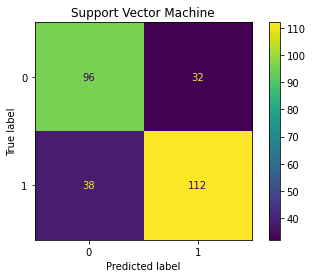

In [109]:
# Classification Report
report_svc = classification_report(y_test, y_pred, output_dict = True)
print(accuracy_score(y_pred, y_test))

# Alternativa più completa
disp = plot_confusion_matrix(clf_svc, X_test, y_test, normalize=None) # attenzione all'argomento "normalize".
disp.ax_.set_title ("Support Vector Machine" ) 
print(disp.confusion_matrix )
plt.savefig('/Users/enricoconte/Desktop/Tesi/Workspace_Tesi/grafici/df_originale/conf_matrix_SVM.png')
plt.show ()

## NAIVE BAYES CLASSIFIER

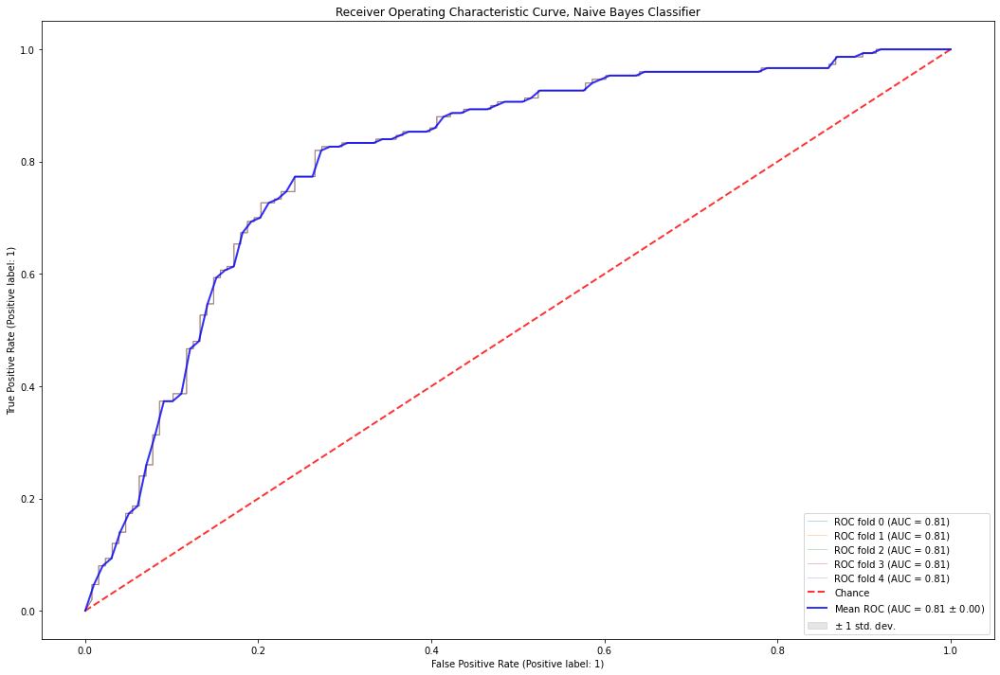

In [110]:
tprs = []
aucs = []
mean_fpr = np.linspace(0, 1, 100)

fig, ax = plt.subplots()
box = ax.get_position()
ax.set_position([box.x0, box.y0, box.width * 3 , box.height * 3])
for i, (train, test) in enumerate(cv.split(X_train, y_train)):
    clf_nb = GaussianNB().fit(X_train, y_train)  
    y_pred_nb = clf_nb.predict(X_test)
    viz = plot_roc_curve(clf_nb, X_test, y_test,
                         name='ROC fold {}'.format(i),
                         alpha=0.3, lw=1, ax=ax)
    interp_tpr = np.interp(mean_fpr, viz.fpr, viz.tpr)
    interp_tpr[0] = 0.0
    tprs.append(interp_tpr)
    aucs.append(viz.roc_auc)

ax.plot([0, 1], [0, 1], linestyle='--', lw=2, color='r',
        label='Chance', alpha=.8)

mean_tpr = np.mean(tprs, axis=0)
mean_tpr[-1] = 1.0
mean_auc = auc(mean_fpr, mean_tpr)
std_auc = np.std(aucs)
ax.plot(mean_fpr, mean_tpr, color='b',
        label=r'Mean ROC (AUC = %0.2f $\pm$ %0.2f)' % (mean_auc, std_auc),
        lw=2, alpha=.8)

std_tpr = np.std(tprs, axis=0)
tprs_upper = np.minimum(mean_tpr + std_tpr, 1)
tprs_lower = np.maximum(mean_tpr - std_tpr, 0)
ax.fill_between(mean_fpr, tprs_lower, tprs_upper, color='grey', alpha=.2,
                label=r'$\pm$ 1 std. dev.')

ax.set(xlim=[-0.05, 1.05], ylim=[-0.05, 1.05],
       title="Receiver Operating Characteristic Curve, Naive Bayes Classifier")
ax.legend(loc="lower right")
plt.show()

# save the model to disk
filename = 'model_NaiveBayes.sav'
pickle.dump(clf_nb, open(filename, 'wb'))

0.7589928057553957
[[ 95  33]
 [ 34 116]]


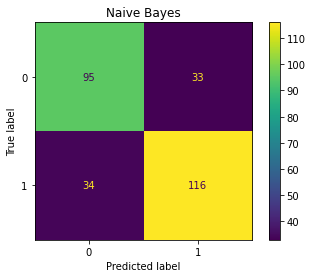

In [111]:
# Classificaion Report
report_nb = classification_report(y_test, y_pred_nb, output_dict = True)
print(accuracy_score(y_pred_nb, y_test))


# Alternativa più completa
disp_nb = plot_confusion_matrix(clf_nb, X_test, y_test, normalize=None) # attenzione all'argomento "normalize".
disp_nb.ax_.set_title ("Naive Bayes" ) 
print(disp_nb.confusion_matrix )
plt.savefig('/Users/enricoconte/Desktop/Tesi/Workspace_Tesi/grafici/df_originale/conf_matrix_NaiveBayes.png')
plt.show ()

## BAGGING CLASSIFIER

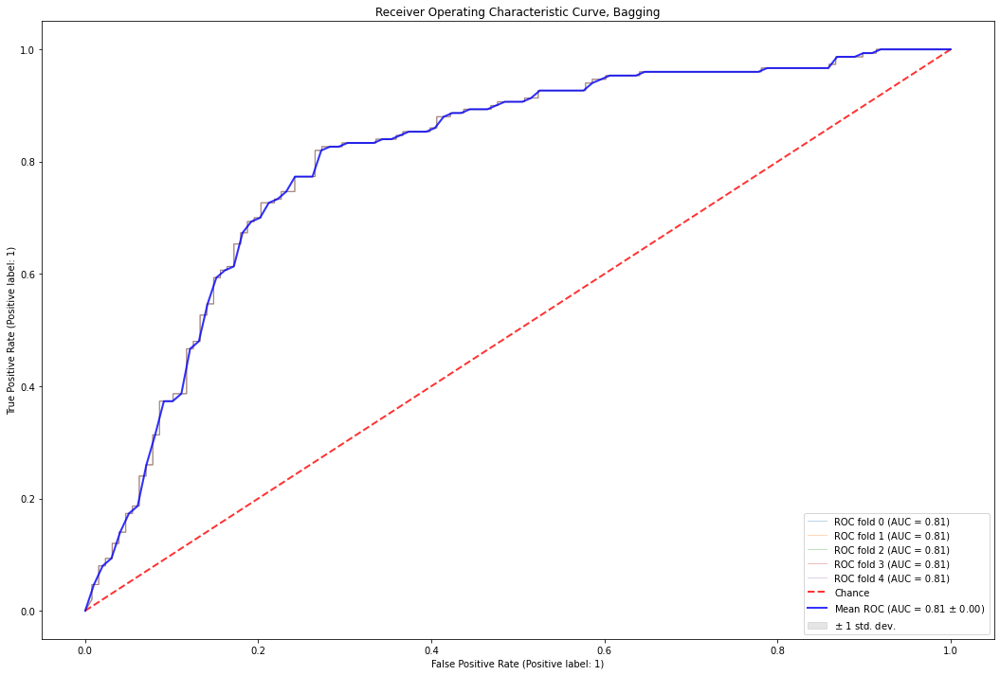

In [112]:
clf_bagging = BaggingClassifier(base_estimator=SVC(),  n_estimators = 30, random_state=99).fit(X_train, y_train)

tprs = []
aucs = []
mean_fpr = np.linspace(0, 1, 100)

fig, ax = plt.subplots()
box = ax.get_position()
ax.set_position([box.x0, box.y0, box.width * 3 , box.height * 3])
for i, (train, test) in enumerate(cv.split(X_train, y_train)):
    clf_bagging = BaggingClassifier(base_estimator=SVC(),  n_estimators = 10, random_state=99).fit(X_train, y_train)
    y_pred_bagging = clf_bagging.predict(X_test)
    viz = plot_roc_curve(clf_nb, X_test, y_test,
                         name='ROC fold {}'.format(i),
                         alpha=0.3, lw=1, ax=ax)
    interp_tpr = np.interp(mean_fpr, viz.fpr, viz.tpr)
    interp_tpr[0] = 0.0
    tprs.append(interp_tpr)
    aucs.append(viz.roc_auc)

ax.plot([0, 1], [0, 1], linestyle='--', lw=2, color='r',
        label='Chance', alpha=.8)

mean_tpr = np.mean(tprs, axis=0)
mean_tpr[-1] = 1.0
mean_auc = auc(mean_fpr, mean_tpr)
std_auc = np.std(aucs)
ax.plot(mean_fpr, mean_tpr, color='b',
        label=r'Mean ROC (AUC = %0.2f $\pm$ %0.2f)' % (mean_auc, std_auc),
        lw=2, alpha=.8)

std_tpr = np.std(tprs, axis=0)
tprs_upper = np.minimum(mean_tpr + std_tpr, 1)
tprs_lower = np.maximum(mean_tpr - std_tpr, 0)
ax.fill_between(mean_fpr, tprs_lower, tprs_upper, color='grey', alpha=.2,
                label=r'$\pm$ 1 std. dev.')

ax.set(xlim=[-0.05, 1.05], ylim=[-0.05, 1.05],
       title="Receiver Operating Characteristic Curve, Bagging")
ax.legend(loc="lower right")
plt.show()

# save the model to disk
filename = 'model_Bagging.sav'
pickle.dump(clf_bagging, open(filename, 'wb'))

0.7589928057553957
[[ 95  33]
 [ 34 116]]


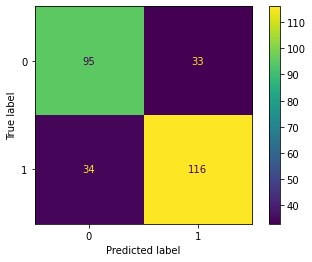

In [113]:
# Classificaion Report
report_bagging = classification_report(y_test, y_pred_bagging, output_dict = True)
print(accuracy_score(y_pred_nb, y_test))


# Alternativa più completa
disp_bagging = plot_confusion_matrix(clf_nb, X_test, y_test, normalize=None) # attenzione all'argomento "normalize".
disp_nb.ax_.set_title ("Bagging Ensemble - 10 SVC" ) 
print(disp_nb.confusion_matrix )
plt.savefig('/Users/enricoconte/Desktop/Tesi/Workspace_Tesi/grafici/df_originale/conf_matrix_Bagging.png')
plt.show ()

## Test dei modelli allenati con i dati originali sui dati perturbati, preparo i test/training set dei diversi dataset

In [114]:
# Splitto i dati perturbati con il metodo GAUSSIANO per poter misurare la performance dei modelli su questi dati 

X_train_gaussian, X_test_gaussian, y_train_gaussian, y_test_gaussian = train_test_split(noised_gaussian.iloc[:, 2:], noised_gaussian['target'], test_size = 0.20, random_state = 42, shuffle = True, stratify = noised_gaussian['target'])   # dove "x" è una lista di vettori e "y" è 

In [115]:
# Splitto i dati perturbati con il metodo DIFFERENZIATO per poter misurare la performance dei modelli su questi dati 

X_train_differenziati, X_test_differenziati, y_train_differenziati, y_test_differenziati = train_test_split(noised_differenziati.iloc[:, 2:], noised_differenziati['target'], test_size = 0.20, random_state = 42, shuffle = True, stratify = noised_differenziati['target'])   # dove "x" è una lista di vettori e "y" è 

In [504]:
# Splitto i dati perturbati con la RETE BAYESIANA per poter misurare la performance dei modelli su questi dati 

df_bnet = pd.read_csv('/Users/enricoconte/Desktop/Tesi/Workspace_Tesi/bnet_R_abs.csv')
del(df_bnet['Unnamed: 0'])

X_train_Bnet, X_test_Bnet, y_train_Bnet, y_test_Bnet = train_test_split(df_bnet.iloc[:, :-1], df_bnet['target'], test_size = 0.20, random_state = 42, shuffle = True, stratify = df_bnet['target'])   # dove "x" è una lista di vettori e "y" è 

## Paragone Modelli Bagging

In [117]:
# Recupero il modello allenato e lo testo sui dati perturbati, dopo confronto i classsification reports.
filename = 'model_Bagging.sav'

#carico il modello allenato
loaded_model = pickle.load(open(filename, 'rb'))

# gli faccio fare lo scoring sui dati con rumore gaussiano e differenzato
y_pred_bagging_gaussian = loaded_model.predict(X_test_gaussian)
score_gaussian = loaded_model.score(X_test_gaussian, y_test_gaussian)

y_pred_bagging_differenziati = loaded_model.predict(X_test_differenziati)
score_differenziati = loaded_model.score(X_test_differenziati, y_test_differenziati)

y_pred_bagging_Bnet = loaded_model.predict(X_test_Bnet)
score_Bnet = loaded_model.score(X_test_Bnet, y_test_Bnet)


#Creo i report 
report_bagging_gaussian = classification_report(y_test_gaussian, y_pred_bagging_gaussian, output_dict = True)
report_bagging_differenziati = classification_report(y_test_differenziati, y_pred_bagging_differenziati, output_dict = True)
report_bagging_Bnet = classification_report(y_test_Bnet, y_pred_bagging_Bnet, output_dict = True)


roc_bagging_baseline = roc_auc_score(y_test, loaded_model.predict_proba(X_test)[:,1])
roc_bagging_gaussina = roc_auc_score(y_test_gaussian, loaded_model.predict_proba(X_test_gaussian)[:,1])
roc_bagging_differenziati = roc_auc_score(y_test_differenziati, loaded_model.predict_proba(X_test_differenziati)[:,1])
roc_bagging_bnet = roc_auc_score(y_test_Bnet, loaded_model.predict_proba(X_test_Bnet)[:,1])


#printo i risultati
print('Report Bagging Non Perturbato:', '\n',report_bagging)
print('\n')
print('Report Bagging Gaussian:', '\n',report_bagging_gaussian)
print('\n')
print('Report Bagging Differenziati:', '\n',report_bagging_differenziati)
print('\n')
print('Report Bagging Bayesian Net:', '\n',report_bagging_Bnet)
print('\n')
print('Confronto AUC: baseline', '\n',roc_bagging_baseline)
print('\n')
print('AUC: gaussian noise', '\n', roc_bagging_gaussina )
print('\n')
print('AUC: differenziati noise', '\n', roc_bagging_differenziati )
print('\n')
print('AUC: Bnet noise', '\n', roc_bagging_bnet )

## Salvo i report come file .pickle
a_file = open("report_bagging_NON_Perturbato.pkl", "wb")
pickle.dump(report_bagging, a_file)
a_file.close()

a_file = open("report_bagging_Gaussian.pkl", "wb")
pickle.dump(report_bagging_gaussian, a_file)
a_file.close()

a_file = open("report_bagging_Differenziati.pkl", "wb")
pickle.dump(report_bagging_differenziati, a_file)
a_file.close()

a_file = open("report_bagging_Bnet.pkl", "wb")
pickle.dump(report_bagging_Bnet, a_file)
a_file.close()

Report Bagging Non Perturbato: 
 {'0': {'precision': 0.7101449275362319, 'recall': 0.765625, 'f1-score': 0.736842105263158, 'support': 128}, '1': {'precision': 0.7857142857142857, 'recall': 0.7333333333333333, 'f1-score': 0.7586206896551724, 'support': 150}, 'accuracy': 0.7482014388489209, 'macro avg': {'precision': 0.7479296066252588, 'recall': 0.7494791666666667, 'f1-score': 0.7477313974591652, 'support': 278}, 'weighted avg': {'precision': 0.7509197610855416, 'recall': 0.7482014388489209, 'f1-score': 0.7485931400070507, 'support': 278}}


Report Bagging Gaussian: 
 {'0': {'precision': 0.4714828897338403, 'recall': 0.9763779527559056, 'f1-score': 0.6358974358974359, 'support': 127}, '1': {'precision': 0.8, 'recall': 0.07947019867549669, 'f1-score': 0.14457831325301204, 'support': 151}, 'accuracy': 0.4892086330935252, 'macro avg': {'precision': 0.6357414448669202, 'recall': 0.5279240757157011, 'f1-score': 0.39023787457522396, 'support': 278}, 'weighted avg': {'precision': 0.6499220395

In [377]:
var_bagging

0.035991007194244605

## Paragone modelli Logistic Regression

In [118]:
# Recupero il modello allenato e lo testo sui dati perturbati, dopo confronto i classification reports.
filename = 'model_logistic_regression.sav'

loaded_model = pickle.load(open(filename, 'rb'))

# gli faccio fare lo scoring sui dati con rumore gaussiano e differenzato
y_pred_logistic_gaussian = loaded_model.predict(X_test_gaussian)
score_gaussian = loaded_model.score(X_test_gaussian, y_test_gaussian)

y_pred_logistic_differenziati = loaded_model.predict(X_test_differenziati)
score_differenziati = loaded_model.score(X_test_differenziati, y_test_differenziati)

y_pred_logistic_Bnet = loaded_model.predict(X_test_Bnet)
score_Bnet = loaded_model.score(X_test_Bnet, y_test_Bnet)


#Creo i report 
report_logistic_gaussian = classification_report(y_test_gaussian, y_pred_logistic_gaussian, output_dict = True)
report_logistic_differenziati = classification_report(y_test_differenziati, y_pred_logistic_differenziati, output_dict = True)
report_logistic_Bnet = classification_report(y_test_Bnet, y_pred_logistic_Bnet, output_dict = True)

roc_logistic_baseline = roc_auc_score(y_test, loaded_model.predict_proba(X_test)[:,1])
roc_logistic_gaussina = roc_auc_score(y_test_gaussian, loaded_model.predict_proba(X_test_gaussian)[:,1])
roc_logistic_differenziati = roc_auc_score(y_test_differenziati, loaded_model.predict_proba(X_test_differenziati)[:,1])
roc_logistic_bnet = roc_auc_score(y_test_Bnet, loaded_model.predict_proba(X_test_Bnet)[:,1])




#printo i risultati
print('Report Logistic Non Perturbato:', '\n',report_logistic)
print('\n')
print('Report Logistic Gaussian:', '\n',report_logistic_gaussian)
print('\n')
print('Report Logistic Differenziati:', '\n',report_logistic_differenziati)
print('\n')
print('Report Logistic Bayesian Net:', '\n',report_logistic_Bnet)
print('\n')
print('Confronto AUC: baseline', '\n',roc_logistic_baseline)
print('\n')
print('AUC: gaussian noise', '\n', roc_logistic_gaussina )
print('\n')
print('AUC: differenziati noise', '\n', roc_logistic_differenziati )
print('\n')
print('AUC: Bnet noise', '\n', roc_logistic_bnet )



## Salvo i report come file .pickle
a_file = open("report_logistic_NON_Perturbato.pkl", "wb")
pickle.dump(report_logistic, a_file)
a_file.close()

a_file = open("report_logistic_Gaussian.pkl", "wb")
pickle.dump(report_logistic_gaussian, a_file)
a_file.close()

a_file = open("report_logistic_Differenziati.pkl", "wb")
pickle.dump(report_logistic_differenziati, a_file)
a_file.close()

a_file = open("report_logistic_Bnet.pkl", "wb")
pickle.dump(report_logistic_Bnet, a_file)
a_file.close()

Report Logistic Non Perturbato: 
 {'0': {'precision': 0.7637795275590551, 'recall': 0.7578125, 'f1-score': 0.7607843137254902, 'support': 128}, '1': {'precision': 0.7947019867549668, 'recall': 0.8, 'f1-score': 0.79734219269103, 'support': 150}, 'accuracy': 0.7805755395683454, 'macro avg': {'precision': 0.779240757157011, 'recall': 0.77890625, 'f1-score': 0.7790632532082601, 'support': 278}, 'weighted avg': {'precision': 0.780464307700734, 'recall': 0.7805755395683454, 'f1-score': 0.7805097879874722, 'support': 278}}


Report Logistic Gaussian: 
 {'0': {'precision': 0.4601449275362319, 'recall': 1.0, 'f1-score': 0.630272952853598, 'support': 127}, '1': {'precision': 1.0, 'recall': 0.013245033112582781, 'f1-score': 0.0261437908496732, 'support': 151}, 'accuracy': 0.46402877697841727, 'macro avg': {'precision': 0.730072463768116, 'recall': 0.5066225165562914, 'f1-score': 0.3282083718516356, 'support': 278}, 'weighted avg': {'precision': 0.7533755604212282, 'recall': 0.46402877697841727, '

In [371]:
var_log

0.04090827338129496

## Paragone modelli Naive Bayes

In [119]:
# Recupero il modello allenato e lo testo sui dati perturbati, dopo confronto i classification reports.
filename = 'model_NaiveBayes.sav'

loaded_model = pickle.load(open(filename, 'rb'))

# gli faccio fare lo scoring sui dati con rumore gaussiano e differenzato
y_pred_NaiveBayes_gaussian = loaded_model.predict(X_test_gaussian)
score_gaussian = loaded_model.score(X_test_gaussian, y_test_gaussian)

y_pred_NaiveBayes_differenziati = loaded_model.predict(X_test_differenziati)
score_differenziati = loaded_model.score(X_test_differenziati, y_test_differenziati)

y_pred_NaiveBayes_Bnet = loaded_model.predict(X_test_Bnet)
score_Bnet = loaded_model.score(X_test_Bnet, y_test_Bnet)


#Creo i report 
report_NaiveBayes_gaussian = classification_report(y_test_gaussian, y_pred_NaiveBayes_gaussian, output_dict = True)
report_NaiveBayes_differenziati = classification_report(y_test_differenziati, y_pred_NaiveBayes_differenziati, output_dict = True)
report_NaiveBayes_Bnet = classification_report(y_test_Bnet, y_pred_NaiveBayes_Bnet, output_dict = True)

roc_NaiveBayes_baseline = roc_auc_score(y_test, loaded_model.predict_proba(X_test)[:,1])
roc_NaiveBayes_gaussina = roc_auc_score(y_test_gaussian, loaded_model.predict_proba(X_test_gaussian)[:,1])
roc_NaiveBayes_differenziati = roc_auc_score(y_test_differenziati, loaded_model.predict_proba(X_test_differenziati)[:,1])
roc_NaiveBayes_bnet = roc_auc_score(y_test_Bnet, loaded_model.predict_proba(X_test_Bnet)[:,1])



#printo i risultati
print('Report NaiveBayes Non Perturbato:', '\n',report_nb)
print('\n')
print('Report NaiveBayes Gaussian:', '\n',report_NaiveBayes_gaussian)
print('\n')
print('Report NaiveBayes Differenziati:', '\n',report_NaiveBayes_differenziati)
print('\n')
print('Report NaiveBayes Bayesian Net:', '\n',report_NaiveBayes_Bnet)
print('\n')
print('Confronto AUC: baseline', '\n',roc_NaiveBayes_baseline)
print('\n')
print('AUC: gaussian noise', '\n', roc_NaiveBayes_gaussina )
print('\n')
print('AUC: differenziati noise', '\n', roc_NaiveBayes_differenziati )
print('\n')
print('AUC: Bnet noise', '\n', roc_NaiveBayes_bnet )



## Salvo i report come file .pickle
a_file = open("report_NaiveBayes_NON_Perturbato.pkl", "wb")
pickle.dump(report_nb, a_file)
a_file.close()

a_file = open("report_NaiveBayes_Gaussian.pkl", "wb")
pickle.dump(report_NaiveBayes_gaussian, a_file)
a_file.close()

a_file = open("report_NaiveBayes_Differenziati.pkl", "wb")
pickle.dump(report_NaiveBayes_differenziati, a_file)
a_file.close()

a_file = open("report_NaiveBayes_Bnet.pkl", "wb")
pickle.dump(report_NaiveBayes_Bnet, a_file)
a_file.close()

Report NaiveBayes Non Perturbato: 
 {'0': {'precision': 0.7364341085271318, 'recall': 0.7421875, 'f1-score': 0.7392996108949416, 'support': 128}, '1': {'precision': 0.7785234899328859, 'recall': 0.7733333333333333, 'f1-score': 0.7759197324414716, 'support': 150}, 'accuracy': 0.7589928057553957, 'macro avg': {'precision': 0.7574787992300088, 'recall': 0.7577604166666667, 'f1-score': 0.7576096716682066, 'support': 278}, 'weighted avg': {'precision': 0.7591442064079342, 'recall': 0.7589928057553957, 'f1-score': 0.7590586692833571, 'support': 278}}


Report NaiveBayes Gaussian: 
 {'0': {'precision': 0.4568345323741007, 'recall': 1.0, 'f1-score': 0.6271604938271604, 'support': 127}, '1': {'precision': 0.0, 'recall': 0.0, 'f1-score': 0.0, 'support': 151}, 'accuracy': 0.4568345323741007, 'macro avg': {'precision': 0.22841726618705036, 'recall': 0.5, 'f1-score': 0.3135802469135802, 'support': 278}, 'weighted avg': {'precision': 0.20869778996946325, 'recall': 0.4568345323741007, 'f1-score': 0.2

In [380]:
var_naivebayes

0.07028165467625899

## Paragone Support Vector Machine

In [120]:
# Recupero il modello allenato e lo testo sui dati perturbati, dopo confronto i classsification reports.
filename = 'model_SVC.sav'

loaded_model = pickle.load(open(filename, 'rb'))
# gli faccio fare lo scoring sui dati con rumore gaussiano e differenzato
y_pred_svm_gaussian = loaded_model.predict(X_test_gaussian)
score_gaussian = loaded_model.score(X_test_gaussian, y_test_gaussian)

y_pred_svm_differenziati = loaded_model.predict(X_test_differenziati)
score_differenziati = loaded_model.score(X_test_differenziati, y_test_differenziati)

y_pred_svm_Bnet = loaded_model.predict(X_test_Bnet)
score_Bnet = loaded_model.score(X_test_Bnet, y_test_Bnet)


#Creo i report 
report_svm_gaussian = classification_report(y_test_gaussian, y_pred_svm_gaussian, output_dict = True)
report_svm_differenziati = classification_report(y_test_differenziati, y_pred_svm_differenziati, output_dict = True)
report_svm_Bnet = classification_report(y_test_Bnet, y_pred_svm_Bnet, output_dict = True)

roc_svm_baseline = roc_auc_score(y_test, loaded_model.predict_proba(X_test)[:,1])
roc_svm_gaussina = roc_auc_score(y_test_gaussian, loaded_model.predict_proba(X_test_gaussian)[:,1])
roc_svm_differenziati = roc_auc_score(y_test_differenziati, loaded_model.predict_proba(X_test_differenziati)[:,1])
roc_svm_bnet = roc_auc_score(y_test_Bnet, loaded_model.predict_proba(X_test_Bnet)[:,1])



#printo i risultati
print('Report SVM Non Perturbato:', '\n',report_svc)
print('\n')
print('Report SVM Gaussian:', '\n',report_svm_gaussian)
print('\n')
print('Report SVM Differenziati:', '\n',report_svm_differenziati)
print('\n')
print('Report SVM Bayesian Net:', '\n',report_svm_Bnet)
print('\n')
print('Confronto AUC: baseline', '\n',roc_svm_baseline)
print('\n')
print('AUC: gaussian noise', '\n', roc_svm_gaussina )
print('\n')
print('AUC: differenziati noise', '\n', roc_svm_differenziati )
print('\n')
print('AUC: Bnet noise', '\n', roc_svm_bnet )



## Salvo i report come file .pickle
a_file = open("report_SVM_NON_Perturbato.pkl", "wb")
pickle.dump(report_svc, a_file)
a_file.close()

a_file = open("report_SVM_Gaussian.pkl", "wb")
pickle.dump(report_svm_gaussian, a_file)
a_file.close()

a_file = open("report_SVM_Differenziati.pkl", "wb")
pickle.dump(report_svm_differenziati, a_file)
a_file.close()

a_file = open("report_SVM_Bnet.pkl", "wb")
pickle.dump(report_svm_Bnet, a_file)
a_file.close()

Report SVM Non Perturbato: 
 {'0': {'precision': 0.7164179104477612, 'recall': 0.75, 'f1-score': 0.7328244274809161, 'support': 128}, '1': {'precision': 0.7777777777777778, 'recall': 0.7466666666666667, 'f1-score': 0.761904761904762, 'support': 150}, 'accuracy': 0.7482014388489209, 'macro avg': {'precision': 0.7470978441127695, 'recall': 0.7483333333333333, 'f1-score': 0.7473645946928391, 'support': 278}, 'weighted avg': {'precision': 0.7495257525323025, 'recall': 0.7482014388489209, 'f1-score': 0.7485152554074517, 'support': 278}}


Report SVM Gaussian: 
 {'0': {'precision': 0.47509578544061304, 'recall': 0.9763779527559056, 'f1-score': 0.6391752577319587, 'support': 127}, '1': {'precision': 0.8235294117647058, 'recall': 0.09271523178807947, 'f1-score': 0.16666666666666669, 'support': 151}, 'accuracy': 0.49640287769784175, 'macro avg': {'precision': 0.6493125986026594, 'recall': 0.5345465922719925, 'f1-score': 0.4029209621993127, 'support': 278}, 'weighted avg': {'precision': 0.664352

In [378]:
var_svm

0.040038848920863304

## Paragone Random Forest

In [121]:
# Recupero il modello allenato e lo testo sui dati perturbati, dopo confronto i classsification reports.
filename = 'model_random_forest.sav'

loaded_model = pickle.load(open(filename, 'rb'))

# gli faccio fare lo scoring sui dati con rumore gaussiano e differenzato
y_pred_random_forest_gaussian = loaded_model.predict(X_test_gaussian)
score_gaussian = loaded_model.score(X_test_gaussian, y_test_gaussian)

y_pred_random_forest_differenziati = loaded_model.predict(X_test_differenziati)
score_differenziati = loaded_model.score(X_test_differenziati, y_test_differenziati)

y_pred_random_forest_Bnet = loaded_model.predict(X_test_Bnet)
score_Bnet = loaded_model.score(X_test_Bnet, y_test_Bnet)



#Creo i report 
report_random_forest_gaussian = classification_report(y_test_gaussian, y_pred_random_forest_gaussian, output_dict = True)
report_random_forest_differenziati = classification_report(y_test_differenziati, y_pred_random_forest_differenziati, output_dict = True)
report_random_forest_Bnet = classification_report(y_test_Bnet, y_pred_random_forest_Bnet, output_dict = True)

roc_random_forest_baseline = roc_auc_score(y_test, loaded_model.predict_proba(X_test)[:,1])
roc_random_forest_gaussina = roc_auc_score(y_test_gaussian, loaded_model.predict_proba(X_test_gaussian)[:,1])
roc_random_forest_differenziati = roc_auc_score(y_test_differenziati, loaded_model.predict_proba(X_test_differenziati)[:,1])
roc_random_forest_bnet = roc_auc_score(y_test_Bnet, loaded_model.predict_proba(X_test_Bnet)[:,1])

#printo i risultati
print('Report Random Forest Non Perturbato:', '\n',report_random_forest)
print('\n')
print('Report Random Forest Gaussian:', '\n',report_random_forest_gaussian)
print('\n')
print('Report Random Forest Differenziati:', '\n',report_random_forest_differenziati)
print('\n')
print('Report Random Forest Bayesian Net:', '\n',report_random_forest_Bnet)
print('\n')
print('Confronto AUC: baseline', '\n',roc_random_forest_baseline)
print('\n')
print('AUC: gaussian noise', '\n', roc_random_forest_gaussina )
print('\n')
print('AUC: differenziati noise', '\n', roc_random_forest_differenziati )
print('\n')
print('AUC: Bnet noise', '\n', roc_random_forest_bnet )


## Salvo i report come file .pickle
a_file = open("report_Random_Forest_NON_Perturbato.pkl", "wb")
pickle.dump(report_random_forest, a_file)
a_file.close()

a_file = open("report_Random_Forest_Gaussian.pkl", "wb")
pickle.dump(report_random_forest_gaussian, a_file)
a_file.close()

a_file = open("report_Random_Forest_Differenziati.pkl", "wb")
pickle.dump(report_random_forest_differenziati, a_file)
a_file.close()

a_file = open("report_Random_Forest_Bnet.pkl", "wb")
pickle.dump(report_random_forest_Bnet, a_file)
a_file.close()

Report Random Forest Non Perturbato: 
 {'0': {'precision': 0.8016528925619835, 'recall': 0.7578125, 'f1-score': 0.7791164658634538, 'support': 128}, '1': {'precision': 0.802547770700637, 'recall': 0.84, 'f1-score': 0.8208469055374592, 'support': 150}, 'accuracy': 0.802158273381295, 'macro avg': {'precision': 0.8021003316313102, 'recall': 0.7989062499999999, 'f1-score': 0.7999816857004565, 'support': 278}, 'weighted avg': {'precision': 0.8021357404785231, 'recall': 0.802158273381295, 'f1-score': 0.8016328901479891, 'support': 278}}


Report Random Forest Gaussian: 
 {'0': {'precision': 0.4542124542124542, 'recall': 0.9763779527559056, 'f1-score': 0.62, 'support': 127}, '1': {'precision': 0.4, 'recall': 0.013245033112582781, 'f1-score': 0.02564102564102564, 'support': 151}, 'accuracy': 0.45323741007194246, 'macro avg': {'precision': 0.42710622710622714, 'recall': 0.49481149293424415, 'f1-score': 0.32282051282051283, 'support': 278}, 'weighted avg': {'precision': 0.4247661211689989, 'reca

In [374]:
var_randomforest

0.043616906474820145

## Paragone ExtraTree

In [122]:
# Recupero il modello allenato e lo testo sui dati perturbati, dopo confronto i classsification reports.
filename = 'model_extratree_regression.sav'

loaded_model = pickle.load(open(filename, 'rb'))

# gli faccio fare lo scoring sui dati con rumore gaussiano e differenzato
y_pred_extratree_gaussian = loaded_model.predict(X_test_gaussian)
score_gaussian = loaded_model.score(X_test_gaussian, y_test_gaussian)

y_pred_extratree_differenziati = loaded_model.predict(X_test_differenziati)
score_differenziati = loaded_model.score(X_test_differenziati, y_test_differenziati)

y_pred_extratree_Bnet = loaded_model.predict(X_test_Bnet)
score_Bnet = loaded_model.score(X_test_Bnet, y_test_Bnet)


#Creo i report 
report_extratree_gaussian = classification_report(y_test_gaussian, y_pred_extratree_gaussian, output_dict = True)
report_extratree_differenziati = classification_report(y_test_differenziati, y_pred_extratree_differenziati, output_dict = True)
report_extratree_Bnet = classification_report(y_test_Bnet, y_pred_extratree_Bnet, output_dict = True)

roc_extratree_baseline = roc_auc_score(y_test, loaded_model.predict_proba(X_test)[:,1])
roc_extratree_gaussina = roc_auc_score(y_test_gaussian, loaded_model.predict_proba(X_test_gaussian)[:,1])
roc_extratree_differenziati = roc_auc_score(y_test_differenziati, loaded_model.predict_proba(X_test_differenziati)[:,1])
roc_extratree_bnet = roc_auc_score(y_test_Bnet, loaded_model.predict_proba(X_test_Bnet)[:,1])


#printo i risultati
print('Report Extratree Non Perturbato:', '\n',report_extratree)
print('\n')
print('Report Extratree Gaussian:', '\n',report_extratree_gaussian)
print('\n')
print('Report Extratree Differenziati:', '\n',report_extratree_differenziati)
print('\n')
print('Report Extratree Bayesian Net:', '\n',report_extratree_Bnet)
print('\n')
print('Confronto AUC: baseline', '\n',roc_extratree_baseline)
print('\n')
print('AUC: gaussian noise', '\n', roc_extratree_gaussina )
print('\n')
print('AUC: differenziati noise', '\n', roc_extratree_differenziati )
print('\n')
print('AUC: Bnet noise', '\n', roc_extratree_bnet )


## Salvo i report come file .pickle
a_file = open("report_extratree_NON_Perturbato.pkl", "wb")
pickle.dump(report_extratree, a_file)
a_file.close()

a_file = open("report_extratree_Gaussian.pkl", "wb")
pickle.dump(report_extratree_gaussian, a_file)
a_file.close()

a_file = open("report_extratree_Differenziati.pkl", "wb")
pickle.dump(report_extratree_differenziati, a_file)
a_file.close()

a_file = open("report_extratree_Bnet.pkl", "wb")
pickle.dump(report_extratree_Bnet, a_file)
a_file.close()

Report Extratree Non Perturbato: 
 {'0': {'precision': 0.7967479674796748, 'recall': 0.765625, 'f1-score': 0.7808764940239042, 'support': 128}, '1': {'precision': 0.8064516129032258, 'recall': 0.8333333333333334, 'f1-score': 0.819672131147541, 'support': 150}, 'accuracy': 0.802158273381295, 'macro avg': {'precision': 0.8015997901914502, 'recall': 0.7994791666666667, 'f1-score': 0.8002743125857226, 'support': 278}, 'weighted avg': {'precision': 0.8019837473844684, 'recall': 0.802158273381295, 'f1-score': 0.8018093917524852, 'support': 278}}


Report Extratree Gaussian: 
 {'0': {'precision': 0.4568345323741007, 'recall': 1.0, 'f1-score': 0.6271604938271604, 'support': 127}, '1': {'precision': 0.0, 'recall': 0.0, 'f1-score': 0.0, 'support': 151}, 'accuracy': 0.4568345323741007, 'macro avg': {'precision': 0.22841726618705036, 'recall': 0.5, 'f1-score': 0.3135802469135802, 'support': 278}, 'weighted avg': {'precision': 0.20869778996946325, 'recall': 0.4568345323741007, 'f1-score': 0.2865085

In [376]:
var_extratree

0.04001618705035971

## Paragone Gradient Boosting Classifier

In [123]:
# Recupero il modello allenato e lo testo sui dati perturbati, dopo confronto i classsification reports.
filename = 'model_gradient_boosting.sav'

loaded_model = pickle.load(open(filename, 'rb'))
# gli faccio fare lo scoring sui dati con rumore gaussiano e differenzato
y_pred_gradient_boosting_gaussian = loaded_model.predict(X_test_gaussian)
score_gaussian = loaded_model.score(X_test_gaussian, y_test_gaussian)

y_pred_gradient_boosting_differenziati = loaded_model.predict(X_test_differenziati)
score_differenziati = loaded_model.score(X_test_differenziati, y_test_differenziati)

y_pred_gradient_boosting_Bnet = loaded_model.predict(X_test_Bnet)
score_Bnet = loaded_model.score(X_test_Bnet, y_test_Bnet)


#Creo i report 
report_gradient_boosting_gaussian = classification_report(y_test_gaussian, y_pred_gradient_boosting_gaussian, output_dict = True)
report_gradient_boosting_differenziati = classification_report(y_test_differenziati, y_pred_gradient_boosting_differenziati, output_dict = True)
report_gradient_boosting_Bnet = classification_report(y_test_Bnet, y_pred_gradient_boosting_Bnet, output_dict = True)

roc_gradient_boosting_baseline = roc_auc_score(y_test, loaded_model.predict_proba(X_test)[:,1])
roc_gradient_boosting_gaussina = roc_auc_score(y_test_gaussian, loaded_model.predict_proba(X_test_gaussian)[:,1])
roc_gradient_boosting_differenziati = roc_auc_score(y_test_differenziati, loaded_model.predict_proba(X_test_differenziati)[:,1])
roc_gradient_boosting_bnet = roc_auc_score(y_test_Bnet, loaded_model.predict_proba(X_test_Bnet)[:,1])

#printo i risultati
print('Report Gradient Boosting Non Perturbato:', '\n',report_gradient_boosting)
print('\n')
print('Report Gradient Boosting Gaussian:', '\n',report_gradient_boosting_gaussian)
print('\n')
print('Report Gradient Boosting Differenziati:', '\n',report_gradient_boosting_differenziati)
print('\n')
print('Report Gradient Boosting Bayesian Net:', '\n',report_gradient_boosting_Bnet)
print('\n')
print('Confronto AUC: baseline', '\n',roc_gradient_boosting_baseline)
print('\n')
print('AUC: gaussian noise', '\n', roc_gradient_boosting_gaussina )
print('\n')
print('AUC: differenziati noise', '\n', roc_gradient_boosting_differenziati )
print('\n')
print('AUC: Bnet noise', '\n', roc_gradient_boosting_bnet )


## Salvo i report come file .pickle
a_file = open("report_gradient_boosting_NON_Perturbato.pkl", "wb")
pickle.dump(report_gradient_boosting, a_file)
a_file.close()

a_file = open("report_gradient_boosting_Gaussian.pkl", "wb")
pickle.dump(report_gradient_boosting_gaussian, a_file)
a_file.close()

a_file = open("report_gradient_boosting_Differenziati.pkl", "wb")
pickle.dump(report_gradient_boosting_differenziati, a_file)
a_file.close()

a_file = open("report_gradient_boosting_Bnet.pkl", "wb")
pickle.dump(report_gradient_boosting_Bnet, a_file)
a_file.close()

Report Gradient Boosting Non Perturbato: 
 {'0': {'precision': 0.768, 'recall': 0.75, 'f1-score': 0.7588932806324111, 'support': 128}, '1': {'precision': 0.7908496732026143, 'recall': 0.8066666666666666, 'f1-score': 0.7986798679867987, 'support': 150}, 'accuracy': 0.7805755395683454, 'macro avg': {'precision': 0.7794248366013072, 'recall': 0.7783333333333333, 'f1-score': 0.778786574309605, 'support': 278}, 'weighted avg': {'precision': 0.7803289603611229, 'recall': 0.7805755395683454, 'f1-score': 0.7803608637372965, 'support': 278}}


Report Gradient Boosting Gaussian: 
 {'0': {'precision': 0.4749034749034749, 'recall': 0.968503937007874, 'f1-score': 0.6373056994818652, 'support': 127}, '1': {'precision': 0.7894736842105263, 'recall': 0.09933774834437085, 'f1-score': 0.17647058823529413, 'support': 151}, 'accuracy': 0.49640287769784175, 'macro avg': {'precision': 0.6321885795570006, 'recall': 0.5339208426761224, 'f1-score': 0.4068881438585797, 'support': 278}, 'weighted avg': {'precisi

In [375]:
var_gradboost

0.11293561151079137

## Paragone KNN Classifier

In [124]:
# Recupero il modello allenato e lo testo sui dati perturbati, dopo confronto i classsification reports.
filename = 'model_KNN.sav'


loaded_model = pickle.load(open(filename, 'rb'))

# gli faccio fare lo scoring sui dati con rumore gaussiano e differenzato
y_pred_knn_gaussian = loaded_model.predict(X_test_gaussian)
score_gaussian = loaded_model.score(X_test_gaussian, y_test_gaussian)

y_pred_knn_differenziati = loaded_model.predict(X_test_differenziati)
score_differenziati = loaded_model.score(X_test_differenziati, y_test_differenziati)

y_pred_knn_Bnet = loaded_model.predict(X_test_Bnet)
score_Bnet = loaded_model.score(X_test_Bnet, y_test_Bnet)


#Creo i report 
report_knn_gaussian = classification_report(y_test_gaussian, y_pred_knn_gaussian, output_dict = True)
report_knn_differenziati = classification_report(y_test_differenziati, y_pred_knn_differenziati, output_dict = True)
report_knn_Bnet = classification_report(y_test_Bnet, y_pred_knn_Bnet, output_dict = True)

roc_knn_baseline = roc_auc_score(y_test, loaded_model.predict_proba(X_test)[:,1])
roc_knn_gaussina = roc_auc_score(y_test_gaussian, loaded_model.predict_proba(X_test_gaussian)[:,1])
roc_knn_differenziati = roc_auc_score(y_test_differenziati, loaded_model.predict_proba(X_test_differenziati)[:,1])
roc_knn_bnet = roc_auc_score(y_test_Bnet, loaded_model.predict_proba(X_test_Bnet)[:,1])


#printo i risultati
print('Report KNN Non Perturbato:', '\n',report_knn)
print('\n')
print('Report KNN Gaussian:', '\n',report_knn_gaussian)
print('\n')
print('Report KNN Differenziati:', '\n',report_knn_differenziati)
print('\n')
print('Report KNN Bayesian Net:', '\n',report_knn_Bnet)
print('\n')
print('Confronto AUC: baseline', '\n',roc_knn_baseline)
print('\n')
print('AUC: gaussian noise', '\n', roc_knn_gaussina )
print('\n')
print('AUC: differenziati noise', '\n', roc_knn_differenziati )
print('\n')
print('AUC: Bnet noise', '\n', roc_knn_bnet )


## Salvo i report come file .pickle
a_file = open("report_knn_NON_Perturbato.pkl", "wb")
pickle.dump(report_knn, a_file)
a_file.close()

a_file = open("report_knn_Gaussian.pkl", "wb")
pickle.dump(report_knn_gaussian, a_file)
a_file.close()

a_file = open("report_knn_Differenziati.pkl", "wb")
pickle.dump(report_knn_differenziati, a_file)
a_file.close()

a_file = open("report_knn_Bnet.pkl", "wb")
pickle.dump(report_knn_Bnet, a_file)
a_file.close()

Report KNN Non Perturbato: 
 {'0': {'precision': 0.7570093457943925, 'recall': 0.6328125, 'f1-score': 0.6893617021276596, 'support': 128}, '1': {'precision': 0.7251461988304093, 'recall': 0.8266666666666667, 'f1-score': 0.7725856697819314, 'support': 150}, 'accuracy': 0.737410071942446, 'macro avg': {'precision': 0.7410777723124009, 'recall': 0.7297395833333333, 'f1-score': 0.7309736859547955, 'support': 278}, 'weighted avg': {'precision': 0.7398170003102289, 'recall': 0.737410071942446, 'f1-score': 0.7342667206461516, 'support': 278}}


Report KNN Gaussian: 
 {'0': {'precision': 0.4671814671814672, 'recall': 0.952755905511811, 'f1-score': 0.6269430051813472, 'support': 127}, '1': {'precision': 0.6842105263157895, 'recall': 0.08609271523178808, 'f1-score': 0.15294117647058825, 'support': 151}, 'accuracy': 0.48201438848920863, 'macro avg': {'precision': 0.5756959967486284, 'recall': 0.5194243103717995, 'f1-score': 0.3899420908259677, 'support': 278}, 'weighted avg': {'precision': 0.5850

In [379]:
var_knn

0.07243345323741007

## BAYESIAN GENERATIVE MODEL

Importo il dataset generato su RStudio

In [490]:
bnet_R = pd.read_csv('/Users/enricoconte/Desktop/Tesi/Workspace_Tesi/dati/B_Net_data/bnet_R.csv')
bnet_R

,target,ALT,AST,ALP,GGT,LDH,CK,CA,GLU,UREA,CREA,WBC,RBC,HCT,NE,LY,MO,EO,BA
0,0.313826,30.171687,18.067094,5.602121,-110.306521,344.495365,320.146633,2.149000,141.836370,-10.208450,-0.780367,16.313145,4.618225,37.912992,100.037180,-4.615464,1.604207,2.990618,0.087362
1,0.488284,63.840570,82.624094,164.803920,249.511790,204.400194,486.048583,2.069279,139.116352,48.826535,1.675644,5.142471,4.723287,44.067283,82.263941,9.052388,7.800591,1.123857,0.089142
2,1.211363,46.243107,113.508711,93.027254,131.282928,601.097972,549.406189,2.100346,235.306057,81.035221,1.545867,11.926374,4.645673,40.155227,94.233869,2.149784,2.318032,1.292077,-0.019979
3,1.331527,71.216674,109.388498,91.481084,19.040117,586.832149,412.735515,2.177041,206.262255,119.721809,2.813634,10.377904,4.652298,39.687579,75.824094,15.350337,8.643889,-0.008144,0.055739
4,0.035671,-0.709793,-27.390509,98.186642,11.744887,8.872912,502.138695,2.153565,128.720539,100.343406,2.631859,13.957243,3.510228,28.249826,83.818074,8.581304,6.306838,1.298046,0.264306
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1384,0.458354,84.318873,84.769966,191.224705,227.321843,698.163759,846.764483,2.297079,149.598147,81.705194,1.539580,11.117290,3.978920,40.213379,106.663964,-8.214420,2.636972,-1.184984,0.090876
1385,0.936859,61.663654,59.102005,144.723707,386.788633,509.520423,430.888954,1.971978,179.715644,64.656639,0.502697,6.708970,4.153244,31.660254,86.647909,8.556989,4.509747,0.066666,0.168813
1386,0.923638,-38.774198,-32.864394,-20.942170,28.465534,203.139848,611.817666,2.179383,127.188737,31.352729,-0.523350,5.071811,5.073278,42.839135,56.917939,33.133840,7.833021,1.646025,0.294904
1387,1.456609,3.631215,16.432897,-44.861943,-80.183166,433.201418,343.167015,2.154671,84.301814,75.055469,1.005448,6.891213,5.432885,46.476142,87.620317,7.384150,3.606224,1.699660,0.303353


In [502]:
# Prendo i valori assoluti e riconduco la var.target a 0/1
bnet_R_abs = abs(bnet_R)
bnet_R_abs

for i in np.arange(0,len(bnet_R_abs)):

    if bnet_R_abs['target'].iloc[i] > 0.5:
        bnet_R_abs['target'].iloc[i] = 1

    if bnet_R_abs['target'].iloc[i] < 0.5:
        bnet_R_abs['target'].iloc[i] = 0


bnet_R_abs.to_csv('bnet_R_abs.csv')




## Test Ipotesi su Distribuzione Covariate significative


In [760]:
from scipy import stats

# KOLMOGOROV-SMIRNOV
## confronto di due serie numeriche per verificare se provengono dalla stessa distribuzione di probabilità

# LY
print('Test su LY', '\n')
print('Baseline vs Normale:') 
stat, p = stats.kstest(new_df['LY'], 'norm')
print('Statistics = %.3f, p = %.3f' % (stat, p))
# interpret
alpha = 0.01
if p > alpha:
	print('Same distributions (fail to reject H0)', '\n')
else:
	print('Different distributions (reject H0)', '\n')

print('Gaussian Noise vs Baseline:')
stat, p = stats.kstest(noised_gaussian['LY'], train_final['LY'])
print('Statistics = %.3f, p = %.3f' % (stat, p))
# interpret
alpha = 0.01
if p > alpha:
	print('Same distributions (fail to reject H0)', '\n')
else:
	print('Different distributions (reject H0)', '\n')

print('Noise Differenziato vs Baseline:')
stat, p = stats.kstest(noised_differenziati['LY'], train_final['LY'])
print('Statistics = %.3f, p = %.3f' % (stat, p))
# interpret
alpha = 0.01
if p > alpha:
	print('Same distributions (fail to reject H0)', '\n')
else:
	print('Different distributions (reject H0)', '\n')


print('Bayesian Net Noise vs Baaseline:')
stat, p =  stats.kstest(bnet_R_abs['LY'], train_final['LY'])
print('Statistics = %.3f, p = %.3f' % (stat, p))
# interpret
alpha = 0.01
if p > alpha:
	print('Same distributions (fail to reject H0)', '\n')
else:
	print('Different distributions (reject H0)', '\n', '\n')


# WBC
print('Test su WBC', '\n')
print('Baseline vs Normale:') 
stat, p = stats.kstest(new_df['WBC'], 'norm')
print('Statistics = %.3f, p = %.3f' % (stat, p))
# interpret
alpha = 0.01
if p > alpha:
	print('Same distributions (fail to reject H0)', '\n')
else:
	print('Different distributions (reject H0)', '\n')

print('Gaussian Noise vs Baseline:')
stat, p = stats.kstest(noised_gaussian['WBC'], train_final['WBC'])
print('Statistics = %.3f, p = %.3f' % (stat, p))
# interpret
alpha = 0.01
if p > alpha:
	print('Same distributions (fail to reject H0)', '\n')
else:
	print('Different distributions (reject H0)', '\n')

print('Noise Differenziato vs Baseline:')
stat, p = stats.kstest(noised_differenziati['WBC'], train_final['WBC'])
print('Statistics = %.3f, p = %.3f' % (stat, p))
# interpret
alpha = 0.01
if p > alpha:
	print('Same distributions (fail to reject H0)', '\n')
else:
	print('Different distributions (reject H0)', '\n')


print('Bayesian Net Noise vs Baaseline:')
stat, p =  stats.kstest(bnet_R_abs['WBC'], new_df['WBC'])
print('Statistics = %.3f, p = %.3f' % (stat, p))
# interpret
alpha = 0.01
if p > alpha:
	print('Same distributions (fail to reject H0)', '\n')
else:
	print('Different distributions (reject H0)', '\n', '\n')


# NE
print('Test su NE', '\n')
print('Baseline vs Normale:') 
stat, p = stats.kstest(train_final['NE'], 'norm')
print('Statistics = %.3f, p = %.3f' % (stat, p))
# interpret
alpha = 0.01
if p > alpha:
	print('Same distributions (fail to reject H0)', '\n')
else:
	print('Different distributions (reject H0)', '\n')

print('Gaussian Noise vs Baseline:')
stat, p = stats.kstest(noised_gaussian['NE'], train_final['NE'])
print('Statistics = %.3f, p = %.3f' % (stat, p))
# interpret
alpha = 0.01
if p > alpha:
	print('Same distributions (fail to reject H0)', '\n')
else:
	print('Different distributions (reject H0)', '\n')

print('Noise Differenziato vs Baseline:')
stat, p = stats.kstest(noised_differenziati['NE'], train_final['NE'])
print('Statistics = %.3f, p = %.3f' % (stat, p))
# interpret
alpha = 0.01
if p > alpha:
	print('Same distributions (fail to reject H0)', '\n')
else:
	print('Different distributions (reject H0)', '\n')


print('Bayesian Net Noise vs Baaseline:')
stat, p =  stats.kstest(bnet_R_abs['NE'], new_df['NE'])
print('Statistics = %.3f, p = %.3f' % (stat, p))
# interpret
alpha = 0.01
if p > alpha:
	print('Same distributions (fail to reject H0)', '\n')
else:
	print('Different distributions (reject H0)', '\n', '\n')

# AST
print('Test su AST', '\n')
print('Baseline vs Normale:') 
stat, p = stats.kstest(new_df['AST'], 'norm')
print('Statistics = %.3f, p = %.3f' % (stat, p))
# interpret
alpha = 0.01
if p > alpha:
	print('Same distributions (fail to reject H0)', '\n')
else:
	print('Different distributions (reject H0)', '\n')

print('Gaussian Noise vs Baseline:')
stat, p = stats.kstest(noised_gaussian['AST'], new_df['AST'])
print('Statistics = %.3f, p = %.3f' % (stat, p))
# interpret
alpha = 0.01
if p > alpha:
	print('Same distributions (fail to reject H0)', '\n')
else:
	print('Different distributions (reject H0)', '\n')

print('Noise Differenziato vs Baseline:')
stat, p = stats.kstest(noised_differenziati['AST'], new_df['AST'])
print('Statistics = %.3f, p = %.3f' % (stat, p))
# interpret
alpha = 0.01
if p > alpha:
	print('Same distributions (fail to reject H0)', '\n')
else:
	print('Different distributions (reject H0)', '\n')


print('Bayesian Net Noise vs Baaseline:')
stat, p =  stats.kstest(bnet_R_abs['AST'], new_df['AST'])
print('Statistics = %.3f, p = %.3f' % (stat, p))
# interpret
alpha = 0.01
if p > alpha:
	print('Same distributions (fail to reject H0)', '\n')
else:
	print('Different distributions (reject H0)', '\n', '\n')

Test su LY 

Baseline vs Normale:
Statistics = 1.000, p = 0.000
Different distributions (reject H0) 

Gaussian Noise vs Baseline:
Statistics = 0.008, p = 1.000
Same distributions (fail to reject H0) 

Noise Differenziato vs Baseline:
Statistics = 0.012, p = 1.000
Same distributions (fail to reject H0) 

Bayesian Net Noise vs Baaseline:
Statistics = 0.174, p = 0.007
Different distributions (reject H0) 
 

Test su WBC 

Baseline vs Normale:
Statistics = 1.000, p = 0.000
Different distributions (reject H0) 

Gaussian Noise vs Baseline:
Statistics = 0.011, p = 1.000
Same distributions (fail to reject H0) 

Noise Differenziato vs Baseline:
Statistics = 0.012, p = 1.000
Same distributions (fail to reject H0) 

Bayesian Net Noise vs Baaseline:
Statistics = 0.168, p = 0.010
Same distributions (fail to reject H0) 

Test su NE 

Baseline vs Normale:
Statistics = 1.000, p = 0.000
Different distributions (reject H0) 

Gaussian Noise vs Baseline:
Statistics = 0.015, p = 0.997
Same distributions (fa

## Test Friedman su AUC ottenuta con i diversi algoritmi nei 4 setting testati

In [57]:
confusion_matrix = pd.DataFrame(np.array([[0.760599, 0.501017, 0.513375, 0.619041],
                                 [0.758982, 0.723679, 0.724097, 0.698515], 
                                 [0.867758, 0.530245, 0.526568, 0.758398],
                                 [0.872086, 0.552224, 0.535120, 0.851431],
                                 [0.891954, 0.600276, 0.610706, 0.826769],
                                 [0.779371, 0.500000, 0.500000, 0.941566],
                                 [0.734448, 0.544115, 0.543672, 0.643393],
                                 [0.797779, 0.539500, 0.541482, 0.822887]
                                 ]))


confusion_matrix = confusion_matrix.rename({0:'KNN', 1:'SVM', 2:'GRAD_BOOST', 3:'EXTRATREE', 4:'R_FOREST', 5:'N_BAYES', 6:'BAGGING', 7:'LOG_REGRESSION'}, axis='rows')
confusion_matrix = confusion_matrix.rename({0:'Baseline', 1:'Gaussian', 2:'Differenziati', 3:'B_Net'}, axis='columns')
confusion_matrix

,Baseline,Gaussian,Differenziati,B_Net
KNN,0.760599,0.501017,0.513375,0.619041
SVM,0.758982,0.723679,0.724097,0.698515
GRAD_BOOST,0.867758,0.530245,0.526568,0.758398
EXTRATREE,0.872086,0.552224,0.535120,0.851431
R_FOREST,0.891954,0.600276,0.610706,0.826769
N_BAYES,0.779371,0.500000,0.500000,0.941566
BAGGING,0.734448,0.544115,0.543672,0.643393
LOG_REGRESSION,0.797779,0.539500,0.541482,0.822887


In [126]:
from scipy import stats


stat, p = stats.friedmanchisquare(*confusion_matrix.T.values)

print('Statistics = %.3f, p = %.3f' % (stat, p))
# interpret
alpha = 0.05
if p > alpha:
	print('Same distributions (fail to reject H0)')
else:
	print('Different distributions (reject H0)')

Statistics = 20.848, p = 0.000
Different distributions (reject H0)


# METRICHE AGGIUNTIVE

In [177]:
# CALCOLO AUC PR
#importo tuttu i report

# Bagging
report_bagging = pd.read_pickle('/Users/enricoconte/Desktop/Tesi/Workspace_Tesi/report_bagging_NON_Perturbato.pkl')
report_bagging_gaussian = pd.read_pickle('/Users/enricoconte/Desktop/Tesi/Workspace_Tesi/report_bagging_Gaussian.pkl')
report_bagging_differenziati = pd.read_pickle('/Users/enricoconte/Desktop/Tesi/Workspace_Tesi/report_bagging_Differenziati.pkl')
report_bagging_bnet = pd.read_pickle('/Users/enricoconte/Desktop/Tesi/Workspace_Tesi/report_bagging_Bnet.pkl')

# Extratree
report_extratree = pd.read_pickle('/Users/enricoconte/Desktop/Tesi/Workspace_Tesi/report_Extratree_NON_Perturbato.pkl')
report_extratree_gaussian = pd.read_pickle('/Users/enricoconte/Desktop/Tesi/Workspace_Tesi/report_extratree_Gaussian.pkl')
report_extratree_differenziati = pd.read_pickle('/Users/enricoconte/Desktop/Tesi/Workspace_Tesi/report_extratree_Differenziati.pkl')
report_extratree_bnet = pd.read_pickle('/Users/enricoconte/Desktop/Tesi/Workspace_Tesi/report_extratree_Bnet.pkl')

# GradBoost
report_gradboost = pd.read_pickle('/Users/enricoconte/Desktop/Tesi/Workspace_Tesi/report_gradient_boosting_NON_Perturbato.pkl')
report_gradboost_gaussian = pd.read_pickle('/Users/enricoconte/Desktop/Tesi/Workspace_Tesi/report_gradient_boosting_Gaussian.pkl')
report_gradboost_differenziati = pd.read_pickle('/Users/enricoconte/Desktop/Tesi/Workspace_Tesi/report_gradient_boosting_Differenziati.pkl')
report_gradboost_bnet = pd.read_pickle('/Users/enricoconte/Desktop/Tesi/Workspace_Tesi/report_gradient_boosting_Bnet.pkl')

# KNN
report_knn = pd.read_pickle('/Users/enricoconte/Desktop/Tesi/Workspace_Tesi/report_KNN_NON_Perturbato.pkl')
report_knn_gaussian = pd.read_pickle('/Users/enricoconte/Desktop/Tesi/Workspace_Tesi/report_knn_Gaussian.pkl')
report_knn_differenziati = pd.read_pickle('/Users/enricoconte/Desktop/Tesi/Workspace_Tesi/report_knn_Differenziati.pkl')
report_knn_bnet = pd.read_pickle('/Users/enricoconte/Desktop/Tesi/Workspace_Tesi/report_knn_Bnet.pkl')

# Log_Reg
report_logistic = pd.read_pickle('/Users/enricoconte/Desktop/Tesi/Workspace_Tesi/report_Logistic_NON_Perturbato.pkl')
report_logistic_gaussian = pd.read_pickle('/Users/enricoconte/Desktop/Tesi/Workspace_Tesi/report_logistic_Gaussian.pkl')
report_logistic_differenziati = pd.read_pickle('/Users/enricoconte/Desktop/Tesi/Workspace_Tesi/report_logistic_Differenziati.pkl')
rreport_logistic_bnet = pd.read_pickle('/Users/enricoconte/Desktop/Tesi/Workspace_Tesi/report_logistic_Bnet.pkl')

# Naive Bayes
report_nb = pd.read_pickle('/Users/enricoconte/Desktop/Tesi/Workspace_Tesi/report_NaiveBayes_NON_Perturbato.pkl')
report_nb_gaussian = pd.read_pickle('/Users/enricoconte/Desktop/Tesi/Workspace_Tesi/report_NaiveBayes_Gaussian.pkl')
report_nb_differenziati = pd.read_pickle('/Users/enricoconte/Desktop/Tesi/Workspace_Tesi/report_NaiveBayes_Differenziati.pkl')
report_nb_bnet = pd.read_pickle('/Users/enricoconte/Desktop/Tesi/Workspace_Tesi/report_NaiveBayes_Bnet.pkl')


# Random_Forest
report_random_forest = pd.read_pickle('/Users/enricoconte/Desktop/Tesi/Workspace_Tesi/report_Random_Forest_NON_Perturbato.pkl')
report_random_forest_gaussian = pd.read_pickle('/Users/enricoconte/Desktop/Tesi/Workspace_Tesi/report_Random_Forest_Gaussian.pkl')
report_random_forest_differenziati = pd.read_pickle('/Users/enricoconte/Desktop/Tesi/Workspace_Tesi/report_Random_Forest_Differenziati.pkl')
report_random_forest_bnet = pd.read_pickle('/Users/enricoconte/Desktop/Tesi/Workspace_Tesi/report_Random_Forest_Bnet.pkl')


# SVM
report_svm = pd.read_pickle('/Users/enricoconte/Desktop/Tesi/Workspace_Tesi/report_SVM_NON_Perturbato.pkl')
report_svm_gaussian = pd.read_pickle('/Users/enricoconte/Desktop/Tesi/Workspace_Tesi/report_SVM_Gaussian.pkl')
report_svm_differenziati = pd.read_pickle('/Users/enricoconte/Desktop/Tesi/Workspace_Tesi/report_SVM_Differenziati.pkl')
report_svm_bnet = pd.read_pickle('/Users/enricoconte/Desktop/Tesi/Workspace_Tesi/report_SVM_Bnet.pkl')


In [139]:
# CALCOLO AUC PR
# Precision-Recall curve BAGGING
from sklearn.metrics import precision_recall_curve

precision, recall, thresholds = precision_recall_curve(y_test, clf_bagging.predict_proba(X_test)[:,1])
area_pr_bagging_original = auc(recall, precision)
print("Area Under PR Curve ORIGINAL(AP): %0.2f" % area_pr_bagging_original)  

precision, recall, thresholds = precision_recall_curve(y_test_gaussian, clf_bagging.predict_proba(X_test_gaussian)[:,1])
area_pr_bagging_gaussian = auc(recall, precision)
print("Area Under PR Curve GAUSSIAN (AP): %0.2f" % area_pr_bagging_gaussian) 

precision, recall, thresholds = precision_recall_curve(y_test_differenziati, clf_bagging.predict_proba(X_test_differenziati)[:,1])
area_pr_bagging_diff = auc(recall, precision)
print("Area Under PR Curve DIFF (AP): %0.2f" % area_pr_bagging_diff) 

precision, recall, thresholds = precision_recall_curve(y_test_Bnet, clf_bagging.predict_proba(X_test_Bnet)[:,1])
area_pr_bagging_bnet = auc(recall, precision)
print("Area Under PR Curve BNET (AP): %0.2f" % area_pr_bagging_bnet) 


Area Under PR Curve ORIGINAL(AP): 0.82
Area Under PR Curve GAUSSIAN (AP): 0.68
Area Under PR Curve DIFF (AP): 0.68
Area Under PR Curve BNET (AP): 0.75


In [381]:
var_bagging

0.035991007194244605

In [138]:
# CALCOLO AUC PR
#  Precision-Recall curve EXTRATREE

precision, recall, thresholds = precision_recall_curve(y_test, clf_extratree.predict_proba(X_test)[:,1])
area_pr_extratree_original = auc(recall, precision)
print("Area Under PR Curve ORIGINAL(AP): %0.2f" % area_pr_extratree_original)  

precision, recall, thresholds = precision_recall_curve(y_test_gaussian, clf_extratree.predict_proba(X_test_gaussian)[:,1])
area_pr_extratree_gaussian = auc(recall, precision)
print("Area Under PR Curve GAUSSIAN (AP): %0.2f" % area_pr_extratree_gaussian) 

precision, recall, thresholds = precision_recall_curve(y_test_differenziati, clf_extratree.predict_proba(X_test_differenziati)[:,1])
area_pr_extratree_diff = auc(recall, precision)
print("Area Under PR Curve DIFF (AP): %0.2f" % area_pr_extratree_diff) 

precision, recall, thresholds = precision_recall_curve(y_test_Bnet, clf_extratree.predict_proba(X_test_Bnet)[:,1])
area_pr_extratree_bnet = auc(recall, precision)
print("Area Under PR Curve BNET (AP): %0.2f" % area_pr_extratree_bnet) 

Area Under PR Curve ORIGINAL(AP): 0.86
Area Under PR Curve GAUSSIAN (AP): 0.70
Area Under PR Curve DIFF (AP): 0.70
Area Under PR Curve BNET (AP): 0.84


In [382]:
var_extratree

0.04001618705035971

In [140]:
# CALCOLO AUC PR
#  Precision-Recall  curve GRADBOOST

precision, recall, thresholds = precision_recall_curve(y_test, clf_gradboost.predict_proba(X_test)[:,1])
area_pr_gradboost_original = auc(recall, precision)
print("Area Under PR Curve ORIGINAL(AP): %0.2f" % area_pr_gradboost_original)  

precision, recall, thresholds = precision_recall_curve(y_test_gaussian, clf_gradboost.predict_proba(X_test_gaussian)[:,1])
area_pr_gradboost_gaussian = auc(recall, precision)
print("Area Under PR Curve GAUSSIAN (AP): %0.2f" % area_pr_gradboost_gaussian) 

precision, recall, thresholds = precision_recall_curve(y_test_differenziati, clf_gradboost.predict_proba(X_test_differenziati)[:,1])
area_pr_gradboost_diff = auc(recall, precision)
print("Area Under PR Curve DIFF (AP): %0.2f" % area_pr_gradboost_diff) 

precision, recall, thresholds = precision_recall_curve(y_test_Bnet, clf_gradboost.predict_proba(X_test_Bnet)[:,1])
area_pr_gradboost_bnet = auc(recall, precision)
print("Area Under PR Curve BNET (AP): %0.2f" % area_pr_gradboost_bnet) 

Area Under PR Curve ORIGINAL(AP): 0.85
Area Under PR Curve GAUSSIAN (AP): 0.69
Area Under PR Curve DIFF (AP): 0.69
Area Under PR Curve BNET (AP): 0.71


In [383]:
var_gradboost

0.11293561151079137

In [141]:
# CALCOLO AUC PR
#  Precision-Recall  curve KNN

precision, recall, thresholds = precision_recall_curve(y_test, clf_knn.predict_proba(X_test)[:,1])
area_pr_knn_original = auc(recall, precision)
print("Area Under PR Curve ORIGINAL(AP): %0.2f" % area_pr_knn_original)  

precision, recall, thresholds = precision_recall_curve(y_test_gaussian, clf_knn.predict_proba(X_test_gaussian)[:,1])
area_pr_knn_gaussian = auc(recall, precision)
print("Area Under PR Curve GAUSSIAN (AP): %0.2f" % area_pr_knn_gaussian) 

precision, recall, thresholds = precision_recall_curve(y_test_differenziati, clf_knn.predict_proba(X_test_differenziati)[:,1])
area_pr_knn_diff = auc(recall, precision)
print("Area Under PR Curve DIFF (AP): %0.2f" % area_pr_knn_diff) 

precision, recall, thresholds = precision_recall_curve(y_test_Bnet, clf_knn.predict_proba(X_test_Bnet)[:,1])
area_pr_knn_bnet = auc(recall, precision)
print("Area Under PR Curve BNET (AP): %0.2f" % area_pr_knn_bnet) 

Area Under PR Curve ORIGINAL(AP): 0.78
Area Under PR Curve GAUSSIAN (AP): 0.60
Area Under PR Curve DIFF (AP): 0.60
Area Under PR Curve BNET (AP): 0.66


In [386]:
var_knn

0.07243345323741007

In [142]:
# CALCOLO AUC PR
#  Precision-Recall  curve LOG_REG

precision, recall, thresholds = precision_recall_curve(y_test, clf_log.predict_proba(X_test)[:,1])
area_pr_log_original = auc(recall, precision)
print("Area Under PR Curve ORIGINAL(AP): %0.2f" % area_pr_log_original)  

precision, recall, thresholds = precision_recall_curve(y_test_gaussian, clf_log.predict_proba(X_test_gaussian)[:,1])
area_pr_log_gaussian = auc(recall, precision)
print("Area Under PR Curve GAUSSIAN (AP): %0.2f" % area_pr_log_gaussian) 

precision, recall, thresholds = precision_recall_curve(y_test_differenziati, clf_log.predict_proba(X_test_differenziati)[:,1])
area_pr_log_diff = auc(recall, precision)
print("Area Under PR Curve DIFF (AP): %0.2f" % area_pr_log_diff) 

precision, recall, thresholds = precision_recall_curve(y_test_Bnet, clf_log.predict_proba(X_test_Bnet)[:,1])
area_pr_log_bnet = auc(recall, precision)
print("Area Under PR Curve BNET (AP): %0.2f" % area_pr_log_bnet) 

Area Under PR Curve ORIGINAL(AP): 0.84
Area Under PR Curve GAUSSIAN (AP): 0.65
Area Under PR Curve DIFF (AP): 0.65
Area Under PR Curve BNET (AP): 0.77


In [387]:
var_log

0.04090827338129496

In [143]:
# CALCOLO AUC PR
#  Precision-Recall curve NAIVE BAYES

precision, recall, thresholds = precision_recall_curve(y_test, clf_nb.predict_proba(X_test)[:,1])
area_pr_nb_original = auc(recall, precision)
print("Area Under PR Curve ORIGINAL(AP): %0.2f" % area_pr_nb_original)  

precision, recall, thresholds = precision_recall_curve(y_test_gaussian, clf_log.predict_proba(X_test_gaussian)[:,1])
area_pr_nb_gaussian = auc(recall, precision)
print("Area Under PR Curve GAUSSIAN (AP): %0.2f" % area_pr_nb_gaussian) 

precision, recall, thresholds = precision_recall_curve(y_test_differenziati, clf_log.predict_proba(X_test_differenziati)[:,1])
area_pr_nb_diff = auc(recall, precision)
print("Area Under PR Curve DIFF (AP): %0.2f" % area_pr_nb_diff) 

precision, recall, thresholds = precision_recall_curve(y_test_Bnet, clf_log.predict_proba(X_test_Bnet)[:,1])
area_pr_nb_bnet = auc(recall, precision)
print("Area Under PR Curve BNET (AP): %0.2f" % area_pr_nb_bnet) 

Area Under PR Curve ORIGINAL(AP): 0.78
Area Under PR Curve GAUSSIAN (AP): 0.65
Area Under PR Curve DIFF (AP): 0.65
Area Under PR Curve BNET (AP): 0.77


In [385]:
var_naivebayes

0.07028165467625899

In [144]:
# CALCOLO AUC PR
#  Precision-Recall curve RANDOM FOREST

precision, recall, thresholds = precision_recall_curve(y_test, clf_random_forest.predict_proba(X_test)[:,1])
area_pr_randomforest_original = auc(recall, precision)
print("Area Under PR Curve ORIGINAL(AP): %0.2f" % area_pr_randomforest_original)  

precision, recall, thresholds = precision_recall_curve(y_test_gaussian, clf_log.predict_proba(X_test_gaussian)[:,1])
area_pr_randomforest_gaussian = auc(recall, precision)
print("Area Under PR Curve GAUSSIAN (AP): %0.2f" % area_pr_randomforest_gaussian) 

precision, recall, thresholds = precision_recall_curve(y_test_differenziati, clf_log.predict_proba(X_test_differenziati)[:,1])
area_pr_randomforest_diff = auc(recall, precision)
print("Area Under PR Curve DIFF (AP): %0.2f" % area_pr_randomforest_diff) 

precision, recall, thresholds = precision_recall_curve(y_test_Bnet, clf_log.predict_proba(X_test_Bnet)[:,1])
area_pr_randomforest_bnet = auc(recall, precision)
print("Area Under PR Curve BNET (AP): %0.2f" % area_pr_randomforest_bnet) 

Area Under PR Curve ORIGINAL(AP): 0.87
Area Under PR Curve GAUSSIAN (AP): 0.65
Area Under PR Curve DIFF (AP): 0.65
Area Under PR Curve BNET (AP): 0.77


In [384]:
var_randomforest

0.043616906474820145

In [145]:
# CALCOLO AUC PR
#  Precision-Recall curve SVM

precision, recall, thresholds = precision_recall_curve(y_test, clf_svc.predict_proba(X_test)[:,1])
area_pr_svm_original = auc(recall, precision)
print("Area Under PR Curve ORIGINAL(AP): %0.2f" % area_pr_svm_original)  

precision, recall, thresholds = precision_recall_curve(y_test_gaussian, clf_svc.predict_proba(X_test_gaussian)[:,1])
area_pr_svm_gaussian = auc(recall, precision)
print("Area Under PR Curve GAUSSIAN (AP): %0.2f" % area_pr_svm_gaussian) 

precision, recall, thresholds = precision_recall_curve(y_test_differenziati, clf_svc.predict_proba(X_test_differenziati)[:,1])
area_pr_svm_diff = auc(recall, precision)
print("Area Under PR Curve DIFF (AP): %0.2f" % area_pr_svm_diff) 

precision, recall, thresholds = precision_recall_curve(y_test_Bnet, clf_svc.predict_proba(X_test_Bnet)[:,1])
area_pr_svm_bnet = auc(recall, precision)
print("Area Under PR Curve BNET (AP): %0.2f" % area_pr_svm_bnet) 

Area Under PR Curve ORIGINAL(AP): 0.78
Area Under PR Curve GAUSSIAN (AP): 0.72
Area Under PR Curve DIFF (AP): 0.72
Area Under PR Curve BNET (AP): 0.73


In [388]:
var_svm

0.040038848920863304

In [157]:
# calcolo medie
X1 = np.array([area_pr_bagging_original, area_pr_extratree_original, area_pr_gradboost_original, area_pr_knn_original, area_pr_log_original, area_pr_nb_original, area_pr_randomforest_original, area_pr_svm_original])

X2 = np.array([area_pr_bagging_gaussian, area_pr_extratree_gaussian, area_pr_gradboost_gaussian, area_pr_knn_gaussian, area_pr_log_gaussian, area_pr_nb_gaussian, area_pr_randomforest_gaussian, area_pr_svm_gaussian])

X3 = np.array([area_pr_bagging_diff, area_pr_extratree_diff, area_pr_gradboost_diff, area_pr_knn_diff, area_pr_log_diff, area_pr_nb_diff, area_pr_randomforest_diff, area_pr_svm_diff])

X4 = np.array([area_pr_bagging_bnet, area_pr_extratree_bnet, area_pr_gradboost_bnet, area_pr_knn_bnet, area_pr_log_bnet, area_pr_nb_bnet, area_pr_randomforest_bnet, area_pr_svm_bnet])

In [160]:
X4.mean()

0.7481037454910966

In [164]:
## CALCOLO INTERVALLI DI CONFIDENZA - AUC PR

import numpy as np, statsmodels.stats.api as sms

X1, X2 = np.array([area_pr_bagging_original, area_pr_extratree_original, area_pr_gradboost_original, area_pr_knn_original, area_pr_log_original, area_pr_nb_original, area_pr_randomforest_original, area_pr_svm_original]),   np.array([area_pr_bagging_gaussian, area_pr_extratree_gaussian, area_pr_gradboost_gaussian, area_pr_knn_gaussian, area_pr_log_gaussian, area_pr_nb_gaussian, area_pr_randomforest_gaussian, area_pr_svm_gaussian])

cm = sms.CompareMeans(sms.DescrStatsW(X1), sms.DescrStatsW(X2))
print(cm.tconfint_diff(usevar='unequal'))

(0.11395404393383969, 0.19570399536541105)


In [165]:
## CALCOLO INTERVALLI DI CONFIDENZA - AUC PR

import numpy as np, statsmodels.stats.api as sms

X1, X2 = np.array([area_pr_bagging_original, area_pr_extratree_original, area_pr_gradboost_original, area_pr_knn_original, area_pr_log_original, area_pr_nb_original, area_pr_randomforest_original, area_pr_svm_original]),  np.array([area_pr_bagging_diff, area_pr_extratree_diff, area_pr_gradboost_diff, area_pr_knn_diff, area_pr_log_diff, area_pr_nb_diff, area_pr_randomforest_diff, area_pr_svm_diff])

cm = sms.CompareMeans(sms.DescrStatsW(X1), sms.DescrStatsW(X2))
print(cm.tconfint_diff(usevar='unequal'))

(0.11540658434787203, 0.19662384486429157)


In [166]:
## CALCOLO INTERVALLI DI CONFIDENZA - AUC PR

import numpy as np, statsmodels.stats.api as sms

X1, X2 = np.array([area_pr_bagging_original, area_pr_extratree_original, area_pr_gradboost_original, area_pr_knn_original, area_pr_log_original, area_pr_nb_original, area_pr_randomforest_original, area_pr_svm_original]), np.array([area_pr_bagging_bnet, area_pr_extratree_bnet, area_pr_gradboost_bnet, area_pr_knn_bnet, area_pr_log_bnet, area_pr_nb_bnet, area_pr_randomforest_bnet, area_pr_svm_bnet])

cm = sms.CompareMeans(sms.DescrStatsW(X1), sms.DescrStatsW(X2))
print(cm.tconfint_diff(usevar='unequal'))

(0.024964960757694936, 0.1255434523278227)


In [188]:
# ESTRAGGO LA WEIGHTED ACCURACY

accuracy = np.array([report_svm['accuracy'], report_logistic['accuracy'], report_knn['accuracy'], report_nb['accuracy'], report_random_forest['accuracy'], report_gradient_boosting['accuracy'], report_extratree['accuracy'], report_bagging['accuracy']])

accuracy_gaussian = np.array([report_svm_gaussian['accuracy'], report_logistic_gaussian['accuracy'], report_knn_gaussian['accuracy'], report_NaiveBayes_gaussian['accuracy'], report_random_forest_gaussian['accuracy'], report_gradient_boosting_gaussian['accuracy'], report_extratree_gaussian['accuracy'], report_bagging_gaussian['accuracy']])

#accuracy.mean() - accuracy_gaussian.mean()

accuracy_diff = np.array([report_svm_differenziati['accuracy'], report_logistic_differenziati['accuracy'], report_knn_differenziati['accuracy'], report_nb_differenziati['accuracy'], report_random_forest_differenziati['accuracy'], report_gradient_boosting_differenziati['accuracy'], report_extratree_differenziati['accuracy'], report_bagging_differenziati['accuracy']])

#accuracy.mean() - accuracy_diff.mean()

accuracy_bnet = np.array([report_svm_bnet['accuracy'], report_logistic_Bnet['accuracy'], report_knn_bnet['accuracy'], report_nb_bnet['accuracy'], report_random_forest_bnet['accuracy'], report_gradboost_bnet['accuracy'], report_extratree_bnet['accuracy'], report_bagging_bnet['accuracy']])

accuracy.mean() - accuracy_bnet.mean()

0.05755395683453246

In [189]:
## CALCOLO INTERVALLI DI CONFIDENZA - Weighted accuracy

import numpy as np, statsmodels.stats.api as sms

X1, X2 = accuracy , accuracy_gaussian

cm = sms.CompareMeans(sms.DescrStatsW(X1), sms.DescrStatsW(X2))
print(cm.tconfint_diff(usevar='unequal'))

(0.2715114015348129, 0.3193159365946837)


In [190]:
## CALCOLO INTERVALLI DI CONFIDENZA - Weighted accuracy

import numpy as np, statsmodels.stats.api as sms

X1, X2 = accuracy , accuracy_diff

cm = sms.CompareMeans(sms.DescrStatsW(X1), sms.DescrStatsW(X2))
print(cm.tconfint_diff(usevar='unequal'))

(0.27166584680008987, 0.31916149132940674)


In [191]:
## CALCOLO INTERVALLI DI CONFIDENZA - Weighted accuracy

import numpy as np, statsmodels.stats.api as sms

X1, X2 = accuracy , accuracy_bnet

cm = sms.CompareMeans(sms.DescrStatsW(X1), sms.DescrStatsW(X2))
print(cm.tconfint_diff(usevar='unequal'))

(0.0025666189766191325, 0.11254129469244578)


In [193]:
#ESTRAGGO L'F1-SCORE

f1 = np.array([report_svm['weighted avg']['f1-score'], report_logistic['weighted avg']['f1-score'], report_knn['weighted avg']['f1-score'], report_nb['weighted avg']['f1-score'], report_random_forest['weighted avg']['f1-score'], report_gradient_boosting['weighted avg']['f1-score'], report_extratree['weighted avg']['f1-score'], report_bagging['weighted avg']['f1-score']])

f1_gaussian = np.array([report_svm_gaussian['weighted avg']['f1-score'], report_logistic_gaussian['weighted avg']['f1-score'], report_knn_gaussian['weighted avg']['f1-score'], report_NaiveBayes_gaussian['weighted avg']['f1-score'], report_random_forest_gaussian['weighted avg']['f1-score'], report_gradient_boosting_gaussian['weighted avg']['f1-score'], report_extratree_gaussian['weighted avg']['f1-score'], report_bagging_gaussian['weighted avg']['f1-score']])

#f1.mean() - f1_gaussian.mean()

f1_diff = np.array([report_svm_differenziati['weighted avg']['f1-score'], report_logistic_differenziati['weighted avg']['f1-score'], report_knn_differenziati['weighted avg']['f1-score'], report_nb_differenziati['weighted avg']['f1-score'], report_random_forest_differenziati['weighted avg']['f1-score'], report_gradient_boosting_differenziati['weighted avg']['f1-score'], report_extratree_differenziati['weighted avg']['f1-score'], report_bagging_differenziati['weighted avg']['f1-score']])

#f1.mean() - f1_diff.mean()

f1_bnet = np.array([report_svm_bnet['weighted avg']['f1-score'], report_logistic_Bnet['weighted avg']['f1-score'], report_knn_bnet['weighted avg']['f1-score'], report_nb_bnet['weighted avg']['f1-score'], report_random_forest_bnet['weighted avg']['f1-score'], report_gradboost_bnet['weighted avg']['f1-score'], report_extratree_bnet['weighted avg']['f1-score'], report_bagging_bnet['weighted avg']['f1-score']])

#f1.mean() - f1_bnet.mean()

In [205]:
f1.mean() - f1_bnet.mean()

0.06272278899028849

In [206]:
## CALCOLO INTERVALLI DI CONFIDENZA - F1-SCORES

import numpy as np, statsmodels.stats.api as sms

X1, X2 = f1 , f1_gaussian

cm = sms.CompareMeans(sms.DescrStatsW(X1), sms.DescrStatsW(X2))
print(cm.tconfint_diff(usevar='unequal'))

(0.39368214801517004, 0.47491826935644027)


In [208]:
## CALCOLO INTERVALLI DI CONFIDENZA - F1-SCORES

import numpy as np, statsmodels.stats.api as sms

X1, X2 = f1 , f1_diff

cm = sms.CompareMeans(sms.DescrStatsW(X1), sms.DescrStatsW(X2))
print(cm.tconfint_diff(usevar='unequal'))

(0.3938451698348813, 0.47478890594626916)


In [209]:
## CALCOLO INTERVALLI DI CONFIDENZA - F1-SCORES

import numpy as np, statsmodels.stats.api as sms

X1, X2 = f1 , f1_bnet

cm = sms.CompareMeans(sms.DescrStatsW(X1), sms.DescrStatsW(X2))
print(cm.tconfint_diff(usevar='unequal'))

(0.0033715540327172375, 0.12207402394785974)


In [219]:
!pip install mlxtend

     |████████████████████████████████| 1.3 MB 2.3 MB/s 


# Decomposizione Bias-Varianza, estraggo la varianza di ogni modello

In [241]:
from mlxtend.evaluate import bias_variance_decomp

model_bagging = pickle.load(open('/Users/enricoconte/Desktop/Tesi/Workspace_Tesi/model_Bagging.sav', 'rb'))
model_extratree = pickle.load(open('/Users/enricoconte/Desktop/Tesi/Workspace_Tesi/model_extratree_regression.sav', 'rb'))
model_gradboost = pickle.load(open('/Users/enricoconte/Desktop/Tesi/Workspace_Tesi/model_gradient_boosting.sav', 'rb'))
model_knn = pickle.load(open('/Users/enricoconte/Desktop/Tesi/Workspace_Tesi/model_KNN.sav', 'rb'))
model_log = pickle.load(open('/Users/enricoconte/Desktop/Tesi/Workspace_Tesi/model_logistic_regression.sav', 'rb'))
model_naivebayes = pickle.load(open('/Users/enricoconte/Desktop/Tesi/Workspace_Tesi/model_NaiveBayes.sav', 'rb'))
model_randomforest = pickle.load(open('/Users/enricoconte/Desktop/Tesi/Workspace_Tesi/model_random_forest.sav', 'rb'))
model_svm = pickle.load(open('/Users/enricoconte/Desktop/Tesi/Workspace_Tesi/model_SVC.sav', 'rb'))

In [231]:
mse_bagging, bias_bagging, var_bagging = bias_variance_decomp(model_bagging, X_train.values, y_train.values, X_test.values, y_test.values, loss='mse', num_rounds=100, random_seed=1)
print(mse_bagging,bias_bagging,var_bagging)

0.2734892086330935 0.23749820143884892 0.035991007194244605


In [242]:
mse_extratree, bias_extratree, var_extratree = bias_variance_decomp(model_extratree, X_train.values, y_train.values, X_test.values, y_test.values, loss='mse', num_rounds=100, random_seed=1)
print(mse_extratree,bias_extratree,var_extratree)

0.19845323741007195 0.15843705035971226 0.04001618705035971


In [243]:
mse_gradboost, bias_gradboost, var_gradboost = bias_variance_decomp(model_gradboost, X_train.values, y_train.values, X_test.values, y_test.values, loss='mse', num_rounds=100, random_seed=1)
print(mse_gradboost,bias_gradboost,var_gradboost)

0.2604676258992805 0.1475320143884892 0.11293561151079137


In [244]:
mse_knn, bias_knn, var_knn = bias_variance_decomp(model_knn, X_train.values, y_train.values, X_test.values, y_test.values, loss='mse', num_rounds=100, random_seed=1)
print(mse_knn,bias_knn,var_knn)

0.2862230215827338 0.21378956834532373 0.07243345323741007


In [245]:
mse_log, bias_log, var_log = bias_variance_decomp(model_log, X_train.values, y_train.values, X_test.values, y_test.values, loss='mse', num_rounds=100, random_seed=1)
print(mse_log,bias_log,var_log)

0.21665467625899282 0.17574640287769785 0.04090827338129496


In [246]:
mse_naivebayes, bias_naivebayes, var_naivebayes = bias_variance_decomp(model_naivebayes, X_train.values, y_train.values, X_test.values, y_test.values, loss='mse', num_rounds=100, random_seed=1)
print(mse_naivebayes,bias_naivebayes,var_naivebayes)

0.2619064748201439 0.1916248201438849 0.07028165467625899


In [247]:
mse_randomforest, bias_randomforest, var_randomforest = bias_variance_decomp(model_randomforest, X_train.values, y_train.values, X_test.values, y_test.values, loss='mse', num_rounds=100, random_seed=1)
print(mse_randomforest,bias_randomforest,var_randomforest)

0.2019784172661871 0.1583615107913669 0.043616906474820145


In [248]:
mse_svm, bias_svm, var_svm = bias_variance_decomp(model_svm, X_train.values, y_train.values, X_test.values, y_test.values, loss='mse', num_rounds=100, random_seed=1)
print(mse_svm,bias_svm,var_svm)

0.2643884892086331 0.2243496402877698 0.040038848920863304


# Forest Plots

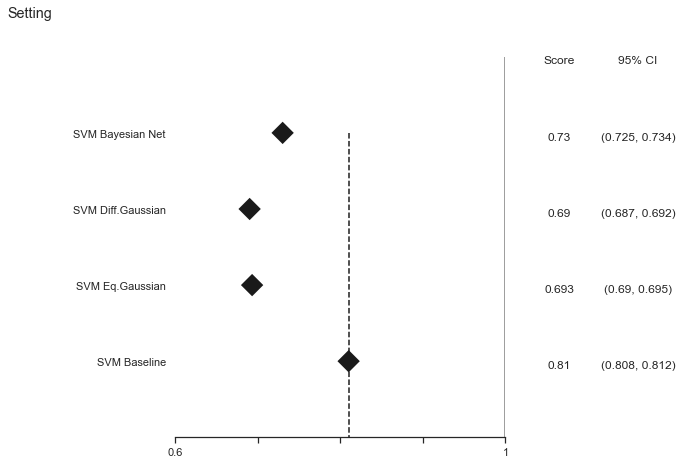

In [439]:
!pip install zepid
import matplotlib.image as mpimg
import numpy as np
import matplotlib.pyplot as plt
import zepid
from zepid.graphics import EffectMeasurePlot
##SVM

labs = ["SVM Bayesian Net",
        "SVM Diff.Gaussian",
        "SVM Eq.Gaussian",
        "SVM Baseline"]


measure = [ .73, .69, .693, .81]
lower = [ .725, .687, .69, .808]
upper = [ .734, .692, .695, .812]
p= EffectMeasurePlot(label=labs, effect_measure=measure, lcl=lower, ucl=upper)
p.labels(effectmeasure='Score',  scale = "linear")
p.colors(pointshape="D")
ax=p.plot(figsize=(9,7), t_adjuster=0.09, max_value=1, size = 10 )
plt.title(" ",loc = 'right',x=1, y=1.045)
ax.set_xticks([.6,.7,.8,.9, 1])
ax.set_xlabels = (.5,.6,.7,.8,.9)
plt.suptitle("Setting",x=-0.1,y=0.98)
ax.vlines(.81, 0, 9, linestyles = 'dashed', color = "k")
#ax.set_xlabel("Favours Control      Favours Haloperidol       ", fontsize=10)
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.spines['bottom'].set_visible(True)
ax.spines['left'].set_visible(False)

plt.savefig("SVM_forestPlot.png")


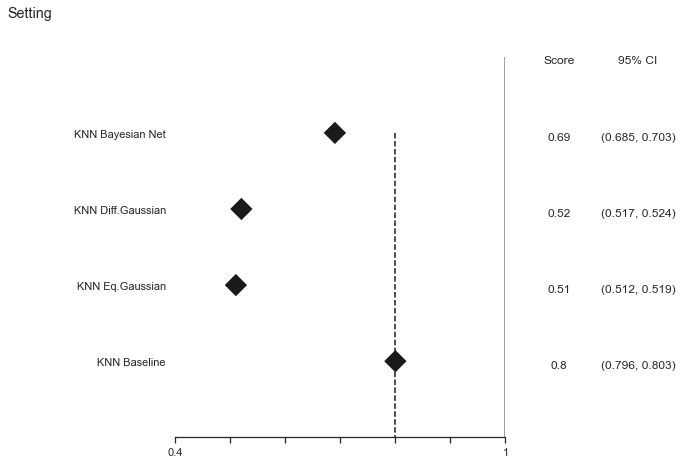

In [440]:
# KNN

labs = ["KNN Bayesian Net",
        "KNN Diff.Gaussian",
        "KNN Eq.Gaussian",
        "KNN Baseline"]


measure = [ .69, .52, .51, .80]
lower = [ .685, .517, .512, .796]
upper = [ .703, .524, .519, .803]
p= EffectMeasurePlot(label=labs, effect_measure=measure, lcl=lower, ucl=upper)
p.labels(effectmeasure='Score',  scale = "linear")
p.colors(pointshape="D")
ax=p.plot(figsize=(9,7), t_adjuster=0.09, max_value=1,  size = 10 )
plt.title(" ",loc = 'right',x=1, y=1.045)
ax.set_xticks([.4,.5,.6,.7,.8,.9, 1])
ax.set_xlabels = ([.4,.5,.6,.7,.8,.9])
plt.suptitle("Setting",x=-0.1,y=0.98)
ax.vlines(.80, 0, 9, linestyles = 'dashed', color = "k")
#ax.set_xlabel("Favours Control      Favours Haloperidol       ", fontsize=10)
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.spines['bottom'].set_visible(True)
ax.spines['left'].set_visible(False)

plt.savefig("KNN_forestPlot.png")


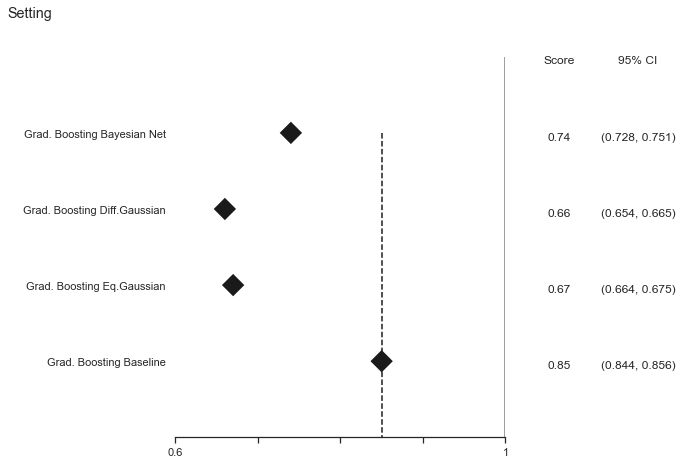

In [441]:
# GradBoost

labs = ["Grad. Boosting Bayesian Net",
        "Grad. Boosting Diff.Gaussian",
        "Grad. Boosting Eq.Gaussian",
        "Grad. Boosting Baseline"]


measure = [ .74, .66, .67, .85]
lower = [ .728, .654, .664, .844]
upper = [ .751, .665, .675, .856]
p= EffectMeasurePlot(label=labs, effect_measure=measure, lcl=lower, ucl=upper)
p.labels(effectmeasure='Score',  scale = "linear")
p.colors(pointshape="D")
ax=p.plot(figsize=(9,7), t_adjuster=0.09, max_value=1, size = 10 )
plt.title(" ",loc = 'right',x=1, y=1.045)
ax.set_xticks([.6,.7,.8,.9, 1])
ax.set_xlabels = (.6,.7,.8,.9)
plt.suptitle("Setting",x=-0.1,y=0.98)
ax.vlines(.85, 0, 9, linestyles = 'dashed', color = "k")
#ax.set_xlabel("Favours Control      Favours Haloperidol       ", fontsize=10)
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.spines['bottom'].set_visible(True)
ax.spines['left'].set_visible(False)

plt.savefig("GradBoost_forestPlot.png")

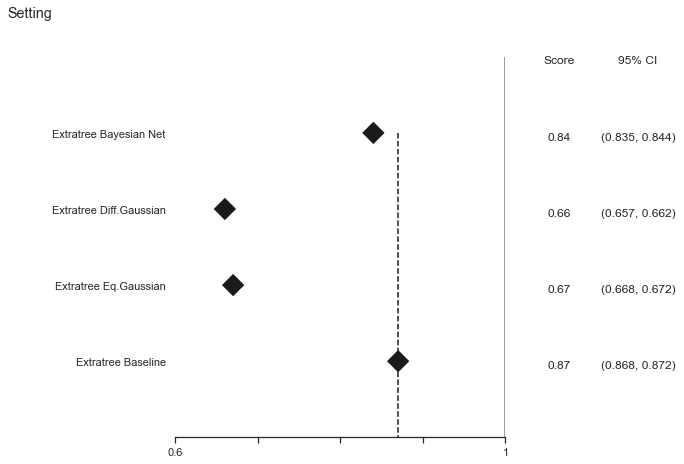

In [442]:
# EXTRATREE

labs = ["Extratree Bayesian Net",
        "Extratree Diff.Gaussian",
        "Extratree Eq.Gaussian",
        "Extratree Baseline"]


measure = [ .84, .66, .67, .87]
lower = [ .835, .657, .668, .868]
upper = [ .844, .662, .672, .872]
p= EffectMeasurePlot(label=labs, effect_measure=measure, lcl=lower, ucl=upper)
p.labels(effectmeasure='Score',  scale = "linear")
p.colors(pointshape="D")
ax=p.plot(figsize=(9,7), t_adjuster=0.09, max_value=1, size = 10 )
plt.title(" ",loc = 'right',x=1, y=1.045)
ax.set_xticks([.6,.7,.8,.9, 1])
ax.set_xlabels = (.6,.7,.8,.9)
plt.suptitle("Setting",x=-0.1,y=0.98)
ax.vlines(.87, 0, 9, linestyles = 'dashed', color = "k")
#ax.set_xlabel("Favours Control      Favours Haloperidol       ", fontsize=10)
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.spines['bottom'].set_visible(True)
ax.spines['left'].set_visible(False)

plt.savefig("Extratree_forestPlot.png")

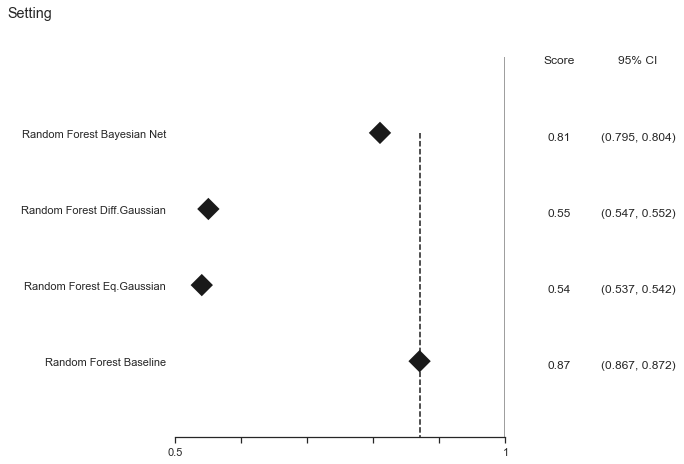

In [443]:
# Random Forest

labs = ["Random Forest Bayesian Net",
        "Random Forest Diff.Gaussian",
        "Random Forest Eq.Gaussian",
        "Random Forest Baseline"]


measure = [ .81, .55, .54, .87]
lower = [ .795, .547, .537, .867]
upper = [ .904, .552, .542, .872]
p= EffectMeasurePlot(label=labs, effect_measure=measure, lcl=lower, ucl=upper)
p.labels(effectmeasure='Score',  scale = "linear")
p.colors(pointshape="D")
ax=p.plot(figsize=(9,7), t_adjuster=0.09, max_value=1, min_value=.5, size = 10 )
plt.title(" ",loc = 'right',x=1, y=1.045)
ax.set_xticks([.5,.6,.7,.8,.9, 1])
ax.set_xlabels = (.6,.7,.8,.9)
plt.suptitle("Setting",x=-0.1,y=0.98)
ax.vlines(.87, 0, 9, linestyles = 'dashed', color = "k")
#ax.set_xlabel("Favours Control      Favours Haloperidol       ", fontsize=10)
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.spines['bottom'].set_visible(True)
ax.spines['left'].set_visible(False)

plt.savefig("RandomForest_forestPlot.png")

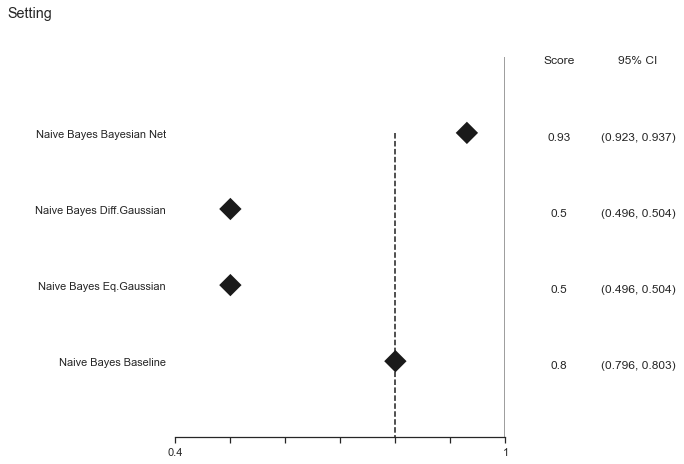

In [444]:
# Naive Bayes

labs = ["Naive Bayes Bayesian Net",
        "Naive Bayes Diff.Gaussian",
        "Naive Bayes Eq.Gaussian",
        "Naive Bayes Baseline"]


measure = [ .93, .50, .50, .80]
lower = [ .923, .496, .496, .796]
upper = [ .937, .504, .504, .803]
p= EffectMeasurePlot(label=labs, effect_measure=measure, lcl=lower, ucl=upper)
p.labels(effectmeasure='Score',  scale = "linear")
p.colors(pointshape="D")
ax=p.plot(figsize=(9,7), t_adjuster=0.09, max_value=1,  size = 10 )
plt.title(" ",loc = 'right',x=1, y=1.045)
ax.set_xticks([.4,.5,.6,.7,.8,.9, 1])
ax.set_xlabels = (.4,.5,.6,.7,.8,.9)
plt.suptitle("Setting",x=-0.1,y=0.98)
ax.vlines(.8, 0, 9, linestyles = 'dashed', color = "k")
#ax.set_xlabel("Favours Control      Favours Haloperidol       ", fontsize=10)
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.spines['bottom'].set_visible(True)
ax.spines['left'].set_visible(False)

plt.savefig("NaiveBayes_forestPlot.png")

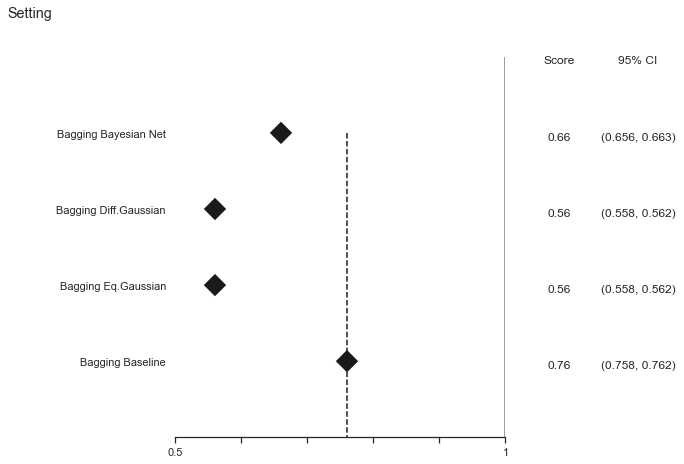

In [445]:
# BAGGING

labs = ["Bagging Bayesian Net",
        "Bagging Diff.Gaussian",
        "Bagging Eq.Gaussian",
        "Bagging Baseline"]


measure = [ .66, .56, .56, .76]
lower = [ .656, .558, .558, .758]
upper = [ .663, .562, .562, .762]
p= EffectMeasurePlot(label=labs, effect_measure=measure, lcl=lower, ucl=upper)
p.labels(effectmeasure='Score',  scale = "linear")
p.colors(pointshape="D")
ax=p.plot(figsize=(9,7), t_adjuster=0.09, max_value=1, min_value=.5, size = 10 )
plt.title(" ",loc = 'right',x=1, y=1.045)
ax.set_xticks([.5,.6,.7,.8,.9, 1])
ax.set_xlabels = (.6,.7,.8,.9)
plt.suptitle("Setting",x=-0.1,y=0.98)
ax.vlines(.76, 0, 9, linestyles = 'dashed', color = "k")
#ax.set_xlabel("Favours Control      Favours Haloperidol       ", fontsize=10)
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.spines['bottom'].set_visible(True)
ax.spines['left'].set_visible(False)

plt.savefig("Bagging_forestPlot.png")

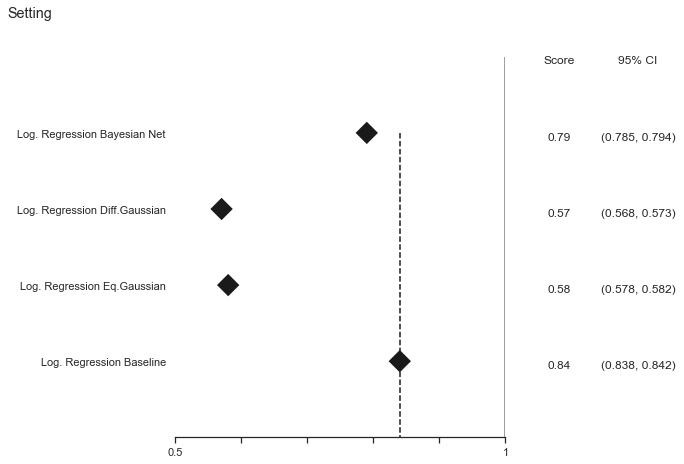

In [446]:
# LOG. REGRESSION

labs = ["Log. Regression Bayesian Net",
        "Log. Regression Diff.Gaussian",
        "Log. Regression Eq.Gaussian",
        "Log. Regression Baseline"]


measure = [ .79, .57, .58, .84]
lower = [ .785, .568, .578, .838]
upper = [ .794, .5727, .582, .842]
p= EffectMeasurePlot(label=labs, effect_measure=measure, lcl=lower, ucl=upper)
p.labels(effectmeasure='Score',  scale = "linear")
p.colors(pointshape="D")
ax=p.plot(figsize=(9,7), t_adjuster=0.09, max_value=1, min_value=.5, size = 10 )
plt.title(" ",loc = 'right',x=1, y=1.045)
ax.set_xticks([.5,.6,.7,.8,.9, 1])
ax.set_xlabels = (.5,.6,.7,.8,.9)
plt.suptitle("Setting",x=-0.1,y=0.98)
ax.vlines(.84, 0, 9, linestyles = 'dashed', color = "k")
#ax.set_xlabel("Favours Control      Favours Haloperidol       ", fontsize=10)
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.spines['bottom'].set_visible(True)
ax.spines['left'].set_visible(False)

plt.savefig("LogReg_forestPlot.png")

# Heatmaps corrette

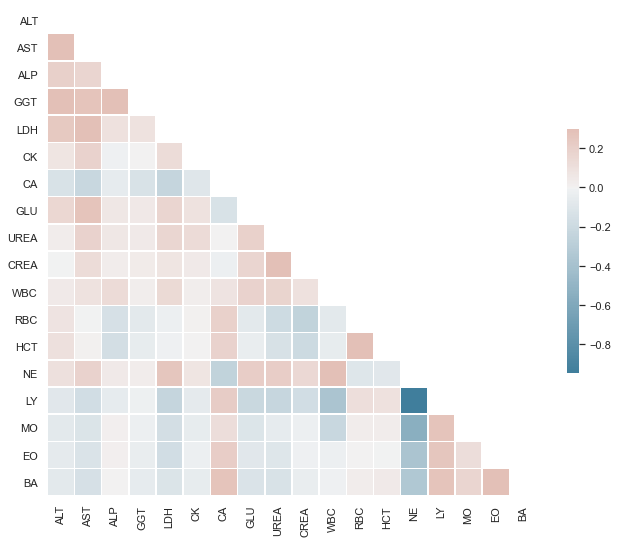

In [426]:
train_final_cor = train_final[['ALT', 'AST', 'ALP', 'GGT', 'LDH', 'CK', 'CA', 'GLU', 'UREA', 'CREA', 'WBC', 'RBC', 'HCT', 'NE', 'LY', 'MO', 'EO', 'BA']]

sns.set_theme(style="white")

# Compute the correlation matrix
corr = train_final_cor.corr()

# Generate a mask for the upper triangle
mask = np.triu(np.ones_like(corr, dtype=bool))

# Set up the matplotlib figure
f, ax = plt.subplots(figsize=(11, 9))

# Generate a custom diverging colormap
cmap = sns.diverging_palette(230, 20, as_cmap=True)

# Draw the heatmap with the mask and correct aspect ratio
sns.heatmap(corr, mask=mask, cmap=cmap, vmax=.3, center=0,
            square=True, linewidths=.5, cbar_kws={"shrink": .5})

plt.savefig('/Users/enricoconte/Desktop/Tesi/Workspace_Tesi/grafici/df_originale/heatmap_originale2.png')  

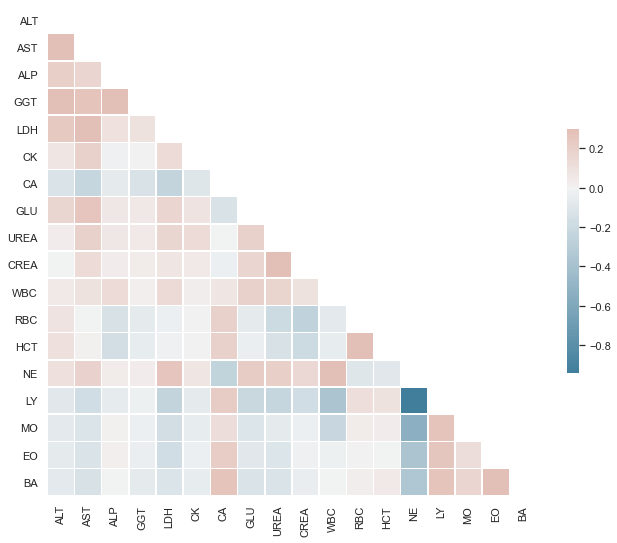

In [421]:
dati_perturbati = pd.read_csv('/Users/enricoconte/Desktop/Tesi/Workspace_Tesi/dati/noised_data/dati_perturbati.csv')
dati_perturbati_cor = dati_perturbati[['ALT', 'AST', 'ALP', 'GGT', 'LDH', 'CK', 'CA', 'GLU', 'UREA', 'CREA', 'WBC', 'RBC', 'HCT', 'NE', 'LY', 'MO', 'EO', 'BA']]
dati_perturbati_cor

sns.set_theme(style="white")

# Compute the correlation matrix
corr = dati_perturbati_cor.corr()

# Generate a mask for the upper triangle
mask = np.triu(np.ones_like(corr, dtype=bool))

# Set up the matplotlib figure
f, ax = plt.subplots(figsize=(11, 9))

# Generate a custom diverging colormap
cmap = sns.diverging_palette(230, 20, as_cmap=True)

# Draw the heatmap with the mask and correct aspect ratio
sns.heatmap(corr, mask=mask, cmap=cmap, vmax=.3, center=0,
            square=True, linewidths=.5, cbar_kws={"shrink": .5})

plt.savefig('/Users/enricoconte/Desktop/Tesi/Workspace_Tesi/grafici/df_gaussian/heatmap_gaussian2.png')  

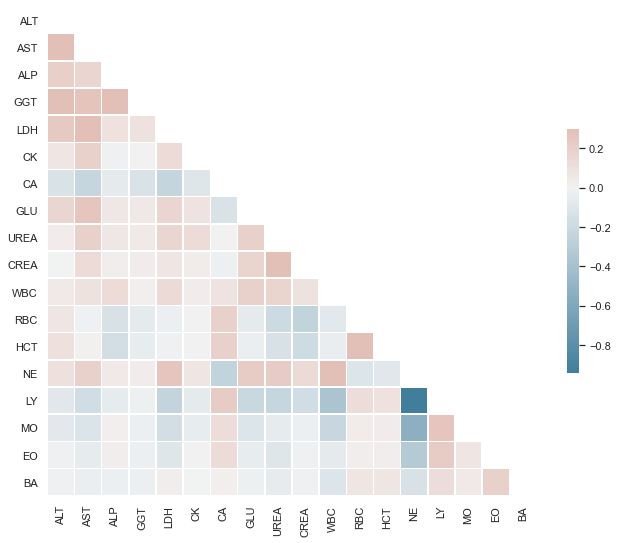

In [422]:
dati_pert_diff = pd.read_csv('/Users/enricoconte/Desktop/Tesi/Workspace_Tesi/dati/noised_data_differenziati/dati_perturbati_differenziati.csv')
dati_pert_diff_cor = dati_pert_diff[['ALT', 'AST', 'ALP', 'GGT', 'LDH', 'CK', 'CA', 'GLU', 'UREA', 'CREA', 'WBC', 'RBC', 'HCT', 'NE', 'LY', 'MO', 'EO', 'BA']]
dati_pert_diff_cor

sns.set_theme(style="white")

# Compute the correlation matrix
corr = dati_pert_diff_cor.corr()

# Generate a mask for the upper triangle
mask = np.triu(np.ones_like(corr, dtype=bool))

# Set up the matplotlib figure
f, ax = plt.subplots(figsize=(11, 9))

# Generate a custom diverging colormap
cmap = sns.diverging_palette(230, 20, as_cmap=True)

# Draw the heatmap with the mask and correct aspect ratio
sns.heatmap(corr, mask=mask, cmap=cmap, vmax=.3, center=0,
            square=True, linewidths=.5, cbar_kws={"shrink": .5})

plt.savefig('/Users/enricoconte/Desktop/Tesi/Workspace_Tesi/grafici/df_differenziato/heatmap_diff2.png')  

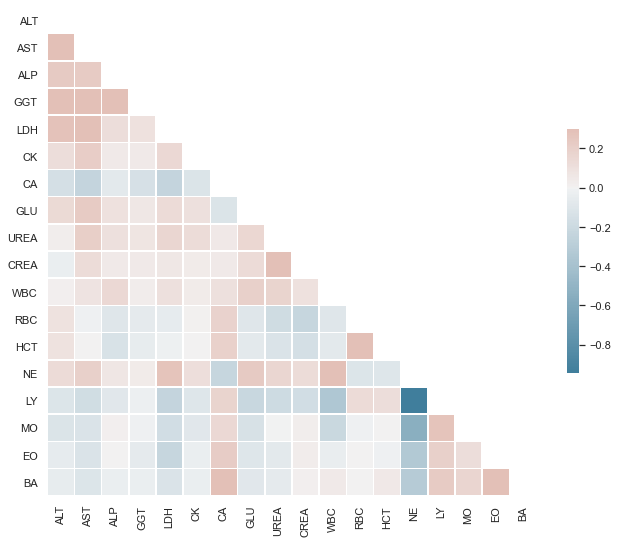

In [497]:
dati_bnet = pd.read_csv('/Users/enricoconte/Desktop/Tesi/Workspace_Tesi/dati/B_Net_data/bnet_R.csv')
dati_bnet_cor = dati_bnet[['ALT', 'AST', 'ALP', 'GGT', 'LDH', 'CK', 'CA', 'GLU', 'UREA', 'CREA', 'WBC', 'RBC', 'HCT', 'NE', 'LY', 'MO', 'EO', 'BA']]
dati_bnet_cor

sns.set_theme(style="white")

# Compute the correlation matrix
corr = dati_bnet_cor.corr()

# Generate a mask for the upper triangle
mask = np.triu(np.ones_like(corr, dtype=bool))

# Set up the matplotlib figure
f, ax = plt.subplots(figsize=(11, 9))

# Generate a custom diverging colormap
cmap = sns.diverging_palette(230, 20, as_cmap=True)

# Draw the heatmap with the mask and correct aspect ratio
sns.heatmap(corr, mask=mask, cmap=cmap, vmax=.3, center=0,
            square=True, linewidths=.5, cbar_kws={"shrink": .5})

plt.savefig('/Users/enricoconte/Desktop/Tesi/Workspace_Tesi/grafici/df_bnet/heatmap_bnet2.png')  